In [4]:
import os
import pickle as pickle
import tensorflow as tf
import numpy as np
from Stats import WeightQuantization,IntroduceFaultsInWeights,GenerateFaultsList,CheckAccuracyAndLoss
from Nets_original import GetNeuralNetworkModel
from Training import GetDatasets
from Simulation import get_all_outputs
from Simulation import buffer_simulation, save_obj, load_obj
from datetime import datetime
import collections 
import pandas as pd
import random
from Simulation import save_obj, load_obj
from funciones import buffer_vectores
import collections
from datetime import datetime
import itertools
import matplotlib.pyplot as plt
import pathlib
import os, sys
from tensorflow.python.ops import bitwise_ops
from funciones import VeryBadWords,FlipPatchBetter,VBWGoToScratch,DeleteTercioRamdom, WordType

In [ ]:
# analisis de los datos

In [9]:
voltajes = np.array([60,59,58,57,56,55,54])
fallos = np.array([4,24,146,772,2732,7520,23706])

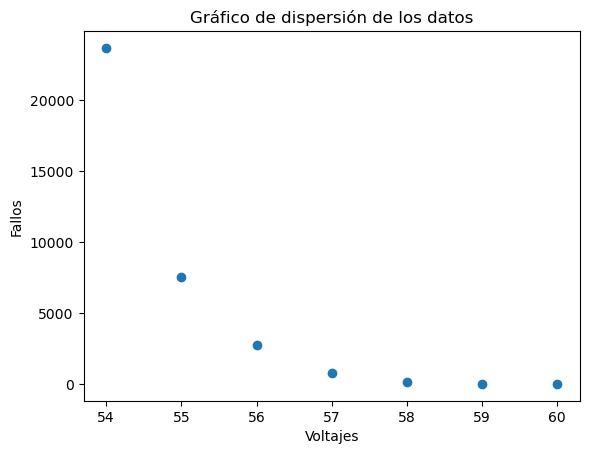

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Datos proporcionados

# Gráfico de dispersión
plt.scatter(voltajes, fallos)
plt.xlabel('Voltajes')
plt.ylabel('Fallos')
plt.title('Gráfico de dispersión de los datos')
plt.show()

In [12]:
correlacion = np.corrcoef(voltajes, fallos)[0, 1]
print("Coeficiente de correlación:", correlacion)

Coeficiente de correlación: -0.7878175707882488


In [5]:
from sklearn.metrics import r2_score

# Calcular R^2 para el modelo exponencial
r2_exponencial = r2_score(fallos, modelo_exponencial(voltajes, *parametros_exponencial))
print("R^2 para modelo exponencial:", r2_exponencial)

R^2 para modelo exponencial: -2.1215261161943212e+16


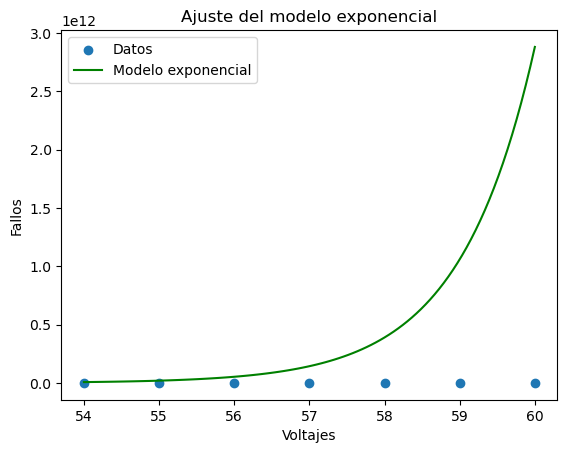

In [7]:
plt.scatter(voltajes, fallos, label='Datos')
plt.plot(voltajes_pred, fallos_exponencial, color='green', label='Modelo exponencial')
plt.xlabel('Voltajes')
plt.ylabel('Fallos')
plt.title('Ajuste del modelo exponencial')
plt.legend()
plt.show()

# Eliminar la tercera parte de las VBW

In [23]:
from random import seed, choice

def eliminar_elementos_aleatorios_en_conjunto(lista1, lista2, indices, semilla=3):
    seed(semilla)
    cantidad_eliminar = len(indices) // 3
    indices_a_eliminar = [choice(indices) for _ in range(cantidad_eliminar)]
    print('indices_a_eliminar',indices_a_eliminar)
    elementos_eliminados = []
    for indice in sorted(indices_a_eliminar, reverse=True):
        print('indice',indice)
        elemento_eliminado1 = lista1.pop(indice)
        elemento_eliminado2 = lista2.pop(indice)
        elementos_eliminados.append((indice, elemento_eliminado1, elemento_eliminado2))
    return elementos_eliminados
# Ejemplo de uso
valores = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
posiciones_en_buffer = [5, 1, 8, 3, 4, 5, 6, 7, 8, 9]
indices_a_eliminar = [1, 3, 5, 7,8,9]  # Por ejemplo, los índices que quieres eliminar
semilla = 42  # Semilla para la reproducibilidad

elementos_eliminados = eliminar_elementos_aleatorios_en_conjunto(valores, posiciones_en_buffer, indices_a_eliminar, semilla)
print("Elementos eliminados con sus índices:")
for indice, valor, posicion in elementos_eliminados:
    print(f"Índice: {indice}, Valor: {valor}, Posición en buffer: {posicion}")

print("Lista de valores después de la eliminación:", valores)
print("Lista de posiciones en buffer después de la eliminación:", posiciones_en_buffer)

indices_a_eliminar [9, 1]
indice 9
indice 1
Elementos eliminados con sus índices:
Índice: 9, Valor: 100, Posición en buffer: 9
Índice: 1, Valor: 20, Posición en buffer: 1
Lista de valores después de la eliminación: [10, 30, 40, 50, 60, 70, 80, 90]
Lista de posiciones en buffer después de la eliminación: [5, 8, 3, 4, 5, 6, 7, 8]


In [28]:
from random import seed
from random import sample

def DeleteTercioRamdom(error_mask,locs, index_locs_VBW, semilla=41):
    seed(semilla)
    cantidad_eliminar =8
    indices_a_eliminar = [sample(index_locs_VBW) for _ in range(cantidad_eliminar)]
    elementos_eliminados = []
    for index_locs_VBW in sorted(indices_a_eliminar, reverse=True):
        locs_eliminada = locs.pop(index_locs_VBW)
        mask_eleiminada=error_mask.pop(index_locs_VBW)
        elementos_eliminados.append((index_locs_VBW, mask_eleiminada,locs_eliminada))
    print('tamaño de la máscara',len(error_mask))
    print('tamaño de la locs', len(locs))
    return error_mask, locs

valores = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
posiciones_en_buffer = [5, 1, 8, 3, 4, 5, 6, 7, 9, 10]
indices_a_eliminar = [1, 3, 5, 7,8,9]  # Por ejemplo, los índices que quieres eliminar
semilla = 42  # Semilla para la reproducibilidad

elementos_eliminados = eliminar_elementos_aleatorios_en_conjunto(valores, posiciones_en_buffer, indices_a_eliminar, semilla)
print("Elementos eliminados con sus índices:")
for indice, valor, posicion in elementos_eliminados:
    print(f"Índice: {indice}, Valor: {valor}, Posición en buffer: {posicion}")

print("Lista de valores después de la eliminación:", valores)
print("Lista de posiciones en buffer después de la eliminación:", posiciones_en_buffer)

indices_a_eliminar [9, 1]
indice 9
indice 1
Elementos eliminados con sus índices:
Índice: 9, Valor: 100, Posición en buffer: 10
Índice: 1, Valor: 20, Posición en buffer: 1
Lista de valores después de la eliminación: [10, 30, 40, 50, 60, 70, 80, 90]
Lista de posiciones en buffer después de la eliminación: [5, 8, 3, 4, 5, 6, 7, 9]


In [32]:
from random import sample
valores = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
posiciones_en_buffer = [5, 1, 8, 3, 4, 5, 6, 7, 9, 10]
indices_a_eliminar = [1, 3, 5, 7,8,9]
# locs_H_L_O es la lista de la cual queremos seleccionar índices únicos
# cantidad_eliminar es la cantidad de índices únicos que queremos seleccionar
indices_a_eliminar = sample(valores, indices_a_eliminar)

TypeError: '<=' not supported between instances of 'int' and 'list'

In [29]:
vol=0.52
inc = 0
#
error_mask = load_obj('MoRS/Modelo3_col_8_' + str(vol) + '/mask/error_mask_' + str(inc))
locs = load_obj('MoRS/Modelo3_col_8_' + str(vol) + '/mask/locs_' + str(inc))


In [30]:
error_mask_H_L_O,locs_,VBW_antes,index_locs_VBW = VeryBadWords(error_mask,locs)
df_VBW = pd.DataFrame(VBW_antes)

estoy dentro VeryBadWords
perfect_word 0
count_bit_les 129027
coun_bit_more 114391
count_bit_conf 24486


In [31]:
DeleteTercioRamdom(error_mask,locs,index_locs_VBW)

tamaño de la máscara 259742
tamaño de la locs 259742


(['xxxxxxxxxxxxxxx0',
  'xxxxxxx0xxxxxxxx',
  'xxxxxxxx0xxxxxxx',
  '1xxxxxxxxxxxxxxx',
  'xxxxxxxxxxxxxx0x',
  'xxxxxx0xxxxxxxxx',
  'xxxxxxxxxxxxx0xx',
  'xxxxx1xxxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx0xxxxxxxxxxxx',
  'xxxxxxxxxxxxxx1x',
  'xx1xxxxxxxxxxxxx',
  'xxxxxxxxxxxx1xxx',
  'xxxx1xxxxxxxxxxx',
  'xxxxxxxxxxxxxx0x',
  'xxxxxx1xxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx0xxxxxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx0xxxxxxxxxxxx',
  'xxxxxxxxxxxxxx1x',
  'xxxxxx1xxxxxxxxx',
  'xxxxxxxxxxxxx0xx',
  'xxxxx1xxxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx0xxxxxxxxxxxx',
  'xxxxxxxxx1xxxxx1',
  'xxxxxxxxxxx1xxxx',
  'xxx1xxxxxxxxx1xx',
  'xxxxx0xxxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx0xxxxxxxxxxxx',
  'xxxxxxxxxxx0xxxx',
  'xxx1xxxxxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx0xxxxxxxxxxxx',
  'xxxxxxxxxxxx1xxx',
  'xxxx0xxxxxxxxxxx',
  'xxxxxxxxxxxxxx0x',
  'xxxxxx0xxxxxxxxx',
  'xxxxxxxxxxx1xxxx',
  'xxx1xxxxxxxxxxxx',
  'xxxxxxxxxxxxxx0x',
  'xxxxxx0xxxxxxxxx',
  'xxxxxxxxxxxx0xxx',
  'xxxx0xx

In [33]:
error_mask_H_L_O,locs,VBW,index_locs_VBW = VeryBadWords(error_mask,locs)
df_VBW = pd.DataFrame(VBW)

with pd.ExcelWriter('MoRS/Analisis_Resultados/Energía_VBW/layers_analysis_read_writing_sizes/AlexNet_VBW_less' + str(vol) + '.xlsx') as writer:
         df_VBW.to_excel(writer, sheet_name='base', index=False)

estoy dentro VeryBadWords
perfect_word 0
count_bit_les 128792
coun_bit_more 113556
count_bit_conf 17394


# Simulación del  las lecturas en convoluciones


In [57]:
def convolucion_sin_solapamiento(capa, kernel, stride=(1, 1), padding=0):
    # Obtener las dimensiones de la capa y el kernel
    h_capa, w_capa = capa.shape[:2]
    h_kernel, w_kernel = kernel.shape[:2]
    
    # Calculo las dimensiones de la capa resultante
    h_salida = (h_capa - h_kernel + 2 * padding) // stride[0] + 1
    w_salida = (w_capa - w_kernel + 2 * padding) // stride[1] + 1
    
    # Inicializaras la capa resultante
    capa_resultante = np.zeros((h_salida, w_salida))
    
    # Realizars la convolución sin solapamiento
    for i in range(0, h_capa - h_kernel + 1, stride[0]):
        for j in range(0, w_capa - w_kernel + 1, stride[1]):
            # Seleccionamos la región de la capa para aplicar el kernel
            region = capa[i:i+h_kernel, j:j+w_kernel]
            # Aplicamos el kernel y sumamos los resultados
            capa_resultante[i // stride[0], j // stride[1]] = np.sum(region * kernel)
    
    return capa_resultante

In [61]:
import numpy as np



# Ejemplo de uso
# Supongamos una capa de 5x5 con valores aleatorios
capa = np.random.rand(5, 5)
# Supongamos un kernel de 3x3
kernel = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])
# Realizo la convolución sin solapamiento
capa_resultante = convolucion_sin_solapamiento(capa, kernel)
print("Capa resultante:")
print(capa_resultante)

Capa resultante:
[[ 0.91370908 -1.49345386  1.40224256]
 [ 0.30356146 -1.52855657  1.72422506]
 [ 0.13545476 -0.43214055  0.53059952]]


In [62]:
def convolucion_sin_solapamiento(capa, kernel, stride=(1, 1), padding=0):
    # Obtener las dimensiones de la capa y el kernel
    h_capa, w_capa = capa.shape[:2]
    h_kernel, w_kernel = kernel.shape[:2]
    
    # Calcular las dimensiones de la capa resultante
    h_salida = (h_capa - h_kernel + 2 * padding) // stride[0] + 1
    w_salida = (w_capa - w_kernel + 2 * padding) // stride[1] + 1
    # el paddin lo obtengo de la cantidad de ceros que agrego en el código 
    
    # Inicializar la capa resultante y un arreglo para contar las veces que el kernel pasa por cada píxel
    capa_resultante = np.zeros((h_salida, w_salida))
    veces_kernel_pasa_por_pixel = np.zeros((h_capa, w_capa))
    
    # Realizar la convolución sin solapamiento
    for i in range(0, h_capa - h_kernel + 1, stride[0]):
        for j in range(0, w_capa - w_kernel + 1, stride[1]):
            # Seleccionar la región de la capa para aplicar el kernel
            region = capa[i:i+h_kernel, j:j+w_kernel]
            # Aplicar el kernel y sumamos los resultados
            capa_resultante[i // stride[0], j // stride[1]] = np.sum(region * kernel)
            # Contars las veces que el kernel pasa por cada píxel
            veces_kernel_pasa_por_pixel[i:i+h_kernel, j:j+w_kernel] += 1
    
    return capa_resultante, veces_kernel_pasa_por_pixel



## Codigo implementado en pyCharm para correr

In [2]:
import numpy as np

def contar_kernel_pasado(capa, kernel, stride):
    # Obtener las dimensiones de la capa y el kernel
    h_capa, w_capa, c_capa = capa.shape
    h_kernel, w_kernel = kernel.shape[:2]
    
    # Calcular las dimensiones de la capa resultante
    h_salida = (h_capa - h_kernel) // stride[0] + 1
    w_salida = (w_capa - w_kernel) // stride[1] + 1
    
    # Inicializar un array contador
    contador = np.zeros((h_salida, w_salida))
    
    # Inicializar un array para llevar registro de los píxeles visitados
    visitados = np.zeros((h_capa, w_capa), dtype=bool)
    region_visitada=np.zeros((h_capa, w_capa), dtype=bool)
    print(visitados.shape)
    
    # Realizar la convolución y contar solo los nuevos píxeles visitados
    for i in range(0, h_capa - h_kernel + 1, stride[0]):
        print('i',i)
        for j in range(0, w_capa - w_kernel + 1, stride[1]):
            print('j',j)
            # Verificar si los píxeles en esta región ya han sido visitados
            region_visitada = visitados[i:i+h_kernel, j:j+w_kernel]
            print('region_visitada',region_visitada)
            #print('tamaño regiosn visitada',len(region_visitada))
            break
    
            if not np.any(region_visitada):
                # Incrementar el contador solo si los píxeles son nuevos
                contador[i // stride[0], j // stride[1]] += 1
                print('contador',contador)
                #break
                # Marcar los píxeles como visitados para todos los canales
                visitados[i:i+h_kernel, j:j+w_kernel] = True
                print('visitados',np.sum(visitados)  )
                print('visitados',visitados[0])
    print('visitados',np.sum(visitados)  )
    return contador

# Ejemplo de uso
capa = np.random.randint(0, 2, (6, 6, 3))  # Capa binaria de 227x227x3
#print(capa)
kernel = np.ones((2, 2))  # Kernel de unos de 11x11

contador = contar_kernel_pasado(capa, kernel, stride=(1,1 ))

print("Contador de veces que el kernel pasa por cada píxel:", np.sum(contador))

(6, 6)
i 0
j 0
region_visitada [[False False]
 [False False]]
i 1
j 0
region_visitada [[False False]
 [False False]]
i 2
j 0
region_visitada [[False False]
 [False False]]
i 3
j 0
region_visitada [[False False]
 [False False]]
i 4
j 0
region_visitada [[False False]
 [False False]]
visitados 0
Contador de veces que el kernel pasa por cada píxel: 0.0


### Prfeccionando el codigo implementado

In [32]:
import numpy as np

def contar_kernel_pasado(capa, kernel, stride):
    # Obtener las dimensiones de la capa y el kernel
    h_capa, w_capa, c_capa = capa.shape
    h_kernel, w_kernel = kernel.shape[:2]
    
    # Calcular las dimensiones de la capa resultante
    h_salida = (h_capa - h_kernel) // stride[0] + 1
    w_salida = (w_capa - w_kernel) // stride[1] + 1
    
    # Inicializar un array contador
    contador = np.zeros((h_salida, w_salida))
    
    # Inicializar un array para llevar registro de los píxeles visitados
    visitados = np.zeros((h_capa, w_capa), dtype=bool)
    save_region_visitada=np.zeros((h_capa, w_capa), dtype=bool)
    print(visitados.shape)
    
    # Realizar la convolución y contar solo los nuevos píxeles visitados
    for i in range(0, h_capa - h_kernel + 1, stride[0]):
    
        print('i',i)
        for j in range(0, w_capa - w_kernel + 1, stride[1]):
            print('j',j)
            # Verificar si los píxeles en esta región ya han sido visitados
            region_visitada = visitados[i:i+h_kernel, j:j+w_kernel]
            save_region_visitada[i:i+h_kernel, j:j+w_kernel] = True
            break
        print('region_visitada',region_visitada)
        print('save_region_visitada',save_region_visitada)
            
            
            #print('tamaño regiosn visitada',np.sum(save_region_visitada))
           
    
        if not np.any(region_visitada):
            
            
            # Incrementar el contador solo si los píxeles son nuevos
            contador[i // stride[0], j // stride[1]] += 1
            print('contador',contador)
            #break
            # Marcar los píxeles como visitados para todos los canales
            visitados[i:i+h_kernel, j:j+w_kernel] = True
            print('visitados',np.sum(visitados)  )
            print('visitados',visitados[0])
    print('visitados',np.sum(visitados)  )
    return contador

# Ejemplo de uso
capa = np.random.randint(0, 2, (6, 6, 3))  # Capa binaria de 227x227x3
#print(capa)
kernel = np.ones((2, 2))  # Kernel de unos de 11x11

contador = contar_kernel_pasado(capa, kernel, stride=(1,1 ))

print("Contador de veces que el kernel pasa por cada píxel:", np.sum(contador))

(6, 6)
i 0
j 0
region_visitada [[False False]
 [False False]]
save_region_visitada [[ True  True False False False False]
 [ True  True False False False False]
 [False False False False False False]
 [False False False False False False]
 [False False False False False False]
 [False False False False False False]]
contador [[1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
visitados 4
visitados [ True  True False False False False]
i 1
j 0
region_visitada [[ True  True]
 [False False]]
save_region_visitada [[ True  True False False False False]
 [ True  True False False False False]
 [ True  True False False False False]
 [False False False False False False]
 [False False False False False False]
 [False False False False False False]]
i 2
j 0
region_visitada [[False False]
 [False False]]
save_region_visitada [[ True  True False False False False]
 [ True  True False False False False]
 [ True  True False False False False]
 [ True  True Fals

In [63]:
# Ejemplo de uso
# Supongamos una capa de 5x5 con valores aleatorios
capa = np.random.rand(5, 5)
# Supongamos un kernel de 3x3
kernel = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])
# Realizamos la convolución sin solapamiento
capa_resultante, veces_kernel_pasa_por_pixel = convolucion_sin_solapamiento(capa, kernel)
print("Capa resultante:")
print(capa_resultante)
print("\nVeces que el kernel pasa por cada píxel:")
print(veces_kernel_pasa_por_pixel)

Capa resultante:
[[ 0.38313383  0.41647476 -1.52941201]
 [-0.55556753  0.43685375 -1.19065711]
 [-0.28414775  0.87728335 -0.03927404]]

Veces que el kernel pasa por cada píxel:
[[1. 2. 3. 2. 1.]
 [2. 4. 6. 4. 2.]
 [3. 6. 9. 6. 3.]
 [2. 4. 6. 4. 2.]
 [1. 2. 3. 2. 1.]]


In [37]:
voltaje=['0.51','0.52']

In [5]:
import numpy as np

# Dimensiones de la imagen y del kernel
dimensiones_imagen = (227, 227, 3)  # (alto, ancho, canales)
dimensiones_kernel = (11, 11)

# Stride
stride = (4, 4)

# Inicializar el array contador
contador = np.zeros(dimensiones_imagen[:2])  # Ignoramos los canales para el contador

# Calcular cuántas veces el kernel pasa por la imagen
veces_horizontal = (dimensiones_imagen[0] - dimensiones_kernel[0]) // stride[0] + 1
print(veces_horizontal)
veces_vertical = (dimensiones_imagen[1] - dimensiones_kernel[1]) // stride[1] + 1
print(veces_vertical)

# Incrementar el contador en las posiciones correspondientes
for i in range(veces_horizontal):
    for j in range(veces_vertical):
        # Actualizar el contador para cada canal
        for c in range(dimensiones_imagen[2]):
            contador[i*stride[0]:i*stride[0]+dimensiones_kernel[0], j*stride[1]:j*stride[1]+dimensiones_kernel[1]] += 1

print(contador)
print(np.sum(contador))

55
55
[[3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]
 ...
 [3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]]
1098075.0


In [3]:
import numpy as np

def contar_kernel_pasado(capa, kernel, stride):
    # Obtener las dimensiones de la capa y el kernel
    h_capa, w_capa = capa.shape[:2]
    h_kernel, w_kernel = kernel.shape[:2]
    
    # Calcular las dimensiones de la capa resultante
    h_salida = (h_capa - h_kernel) // stride[0] + 1
    w_salida = (w_capa - w_kernel) // stride[1] + 1
    
    # Inicializar un array contador
    contador = np.zeros((h_salida, w_salida))
    
    # Inicializar un array para llevar registro de los píxeles visitados
    visitados = np.zeros_like(capa, dtype=bool)
    
    # Realizar la convolución y contar solo los nuevos píxeles visitados
    for i in range(0, h_capa - h_kernel + 1, stride[0]):
        for j in range(0, w_capa - w_kernel + 1, stride[1]):
            # Verificar si los píxeles en esta región ya han sido visitados
            region_visitada = visitados[i:i+h_kernel, j:j+w_kernel]
            if not np.any(region_visitada):
                # Incrementar el contador solo si los píxeles son nuevos
                contador[i // stride[0], j // stride[1]] += 1
                # Marcar los píxeles como visitados
                visitados[i:i+h_kernel, j:j+w_kernel] = True
    
    return contador

# Ejemplo de uso
capa = np.random.randint(0, 2, (227, 227, 3))  # Capa binaria de 10x10
kernel = np.ones((11, 11))  # Kernel de unos de 3x3
contador = contar_kernel_pasado(capa, kernel, stride=(1, 1))
print("Contador de veces que el kernel pasa por cada píxel:", np.sum(contador))

Contador de veces que el kernel pasa por cada píxel: 400.0


In [4]:
import numpy as np

# Dimensiones de la imagen y del kernel
dimensiones_imagen = (227, 227)
dimensiones_kernel = (11, 11)

# Stride
stride = (4, 4)

# Inicializar el array de salida
salida = np.zeros(dimensiones_imagen)

# Calcular cuántas veces el kernel pasa por la imagen
veces_horizontal = (dimensiones_imagen[0] - dimensiones_kernel[0]) // stride[0] + 1
veces_vertical = (dimensiones_imagen[1] - dimensiones_kernel[1]) // stride[1] + 1

# Marcar con 1 las veces que el kernel pasa por la imagen solo una vez
for i in range(veces_horizontal):
    for j in range(veces_vertical):
        salida[i*stride[0]:i*stride[0]+dimensiones_kernel[0], j*stride[1]:j*stride[1]+dimensiones_kernel[1]] += 1

# Convertir valores mayores a 1 a 1
salida[salida > 1] = 1

print(salida)
print(np.sum(salida))

[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]
51529.0


In [45]:
for i in range(2):
    print(voltaje[i])
    vol=voltaje[i]=[]
    print(type(vol))

[]
<class 'list'>
[]
<class 'list'>


In [19]:
#pd.read_excel('Analizando_fichero_detalle/tamaño de las redes/Incep.xlsx'
df = pd.read_excel('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Estad_H_L_O0.xlsx')
df

,error_mask_H_L_O,locs_H_L_O,vias
0,xx0xxxxxxx1xx0xx,52992,0
1,1xxxxxxxx1xxxxxx,54784,0
2,xxx0xxxxxxx0xxxx,86272,0
3,xxxxxx0xxxx0xxxx,104704,0
4,xxx0xxxxxxx1xxxx,204544,0
...,...,...,...
2296,xxxx1xxxxxxxxx0x,823295,255
2297,xxxxxxx1xxxxxxx0,866815,255
2298,xxxx0xxxxxxx0xxx,1013503,255
2299,x1xxxxxxx0xxxxxx,1024255,255


In [1]:
#error_mask = load_obj('MoRS/mask_VC_707/error_mask_0')
##locs = load_obj('MoRS/Modelo3_col_8_0.54/mask/locs_0')
#error_mask

# Extraer valores de un excel para un alista python 

In [9]:
pwd


'C:\\Users\\usuario\\Desktop\\CNN_Gating'

In [8]:
cd Desktop\Undervolted_CNN_ Accelerators\Experimentos\Xception


C:\Users\usuario\Desktop\Undervolted_CNN_ Accelerators\Experimentos\Xception


In [10]:
import collections
import pickle
import openpyxl


wb = openpyxl.load_workbook('layer_name_Xception.xlsx')
ws = wb.get_sheet_by_name('write_layer')
list=[]
#Lista = collections.defaultdict(list)
for row in ws.iter_rows():
    a=int(row[0].value)
    #print(type(a))
    list.append(a)
    #list.append(row[0].value)
print(list)    

[5, 6, 11, 12, 14, 15, 21, 29, 30, 36, 44, 45, 51, 53, 60, 66, 72, 79, 85, 90, 98, 104, 110, 117, 123, 129, 136, 142, 148, 155, 161, 167, 174, 180, 186, 193, 199, 205, 212, 218, 220, 227, 232, 233, 235, 239, 240, 242]


C:\Users\usuario\AppData\Local\Temp\ipykernel_17612\2590675942.py:7: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
  ws = wb.get_sheet_by_name('write_layer')


## Shift dentro del código


In [2]:
int(0b0100000000000000)

16384

In [6]:
int(0b01000000000000000000000000000000)

1073741824

In [8]:
bin(346)

'0b101011010'

In [9]:
 "{:032b}".format(346)

'00000000000000000000000101011010'

In [ ]:
'0b0000000111100111'487
(0b0100000000000000 16384
 0b0000000000000000

In [5]:
original=  [  121 ,  170  , 32820  ,  11, 32831]
np_array= np.array(original)

In [4]:
original = np.bitwise_and(np_array, 16384)
print(original)

[0 0 0 0 0]


In [5]:
word_size=16
from tensorflow.python.ops import bitwise_ops
def ApplyFault(tensor):
    print('tensor original',tensor)
    Ogdtype = tensor.dtype
    shift = 2 ** (word_size - 1)
    factor = 2 ** 11
    tensor = tf.cast(tensor * factor, dtype=tf.int32)
    #print(tensor)
    #tensor = tf.where(tf.less(tensor, 0), -tensor + shift, tensor)
    #print('tensor luego de valorar si es negativo', tensor)
    ## En Signo guardo el valor del signo de los numeros
    ##tensor de  1 y -1 y 0 en dependencia del sigo, será 0 si el número es cero
    signo = tf.math.sign(tensor, name=None)
    print('signo', signo)
    tensor = bitwise_ops.left_shift(tensor, 1)
    print('tensor_left_shift',tensor)
    #tensor_modi = tf.bitwise.bitwise_and(tensor_left_shift, faults[:, 0])
    #tensor_modi = tf.bitwise.bitwise_or(tensor_modi, faults[:, 1])
    #print('tensor_modi',tensor_modi)
    #tensor_recuperado = bitwise_ops.right_shift(tensor_modi, 1)
    #tensor_recuperado = tf.where(tf.greater_equal(tensor_left_shift, shift), shift - tensor_left_shift, tensor_left_shift)
 
    tensor = tf.cast(tensor *signo , dtype=Ogdtype)
    print('tensor_recuperado',tensor)
    return tensor

In [6]:
def ApplyFault(tensor,faults):
    print('original',tensor)
    Ogdtype = tensor.dtype
    shift   = 2**(16-1)
    factor  = 2**11
    tensor  = tf.cast(tensor*factor,dtype=tf.int32)
    print('cast',tensor)
    signo = tf.math.sign(tensor, name=None)
    tensor  = tf.where(tf.less(tensor, 0), -tensor + shift , tensor )
    print('tensor luego de valorar si es negativo', tensor)
    test = tf.where(tf.less(tensor, 0), -tensor + shift , tensor )
    test  = tf.bitwise.bitwise_and(test,faults[:,0])
    test  = tf.bitwise.bitwise_or(test,faults[:,1])
    print('test', test)
    test  = tf.where(tf.greater_equal(test,shift), shift-test , test )
    test  = tf.cast(test/factor,dtype = Ogdtype)
    print('test flota', test)
    tensor = tf.bitwise.left_shift(tensor, 1)
    print('left_shift',tensor)
    tensor  = tf.bitwise.bitwise_and(tensor,faults[:,0])
    tensor  = tf.bitwise.bitwise_or(tensor,faults[:,1])
    print('tensor con fallos', tensor)
    tensor = tf.bitwise.right_shift(tensor, 1)
    print('right_shift',tensor)
  
    print('recuperando signo', tensor)
    tensor  = tf.where(tf.greater_equal(tensor,shift), shift-tensor , tensor )
    print('recuperando signo luego', tensor)
    tensor  = tensor*signo
    tensor  = tf.cast(tensor/factor,dtype = Ogdtype)
    print('tensor_final', tensor)
    return tensor

In [7]:
static_Error0_1= ([65535,8],[65535,16],[65535,20],[65535,12])
faults=tf.convert_to_tensor(static_Error0_1)

In [9]:
tensor_original=tf.convert_to_tensor([1.5, -1.5, 0.68,-0.68])
tensor_original

<tf.Tensor: shape=(4,), dtype=float32, numpy=array([ 1.5 , -1.5 ,  0.68, -0.68], dtype=float32)>

In [16]:
tensor_original=tf.convert_to_tensor([1.5019531, -1.5039062, 0.7845703,-0.8826172])
tensor_original

<tf.Tensor: shape=(4,), dtype=float32, numpy=array([ 1.5019531, -1.5039062,  0.7845703, -0.8826172], dtype=float32)>

In [17]:
newValues = ApplyFault(tensor_original,faults)

original tf.Tensor([ 1.5019531 -1.5039062  0.7845703 -0.8826172], shape=(4,), dtype=float32)
cast tf.Tensor([ 3076 -3080  1606 -1807], shape=(4,), dtype=int32)
tensor luego de valorar si es negativo tf.Tensor([ 3076 35848  1606 34575], shape=(4,), dtype=int32)
test tf.Tensor([ 3084 35864  1622 34575], shape=(4,), dtype=int32)
test flota tf.Tensor([ 1.5058594 -1.5117188  0.7919922 -0.8823242], shape=(4,), dtype=float32)
left_shift tf.Tensor([ 6152 71696  3212 69150], shape=(4,), dtype=int32)
tensor con fallos tf.Tensor([6152 6160 3228 3614], shape=(4,), dtype=int32)
right_shift tf.Tensor([3076 3080 1614 1807], shape=(4,), dtype=int32)
recuperando signo tf.Tensor([3076 3080 1614 1807], shape=(4,), dtype=int32)
recuperando signo luego tf.Tensor([3076 3080 1614 1807], shape=(4,), dtype=int32)
tensor_final tf.Tensor([ 1.5019531  -1.5039062   0.78808594 -0.8823242 ], shape=(4,), dtype=float32)


In [15]:
newValues = ApplyFault(tensor_original,faults)

original tf.Tensor([ 3.5019531 -5.5039062  1.6845703 -0.6826172], shape=(4,), dtype=float32)
cast tf.Tensor([  7172 -11272   3450  -1398], shape=(4,), dtype=int32)
tensor luego de valorar si es negativo tf.Tensor([ 7172 44040  3450 34166], shape=(4,), dtype=int32)
test tf.Tensor([ 7180 44056  3454 34174], shape=(4,), dtype=int32)
test flota tf.Tensor([ 3.5058594  -5.5117188   1.6865234  -0.68652344], shape=(4,), dtype=float32)
left_shift tf.Tensor([14344 88080  6900 68332], shape=(4,), dtype=int32)
tensor con fallos tf.Tensor([14344 22544  6900  2796], shape=(4,), dtype=int32)
right_shift tf.Tensor([ 7172 11272  3450  1398], shape=(4,), dtype=int32)
recuperando signo tf.Tensor([ 7172 11272  3450  1398], shape=(4,), dtype=int32)
recuperando signo luego tf.Tensor([ 7172 11272  3450  1398], shape=(4,), dtype=int32)
tensor_final tf.Tensor([ 3.5019531 -5.5039062  1.6845703 -0.6826172], shape=(4,), dtype=float32)


In [4]:
#from Stats_Shift import WeightQuantization,IntroduceFaultsInWeights,GenerateFaultsList,CheckAccuracyAndLoss
from funciones import compilNet, same_elements,buffer_vectores,Base,IsoAECC,ECC, Flip,FlipPatchBetter,FlipPatch,ShiftMask,VeryBadWords,WordType

In [5]:
inc=0
error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_' + str(inc))
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_' + str(inc))
#error_mask_new, locs,word_change = FlipPatchBetter(error_mask, locs)


In [38]:
error_mask_new, locs,word_change = FlipPatchBetter(error_mask, locs)

es igual y guardo aquí
es igual y guardo aquí
locs_modif [52992, 54784, 86272, 104704, 204544, 86273, 130817, 434433, 519681, 544257, 130818, 175362, 189954, 325378, 402434, 66563, 109315, 154115, 175363, 344835, 54788, 63236, 86532, 204036, 216068, 1285, 61957, 120837, 636933, 739077, 13062, 24582, 107270, 309510, 343558, 68103, 778759, 811015, 841479, 909319, 130568, 204040, 324616, 386056, 436744, 66825, 260361, 279817, 337161, 386057, 81162, 117770, 213002, 269834, 787466, 310027, 319755, 368139, 478475, 491019, 186892, 194572, 280076, 393996, 518924, 126221, 135437, 203789, 487437, 869901, 12814, 433166, 434190, 615182, 738574, 154127, 324879, 434959, 498447, 787471, 154128, 279824, 319760, 388368, 458256, 46865, 66833, 115473, 144913, 154129, 18706, 46866, 86034, 163602, 741906, 45587, 86291, 290067, 307475, 478227, 162836, 260884, 270356, 273428, 325908, 86805, 260885, 270357, 325909, 433941, 206102, 233238, 271894, 284950, 343830, 206103, 344855, 560663, 642327, 688151, 321816,

index locs 7268
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx0xxxxxxx1x
index 7268
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 293
index locs 7382
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxx1xxxxx0xxxx
index 7382
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 294
index locs 7418
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxx0xxxxxxx1xx
index 7418
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 295
index locs 7439
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx1xxx1xxxxx
index 7439
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 296
index locs 7462
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxx1xxxxx1xxxx
index 7462
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 297
index locs 7547
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx0xxxx0xxxx
index 7547
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 298
index locs 7643
item_new xxxxxxxxxxxxxxxx
error_mask antes xx1xxxxxxxxxxx0x
index 7643
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 299

index locs 20635
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxxx0xxxxxxx0
index 20635
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 727
index locs 20656
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxxx0xxxxxxx1
index 20656
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 728
index locs 20802
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx0xxxxxxx0x
index 20802
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 729
index locs 20894
item_new xxxxxxxxxxxxxxxx
error_mask antes xxx1xxxxxxxxx0xx
index 20894
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 730
index locs 20957
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxx1xxxxxxx0xxx
index 20957
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 731
index locs 20970
item_new xxxxxxxxxxxxxxxx
error_mask antes xxx1xxxxxxxxx1xx
index 20970
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 732
index locs 20977
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxx0xxxxxxxxx0x
index 20977
error_mask despues xxxxxxxxxxxxxxxx
count

index locs 34654
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx1xxxxxxx0x
index 34654
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1036
index locs 34942
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx0xxxxxxx0x
index 34942
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1037
index locs 34989
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx0xxxxxxx0x
index 34989
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1038
index locs 35105
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxx0xxxxxxx0xx
index 35105
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1039
index locs 35139
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx0xxxxx0xxx
index 35139
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1040
index locs 35152
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx1xxxxxxx1x
index 35152
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1041
index locs 35161
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxx1xxxxx0xxx
index 35161
error_mask despues xxxxxxxxxxxxxxxx

index locs 51950
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxx1xxxxx1xxxx
index 51950
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1226
index locs 52032
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxxxx0xxxxxxx0
index 52032
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1227
index locs 52134
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxxx0xxxxxxx0xx
index 52134
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1228
index locs 52280
item_new xxxxxxxxxxxxxxxx
error_mask antes xxx00xxxxxxx0x1x
index 52280
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1229
index locs 52351
item_new xxxxxxxxxxxxxxxx
error_mask antes xxx0xxxxxxxxx1xx
index 52351
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1230
index locs 52375
item_new xxxxxxxxxxxxxxxx
error_mask antes xxxx1xxxxxxx0xxx
index 52375
error_mask despues xxxxxxxxxxxxxxxx
count_bit_patch 1231
index locs 52384
item_new xxxxxxxxxxxxxxxx
error_mask antes xxx1xxxxxxxxxxx1
index 52384
error_mask despues xxxxxxxxxxxxxxxx

In [6]:
error_mask_H_L_O,locs_H_L_O=VeryBadWords(error_mask,locs)

estoy dentro
J xxxx1xxxxxx0xxxx
J xxxxx0xxxxxx11xx
J xxxxxxx1xxxxxxx0
J 0xxxxxxxxxxxxx0x
J 1xxxxxxxxxxxxxx1
J xxx1xxxxxxx0xxx0
J x1xxxxxxxxxxxx1x
J xxx0xxxxxxx10xxx
J xxx1xxxxxxx1xxxx
J xxx1xxxxxxx0xxxx
J xxx0xxxxxxx0xxxx
J xxx1xxxxxxx1xxxx
J xxx1xxxxxxx0xxxx
J xxx1xxxxxxx1xxxx
J xxxxx1xxxxx0xxxx
J xxx1xxxxxxx1xxxx
J xxx1xxxxxxx1xxxx
J xxx1xxxxxxx0xxxx
J xxx1xxxxxxx1xxxx
J xxx1xxxxxxx0xxxx
J xxx1xxxxxxx0xxxx
J xxx0xxxxxxx1x0xx
J xxx1xxxxxx1xxxxx
J xxx1xxxxxxx1xxxx
J xxx0xxxxxxx1xxxx
J x1xxxxxxxxx0xxxx
J xxx0xxxxxxx00xxx
J x0xxxxxxx0xxxxxx
J x0xxxxxxx0xxxxxx
J xx0xxxxxxx0xxxxx
J xx1xxxxxx0xxxxxx
J x1xxxxxxx0xxxxxx
J xxxx0xxxxx1xxxxx
J x0xxxxxxxxxx1xxx
J xxxxxxx1xxxx0xxx
J xxxxxxx1xxxxx1xx
J xxxx0xxxxxxxx1xx
J xxxx1xxxxxxxxxx0
J xx1xxxxxxxxxx1xx
J xx1xxxxxxx1xxxxx
J xx0xxxxxxxxxx0xx
J xxxxx0xxxxxxx0xx
J xxxxx1xxxxxxx0xx
J xxxxx1xxxxxxxx1x
J xxxxx1xxx1xxxxxx
J xxxx0xxxxx1xxxxx
J xx1xxxxxxxxx0xxx
J xxx0xxxxxxx1xxxx
J 1xxxxxxxxxxx1xxx
J xxxx0xxxxxxxxxx0
J xx1xxxxxxxx1xxxx
J xxx1xxxxxxx1xxxx

In [2]:
#locs_H_L_O

In [10]:
(locs_H_L_O[0:2])

[118938, 144538]

In [11]:
error_mask_H_L_O[0:2]

['xxxx1xxxxxxx0xxx', 'xx1xxxxxxxxxx1x0']

In [9]:
cwd = os.getcwd()
wgt_dir = os.path.join(cwd, 'Data')
wgt_dir = os.path.join(wgt_dir, 'Trained Weights')
wgt_dir = os.path.join(wgt_dir, 'SqueezeNet')
wgt_dir = os.path.join(wgt_dir, 'Colorectal Dataset')
wgt_dir = os.path.join(wgt_dir, 'Weights')
    
trainBatchSize = testBatchSize = 1
_, _, test_dataset = GetDatasets('colorectal_histology', (80, 5, 15), (224, 224), 8, trainBatchSize, testBatchSize)

activation_aging = [True] * 22
    
loss, acc = CheckAccuracyAndLoss('SqueezeNet', test_dataset, wgt_dir, output_shape=8, input_shape=(224, 224, 3),
                                     act_frac_size=9, act_int_size=6, wgt_frac_size=15, wgt_int_size=0,
                                     batch_size=testBatchSize, verbose=0, aging_active=activation_aging,
                                     weights_faults=False,  faulty_addresses=locs_H_L_O[0:2], masked_faults=error_mask_H_L_O[0:2])

C:\Users\usuario\anaconda3\envs\env_first\lib\site-packages\tensorflow\python\data\ops\dataset_ops.py:3703: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable.debug_mode()`.
  warnings.warn(


dentro de get neronal aplicando Shift
estoy en sq
affectedValues Tensor("lambda_1/GatherNd:0", shape=(2,), dtype=float32)
dentro de ApplyFault
tensor Tensor("lambda_1/GatherNd:0", shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor Tensor("lambda_1/Cast:0", shape=(2,), dtype=int32)
tensor Tensor("lambda_1/SelectV2:0", shape=(2,), dtype=int32)
tensor aplicar shift Tensor("lambda_1/LeftShift:0", shape=(2,), dtype=int32)
tensor despues de aplicar fallos Tensor("lambda_1/BitwiseOr:0", shape=(2,), dtype=int32)
tensor reuperar el shif Tensor("lambda_1/RightShift:0", shape=(2,), dtype=int32)
tensor recuperar signo func orig Tensor("lambda_1/SelectV2_1:0", shape=(2,), dtype=int32)
tensor despues recuperar el signo Tensor("lambda_1/mul_1:0", shape=(2,), dtype=int32)
tensor final Tensor("lambda_1/Cast_1:0", shape=(2,), dtype=float32)
affectedValues Tensor("lambda_3/GatherNd:0", shape=(2,), dtype=float32)
dentro de ApplyFault
tensor T

casi al final del tensor
affectedValues tf.Tensor([0.953125  0.9394531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.953125  0.9394531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([488 481], shape=(2,), dtype=int32)
tensor tf.Tensor([488 481], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([976 962], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3024 9158], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1512 4579], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1512 4579], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1512 4579], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.953125 8.943359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list t

affectedValues tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 53], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 53], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 106], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8302], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4151], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4151], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4151], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.107422], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02734375 0.09375   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02734375 0.09375   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 142], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8334], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4167], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.138672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.         0.23046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.23046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 118], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 118], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 236], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8428], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4214], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4214], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4214], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.230469], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01171875 0.0625    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01171875 0.0625    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.4296875  0.43164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.4296875  0.43164062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([220 221], shape=(2,), dtype=int32)
tensor tf.Tensor([220 221], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([440 442], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2480 8638], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1240 4319], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1240 4319], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1240 4319], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.421875 8.435547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.28515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.28515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

tensor despues recuperar el signo tf.Tensor([   0 4290], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.378906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([212   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], sha

affectedValues tf.Tensor([0.6171875  0.22851562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6171875  0.22851562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([316 117], shape=(2,), dtype=int32)
tensor tf.Tensor([316 117], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([632 234], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2672 8430], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1336 4215], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1336 4215], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1336 4215], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.609375 8.232422], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5292969  0.49023438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5292969  0.49023438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5527344], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5527344], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.0390625 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0390625 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([20  0], shape=(2,), dtype=int32)
tensor tf.Tensor([20  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([40  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2080 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1040 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1040 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.03125 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5703125 0.390625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5703125 0.390625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65

affectedValues tf.Tensor([0.12695312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12695312 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([65  0], shape=(2,), dtype=int32)
tensor tf.Tensor([65  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([130   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2178 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1089 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1089 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1089    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1269531 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.32617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.32617188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.9121094 0.7363281], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9121094 0.7363281], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([467 377], shape=(2,), dtype=int32)
tensor tf.Tensor([467 377], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([934 754], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2982 8950], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1491 4475], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1491 4475], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1491 4475], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9121094 8.740234 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.19140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.19140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.9375   0.953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9375   0.953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([480 488], shape=(2,), dtype=int32)
tensor tf.Tensor([480 488], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([960 976], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3008 9172], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1504 4586], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1504 4586], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1504 4586], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9375   8.957031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.25976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.25976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.146484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18554688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18554688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.24609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.24609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.17773438 0.8339844 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.8339844 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 91 427], shape=(2,), dtype=int32)
tensor tf.Tensor([ 91 427], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([182 854], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2230 9046], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1115 4523], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1115 4523], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1115 4523], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1777344 8.833984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9609375 0.953125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9609375 0.953125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([22  0], shape=(2,), dtype=int32)
tensor tf.Tensor([22  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([44  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2084 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0351562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.08984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0078125  0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0078125  0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.        0.5058594], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5058594], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 259], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 259], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 518], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8710], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4355], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4355], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4355], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.505859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00195312 0.0078125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00195312 0.0078125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 124], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 124], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 248], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8444], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4222], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4222], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4222], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.246094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.07226562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07226562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

tensor tf.Tensor([0 3], shape=(2,), dtype=int32)
tensor tf.Tensor([0 3], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 6], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8198], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4099], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4099], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4099], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.005859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=i

tensor tf.Tensor([451 385], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([902 770], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2950 8966], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1475 4483], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1475 4483], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1475 4483], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.8808594 8.755859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.16992188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16992188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 87], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 87], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 174], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8366], shape=(2,), dtype=

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 93], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 93], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 186], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8382], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4191], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.185547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.03125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.03125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65

tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03320312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03320312 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([17  0], shape=(2,), dtype=int32)
tensor tf.Tensor([17  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([34  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2082 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1041 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1041 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1041    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0332031 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.109375 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.109375 0.      ], shape

tensor despues de aplicar fallos tf.Tensor([2256 8654], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4327], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4327], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128 4327], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 8.451172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.08984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 46], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 46], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 92], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8284], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4142], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([212   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5        0.31835938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5        0.31835938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0.5058594  0.58984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5058594  0.58984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([259 302], shape=(2,), dtype=int32)
tensor tf.Tensor([259 302], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([518 604], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2566 8796], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1283 4398], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1283 4398], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1283 4398], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5058594 8.589844 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tens

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.21484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21484375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 136], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8332], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.136719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17773438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1328125  0.26367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1328125  0.26367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.48632812 0.37695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.48632812 0.37695312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([249 193], shape=(2,), dtype=int32)
tensor tf.Tensor([249 193], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([498 386], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2546 8582], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1273 4291], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1273 4291], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1273 4291], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4863281 8.380859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.25585938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.25585938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 102], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8294], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.099609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.078125   0.42773438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.078125   0.42773438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.11132812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11132812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0390625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.23046875 0.18554688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23046875 0.18554688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([118  95], shape=(2,), dtype=int32)
tensor tf.Tensor([118  95], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([236 190], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2276 8382], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1138 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1138 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1138 4191], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2226562 8.185547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.16992188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16992188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.12695312 0.2265625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12695312 0.2265625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 65 116], shape=(2,), dtype=int32)
tensor tf.Tensor([ 65 116], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([130 232], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2178 8428], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1089 4214], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1089 4214], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1089 4214], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1269531 8.230469 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.         0.24609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.24609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 126], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 126], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 252], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8444], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4222], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4222], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4222], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.246094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.         0.02148438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02148438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 11], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 11], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 22], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8214], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4107], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4107], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4107], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.021484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2,

affectedValues tf.Tensor([0.05078125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05078125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([26  0], shape=(2,), dtype=int32)
tensor tf.Tensor([26  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([52  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2100 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1050 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1050 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1050    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0507812 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.6113281 0.1015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6113281 0.1015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

tensor tf.Tensor([324 424], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([648 848], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2688 9044], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1344 4522], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1344 4522], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1344 4522], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.625    8.832031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9550781  0.94140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9550781  0.94140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([489 482], shape=(2,), dtype=int32)
tensor tf.Tensor([489 482], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([978 964], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3026 9156], shape=(2,), dtyp

affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.         0.51953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.51953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 266], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 266], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 532], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8724], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4362], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4362], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4362], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.519531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.13867188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.13867188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

tensor aplicar shift tf.Tensor([120   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2160 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1080    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.109375 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10742188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10742188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.0859375 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0859375 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([44  0], shape=(2,), dtype=int32)
tensor tf.Tensor([44  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([88  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2128 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1064 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1064 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1064    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.078125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048

affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 132], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.128906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.92578125 0.9394531 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.92578125 0.9394531 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([474 481], shape=(2,), dtype=int32)
tensor tf.Tensor([474 481], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([948 962], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2996 9158], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1498 4579], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1498 4579], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1498 4579], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9257812 8.943359 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.33203125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33203125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([170   0], shape=(2,), dtype=int32)
tensor tf.Tensor([170   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([340   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2388 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1194 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1194 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1194    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3320312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.11328125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11328125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.13085938 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.13085938 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([67  0], shape=(2,), dtype=int32)
tensor tf.Tensor([67  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([134   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2182 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1091 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1091 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1091    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1308594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], s

affectedValues tf.Tensor([0.9375    0.9453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9375    0.9453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([480 484], shape=(2,), dtype=int32)
tensor tf.Tensor([480 484], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([960 968], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3008 9164], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1504 4582], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1504 4582], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1504 4582], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9375   8.949219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]


tensor final tf.Tensor([2.6464844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.94921875 0.9550781 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94921875 0.9550781 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([486 489], shape=(2,), dtype=int32)
tensor tf.Tensor([486 489], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([972 978], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9174], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4587], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1506 4587], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4587], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9414062 8.958984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0

affectedValues tf.Tensor([0.         0.00585938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00585938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 3], shape=(2,), dtype=int32)
tensor tf.Tensor([0 3], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 6], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8198], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4099], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4099], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4099], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.005859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.6484375  0.34179688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6484375  0.34179688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]


affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

tensor final tf.Tensor([0.       8.207031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[

affectedValues tf.Tensor([0.        0.5136719], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5136719], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 263], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 263], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 526], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8718], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4359], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4359], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4359], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.513672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0703125  0.19726562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0703125  0.19726562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor despues de aplicar fallos tf.Tensor([2048 8374], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4187], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4187], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4187], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.177734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02929688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02929688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 15], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 15], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 30], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8222], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4111], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1

affectedValues tf.Tensor([0.49414062 0.8457031 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.49414062 0.8457031 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([253 433], shape=(2,), dtype=int32)
tensor tf.Tensor([253 433], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([506 866], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2546 9062], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1273 4531], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1273 4531], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1273 4531], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4863281 8.849609 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.08007812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08007812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.46875 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.46875 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([240   0], shape=(2,), dtype=int32)
tensor tf.Tensor([240   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([480   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2528 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1264 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1264 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1264    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.46875 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.4296875  0.60546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.4296875  0.60546875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [

tensor reuperar el shif tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4191], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.185547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.12304688 0.08203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12304688 0.08203125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([63 42], shape=(2,), dtype=int32)
tensor tf.Tensor([63 42], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([126  84], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2166 8276], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1083 4138], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1083 4138], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor

affectedValues tf.Tensor([0.6074219  0.31445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6074219  0.31445312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([311 161], shape=(2,), dtype=int32)
tensor tf.Tensor([311 161], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([622 322], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2662 8518], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1331 4259], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1331 4259], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1331 4259], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5996094 8.318359 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.28320312 0.94140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.28320312 0.94140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([145 482], shape=(2,), dtype=int32)
tensor tf.Tensor([145 482], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([290 964], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2338 9156], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1169 4578], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1169 4578], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1169 4578], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2832031 8.941406 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.6035156 0.5078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6035156 0.5078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 64], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 64], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 128], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.128906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.87890625 0.34570312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.87890625 0.34570312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  819

affectedValues tf.Tensor([0.         0.12109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 62], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 62], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 124], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8316], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4158], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4158], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4158], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.121094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.5527344  0.53515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5527344  0.53515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([283 274], shape=(2,), dtype=int32)
tensor tf.Tensor([283 274], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([566 548], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2614 8740], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1307 4370], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1307 4370], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1307 4370], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5527344 8.535156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.31640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.31640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor reuperar el shif tf.Tensor([1043 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1043 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1043    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0371094 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.43359375 0.57421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.43359375 0.57421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([222 294], shape=(2,), dtype=int32)
tensor tf.Tensor([222 294], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([444 588], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2484 8780], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1242 4390], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1242 4390], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.

tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.35546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.35546875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.11328125 0.0625    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11328125 0.0625    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([58 32], shape=(2,), dtype=int32)
tensor tf.Tensor([58 32], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([116  64], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2164 8260], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1082 4130], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1082 4130], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1082 4130], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1132812 8.066406 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.33789062 0.23046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33789062 0.23046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([173 118], shape=(2,), dtype=int32)
tensor tf.Tensor([173 118], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([346 236], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2386 8428], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1193 4214], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1193 4214], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1193 4214], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3300781 8.230469 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09570312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09570312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.18164062 0.8339844 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18164062 0.8339844 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.10742188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.10742188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([55  0], shape=(2,), dtype=int32)
tensor tf.Tensor([55  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([110   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2150 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1075 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1075 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1075    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0996094 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5371094 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5371094 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.       0.328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 168], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 168], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 336], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8532], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4266], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4266], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4266], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.332031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.39648438 0.71875   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.39648438 0.71875   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.8261719  0.72265625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8261719  0.72265625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([423 370], shape=(2,), dtype=int32)
tensor tf.Tensor([423 370], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([846 740], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2886 8932], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1443 4466], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1443 4466], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1443 4466], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.8183594 8.722656 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.   0.25], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.   0.25], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8

affectedValues tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 296], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8492], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4246], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.292969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.       0.453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 232], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 232], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 464], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8660], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4330], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4330], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4330], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.457031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.07617188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07617188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.08789062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.08789062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([45  0], shape=(2,), dtype=int32)
tensor tf.Tensor([45  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([90  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2130 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1065 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1065 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1065    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0800781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00976562 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00976562 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 17], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 17], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 34], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8230], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4115], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4115], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4115], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.037109], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.53125    0.16601562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.53125    0.16601562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.6855469 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6855469 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([351   0], shape=(2,), dtype=int32)
tensor tf.Tensor([351   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([702   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2742 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1371 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1371 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1371    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.6777344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.6894531 0.2421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6894531 0.2421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.         0.18359375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18359375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 94], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 94], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 188], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8380], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4190], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4190], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4190], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.183594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.078125   0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.078125   0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.21484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21484375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.0078125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0078125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([4 0], shape=(2,), dtype=int32)
tensor tf.Tensor([4 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([8 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1024    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tens

tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 52], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8244], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4122], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4122], shape=(

affectedValues tf.Tensor([0.        0.1953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 100], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 100], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 200], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8396], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4198], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4198], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4198], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.199219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

tensor despues de aplicar fallos tf.Tensor([2048 8356], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4178], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4178], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4178], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.160156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor(

affectedValues tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 268], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8460], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4230], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4230], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4230], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.261719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.203125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.45703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.45703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor final tf.Tensor([2.0996094 8.402344 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor tf.Tensor([116   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([232   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2272 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1136 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1136 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1136    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.21875 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17773438 0.08984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.08984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([91 46], shape=(2,), dtype=int32)
tensor tf.Tensor([91 46], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([182  92], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2230 8284], shape=(2,), dtype=int3

affectedValues tf.Tensor([0.04882812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04882812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([25  0], shape=(2,), dtype=int32)
tensor tf.Tensor([25  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2098 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1049 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1049 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1049    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0488281 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03710938 0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03710938 0.26171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.06054688 0.07617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.06054688 0.07617188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([31 39], shape=(2,), dtype=int32)
tensor tf.Tensor([31 39], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([62 78], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2102 8270], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1051 4135], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1051 4135], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1051 4135], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0527344 8.076172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.39257812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.39257812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

tensor aplicar shift tf.Tensor([  0 118], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8310], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4155], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4155], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4155], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.115234], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.45703125 0.4765625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.45703125 0.4765625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([234 244], shape=(2,), dtype=int32)
tensor tf.Tensor([234 244], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([468 488], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2516 8684], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1258 4342

affectedValues tf.Tensor([0.953125  0.9609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.953125  0.9609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([488 492], shape=(2,), dtype=int32)
tensor tf.Tensor([488 492], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([976 984], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3024 9180], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1512 4590], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1512 4590], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1512 4590], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.953125 8.964844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02734375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02734375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.17773438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([91  0], shape=(2,), dtype=int32)
tensor tf.Tensor([91  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([182   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2230 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1115 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1115 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1115    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1777344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.2089844  0.48242188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.2089844  0.48242188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.5878906 0.7167969], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5878906 0.7167969], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([301 367], shape=(2,), dtype=int32)
tensor tf.Tensor([301 367], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([602 734], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2642 8926], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1321 4463], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1321 4463], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1321 4463], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5800781 8.716797 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.28320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.28320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.41796875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.41796875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor tf.Tensor([203 295], shape=(2,), dtype=int32)
tensor tf.Tensor([203 295], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([406 590], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2454 8782], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1227 4391], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1227 4391], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1227 4391], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3964844 8.576172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 102], shape=(2,), dtype=int32)
tensor despues de apl

affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13671875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13671875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.00195312 0.48632812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00195312 0.48632812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  1 249], shape=(2,), dtype=int32)
tensor tf.Tensor([  1 249], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  2 498], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2050 8694], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1025 4347], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1025 4347], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1025 4347], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0019531 8.490234 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], s

affectedValues tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 5], shape=(2,), dtype=int32)
tensor tf.Tensor([0 5], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4103], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.013672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01953125 0.01757812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01953125 0.01757812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048

affectedValues tf.Tensor([0.         0.07226562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07226562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 37], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 37], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8270], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4135], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4135], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4135], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.076172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2,

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17773438 0.8222656 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.8222656 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.         0.08007812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08007812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 41], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 41], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 82], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8278], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4139], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4139], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4139], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.083984], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05664062 0.00976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05664062 0.00976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.7910156 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7910156 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.9375    0.9472656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9375    0.9472656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([480 485], shape=(2,), dtype=int32)
tensor tf.Tensor([480 485], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([960 970], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3008 9166], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1504 4583], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1504 4583], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1504 4583], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9375   8.951172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.20703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.20703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 106], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 106], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 212], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8404], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4202], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4202], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4202], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.207031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 136], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8332], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.136719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([212   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19921875 0.078125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19921875 0.078125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.03515625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03515625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2084 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0351562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.39257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.39257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.25976562 0.921875  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25976562 0.921875  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([133 472], shape=(2,), dtype=int32)
tensor tf.Tensor([133 472], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([266 944], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2306 9140], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1153 4570], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1153 4570], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1153 4570], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2519531 8.925781 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.20898438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.20898438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor tf.Tensor([290 313], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([580 626], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2628 8822], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1314 4411], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1314 4411], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1314 4411], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5664062 8.615234 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.96484375 0.95703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.96484375 0.95703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([494 490], shape=(2,), dtype=int32)
tensor tf.Tensor([494 490], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([988 980], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3028 9172], shape=(2,), dt

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5175781 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5175781 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

tensor final tf.Tensor([0.       8.105469], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.09375    0.42578125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09375    0.42578125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 48 218], shape=(2,), dtype=int32)
tensor tf.Tensor([ 48 218], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 96 436], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2144 8628], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1072 4314], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1072 4314], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1072 4314], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.09375  8.425781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), d

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

tensor despues recuperar el signo tf.Tensor([1074 4326], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0976562 8.449219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0546875], shape=(2,), dtype=float32)
dentro de ApplyFault
ten

tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 4], shape=(2,), dtype=int32)
tensor tf.Tensor([0 4], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 8], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8204], shape=(2,

affectedValues tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 296], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8492], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4246], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.292969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.36914062 0.53125   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.36914062 0.53125   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([189 272], shape=(2,), dtype=int32)
tensor tf.Tensor([189 272], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([378 544], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2418 8740], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1209 4370], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1209 4370], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1209 4370], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3613281 8.535156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.03320312 0.06054688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03320312 0.06054688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([17 31], shape=(2,), dtype=int32)
tensor tf.Tensor([17 31], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([34 62], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2082 8254], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1041 4127], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1041 4127], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1041 4127], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0332031 8.060547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.65625 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.65625 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor tf.Tensor([ 0 28], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 28], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 56], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8252], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4126], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4126], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4126], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.058594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 21], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 21], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 42], shape=(2,), dtype=int32)
tensor despues de aplicar fallo

affectedValues tf.Tensor([0.234375  0.5058594], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.234375  0.5058594], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([120 259], shape=(2,), dtype=int32)
tensor tf.Tensor([120 259], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([240 518], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2288 8710], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1144 4355], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1144 4355], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1144 4355], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.234375 8.505859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.08398438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08398438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 5], shape=(2,), dtype=int32)
tensor tf.Tensor([0 5], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4103], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.013672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048

affectedValues tf.Tensor([0.1875 0.    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1875 0.    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([96  0], shape=(2,), dtype=int32)
tensor tf.Tensor([96  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([192   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2240 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1120    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1875 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.09375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.09375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.20898438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.20898438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 57], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 57], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 114], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8310], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4155], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4155], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4155], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.115234], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.015625   0.07617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.015625   0.07617188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.23828125 0.6328125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23828125 0.6328125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([122 324], shape=(2,), dtype=int32)
tensor tf.Tensor([122 324], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([244 648], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2292 8844], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1146 4422], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1146 4422], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1146 4422], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2382812 8.636719 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.5292969 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5292969 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([271   0], shape=(2,), dtype=int32)
tensor tf.Tensor([271   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([542   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2582 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1291 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1291 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1291    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5214844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1484375 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1484375 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.45507812 0.04882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.45507812 0.04882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.1171875 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1171875 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([60  0], shape=(2,), dtype=int32)
tensor tf.Tensor([60  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([120   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2160 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1080    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.109375 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5097656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5097656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 93], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 93], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 186], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8382], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4191], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.185547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.359375 0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.359375 0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([184 152], shape=(2,), dtype=int32)
tensor tf.Tensor([184 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([368 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2416 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1208 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1208 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1208 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.359375 8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

tensor tf.Tensor([219  95], shape=(2,), dtype=int32)
tensor tf.Tensor([219  95], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([438 190], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2486 8382], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1243 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1243 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1243 4191], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4277344 8.185547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.39648438 0.39453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.39648438 0.39453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([203 202], shape=(2,), dtype=int32)
tensor tf.Tensor([203 202], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([406 404], shape=(2,), dtype=int32)
tensor despues de

tensor reuperar el shif tf.Tensor([1241 4163], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1241 4163], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1241 4163], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4238281 8.130859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9238281 0.9375   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9238281 0.9375   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([473 480], shape=(2,), dtype=int32)
tensor tf.Tensor([473 480], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([946 960], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2994 9156], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1497 4578], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1497 4578], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tens

affectedValues tf.Tensor([0.81640625 0.9472656 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.81640625 0.9472656 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([418 485], shape=(2,), dtype=int32)
tensor tf.Tensor([418 485], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([836 970], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2884 9166], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1442 4583], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1442 4583], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1442 4583], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.8164062 8.951172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.28515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.28515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.41992188 0.43554688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.41992188 0.43554688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([215 223], shape=(2,), dtype=int32)
tensor tf.Tensor([215 223], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([430 446], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2470 8638], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1235 4319], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1235 4319], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1235 4319], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4121094 8.435547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.7363281 0.7480469], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7363281 0.7480469], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([377 383], shape=(2,), dtype=int32)
tensor tf.Tensor([377 383], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([754 766], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2802 8958], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1401 4479], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1401 4479], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1401 4479], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.7363281 8.748047 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.15625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.15625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [

affectedValues tf.Tensor([0.84375 0.78125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.84375 0.78125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([432 400], shape=(2,), dtype=int32)
tensor tf.Tensor([432 400], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([864 800], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2912 8996], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1456 4498], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1456 4498], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1456 4498], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.84375  8.785156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]


affectedValues tf.Tensor([0.         0.37890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.37890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 194], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 194], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 388], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8580], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4290], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4290], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4290], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.378906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18359375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18359375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.        0.2734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 140], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 140], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 280], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8476], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4238], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4238], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4238], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.277344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.8808594 0.8222656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8808594 0.8222656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([451 421], shape=(2,), dtype=int32)
tensor tf.Tensor([451 421], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([902 842], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2950 9038], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1475 4519], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1475 4519], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1475 4519], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.8808594 8.826172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.29101562 0.2109375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.29101562 0.2109375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.94921875 0.9453125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94921875 0.9453125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([486 484], shape=(2,), dtype=int32)
tensor tf.Tensor([486 484], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([972 968], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9164], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4582], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1506 4582], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4582], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9414062 8.949219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

tensor recuperar signo func orig tf.Tensor([1024 4247], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.294922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 132], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       

affectedValues tf.Tensor([0.5527344 0.546875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5527344 0.546875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([283 280], shape=(2,), dtype=int32)
tensor tf.Tensor([283 280], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([566 560], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2614 8756], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1307 4378], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1307 4378], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1307 4378], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5527344 8.550781 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.93359375 0.9609375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.93359375 0.9609375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([478 492], shape=(2,), dtype=int32)
tensor tf.Tensor([478 492], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([956 984], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2996 9180], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1498 4590], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1498 4590], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1498 4590], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9257812 8.964844 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.94140625 0.9453125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94140625 0.9453125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([482 484], shape=(2,), dtype=int32)
tensor tf.Tensor([482 484], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([964 968], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9164], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4582], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1506 4582], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4582], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9414062 8.949219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.   0.25], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.   0.25], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8

affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]


tensor tf.Tensor([  0 145], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 290], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8486], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4243], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4243], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4243], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.287109], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 21], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 21], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 42], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8238], shape=(2,), dtype=int3

affectedValues tf.Tensor([0.         0.16796875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16796875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 86], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 86], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 172], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8364], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4182], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4182], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4182], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.167969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 52], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8244], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4122], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4122], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4122], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.050781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00585938 0.1015625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00585938 0.1015625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 142], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8334], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4167], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.138672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.39648438 0.43554688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.39648438 0.43554688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([203 223], shape=(2,), dtype=int32)
tensor tf.Tensor([203 223], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([406 446], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2454 8638], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1227 4319], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1227 4319], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1227 4319], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3964844 8.435547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.23046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.23046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.55078125 0.5761719 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.55078125 0.5761719 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([282 295], shape=(2,), dtype=int32)
tensor tf.Tensor([282 295], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([564 590], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2612 8782], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1306 4391], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1306 4391], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1306 4391], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5507812 8.576172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.08203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08203125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.         0.24804688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.24804688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 127], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 127], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 254], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8446], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4223], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4223], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4223], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.248047], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5097656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5097656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.1015625 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1015625 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([52  0], shape=(2,), dtype=int32)
tensor tf.Tensor([52  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2144 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1072 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1072 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1072    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.09375 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2),

tensor tf.Tensor([ 0 46], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 46], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 92], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8284], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4142], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4142], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4142], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.089844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), d

affectedValues tf.Tensor([0.18359375 0.8046875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18359375 0.8046875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 94 412], shape=(2,), dtype=int32)
tensor tf.Tensor([ 94 412], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([188 824], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2228 9020], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1114 4510], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1114 4510], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1114 4510], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1757812 8.808594 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.63671875 0.2578125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.63671875 0.2578125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.07226562 0.68359375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07226562 0.68359375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 37 350], shape=(2,), dtype=int32)
tensor tf.Tensor([ 37 350], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

tensor tf.Tensor([162   0], shape=(2,), dtype=int32)
tensor tf.Tensor([162   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([324   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2372 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1186 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1186 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1186    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3164062 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5019531  0.15820312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5019531  0.15820312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([257  81], shape=(2,), dtype=int32)
tensor tf.Tensor([257  81], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([514 162], shape=(2,), dtype=int32)
tensor despues de

affectedValues tf.Tensor([0.46484375 0.90234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.46484375 0.90234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([238 462], shape=(2,), dtype=int32)
tensor tf.Tensor([238 462], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([476 924], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2516 9116], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1258 4558], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1258 4558], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1258 4558], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4570312 8.902344 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.33398438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.33398438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor aplicar shift tf.Tensor([120   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2160 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1080    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.109375 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.95703125 0.9511719 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.95703125 0.9511719 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([490 487], shape=(2,), dtype=int32)
tensor tf.Tensor([490 487], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([980 974], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3028 9166], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1514 4583

affectedValues tf.Tensor([0.6894531 0.7988281], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6894531 0.7988281], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([353 409], shape=(2,), dtype=int32)
tensor tf.Tensor([353 409], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([706 818], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2754 9014], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1377 4507], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1377 4507], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1377 4507], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.6894531 8.802734 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.22070312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.22070312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.2421875  0.37304688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.2421875  0.37304688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.40039062 0.21289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.40039062 0.21289062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([205 109], shape=(2,), dtype=int32)
tensor tf.Tensor([205 109], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([410 218], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2450 8414], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1225 4207], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1225 4207], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1225 4207], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3925781 8.216797 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.         0.29296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 150], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 150], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 300], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8492], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4246], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.292969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.37890625 0.203125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.37890625 0.203125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([194 104], shape=(2,), dtype=int32)
tensor tf.Tensor([194 104], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([388 208], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2436 8404], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1218 4202], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1218 4202], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1218 4202], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3789062 8.207031 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.37109375 0.5371094 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.37109375 0.5371094 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([190 275], shape=(2,), dtype=int32)
tensor tf.Tensor([190 275], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([380 550], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2420 8742], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1210 4371], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1210 4371], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1210 4371], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3632812 8.537109 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.19335938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.19335938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.1953125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1953125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([200   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2240 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1120    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1875 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.34179688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.34179688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([212   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], s

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.2402344 0.8378906], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.2402344 0.8378906], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.47070312 0.33007812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.47070312 0.33007812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([241 169], shape=(2,), dtype=int32)
tensor tf.Tensor([241 169], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([482 338], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2530 8534], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1265 4267], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1265 4267], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1265 4267], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4707031 8.333984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.34570312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.34570312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reupe

affectedValues tf.Tensor([0.22265625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.22265625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([114   0], shape=(2,), dtype=int32)
tensor tf.Tensor([114   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([228   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2276 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1138 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1138 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1138    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2226562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9394531 0.9472656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9394531 0.9472656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.03125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.03125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.6621094  0.73046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6621094  0.73046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([339 374], shape=(2,), dtype=int32)
tensor tf.Tensor([339 374], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([678 748], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2726 8940], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1363 4470], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1363 4470], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1363 4470], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.6621094 8.730469 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.27929688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.27929688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor tf.Tensor([0 6], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 12], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8204], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4102], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4102], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4102], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.011719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.38476562 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.38476562 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([197   0], shape=(2,), dtype=int32)
tensor tf.Tensor([197   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([394   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2434 8196], shape=(2,), dtype=int3

tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01171875 0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01171875 0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 6 23], shape=(2,), dtype=int32)
tensor tf.Tensor([ 6 23], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([12 46], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2052 8238], shape=(2,), dtype=int32)
tensor reuperar el shif

affectedValues tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0.00390625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00390625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([2 0], shape=(2,), dtype=int32)
tensor tf.Tensor([2 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([4 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2052 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1026 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1026 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1026    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0039062 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2),

affectedValues tf.Tensor([0.015625 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.015625 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([8 0], shape=(2,), dtype=int32)
tensor tf.Tensor([8 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2064 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1032 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1032 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1032    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.015625 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [6553

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.359375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.359375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tens

affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.18359375 0.828125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18359375 0.828125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor aplicar shift tf.Tensor([  0 546], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8742], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4371], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4371], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4371], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.537109], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2148 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1074 4098], s

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.33984375 0.25      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33984375 0.25      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([174 128], shape=(2,), dtype=int32)
tensor tf.Tensor([174 128], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([348 256], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2388 8452], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1194 4226], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1194 4226], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1194 4226], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3320312 8.253906 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5253906], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5253906], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.1796875 0.7988281], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1796875 0.7988281], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 92 409], shape=(2,), dtype=int32)
tensor tf.Tensor([ 92 409], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([184 818], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2224 9014], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1112 4507], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1112 4507], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1112 4507], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.171875 8.802734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19726562 0.2265625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19726562 0.2265625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.08789062 0.06054688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.08789062 0.06054688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([45 31], shape=(2,), dtype=int32)
tensor tf.Tensor([45 31], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([90 62], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2130 8254], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1065 4127], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1065 4127], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1065 4127], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0800781 8.060547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1640625  0.06640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1640625  0.06640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.02148438 0.16015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02148438 0.16015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([11 82], shape=(2,), dtype=int32)
tensor tf.Tensor([11 82], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 22 164], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2070 8356], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1035 4178], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1035 4178], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1035 4178], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0214844 8.160156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.2207031 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.2207031 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.         0.26757812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26757812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 137], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 137], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 274], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8470], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4235], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4235], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4235], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.271484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.04296875 0.1796875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04296875 0.1796875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.         0.07617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07617188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 39], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 39], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 78], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8270], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4135], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4135], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4135], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.076172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03515625 0.03710938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03515625 0.03710938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.04882812 0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04882812 0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([25  7], shape=(2,), dtype=int32)
tensor tf.Tensor([25  7], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([50 14], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2098 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1049 4103], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1049 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1049 4103], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0488281 8.013672 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]


affectedValues tf.Tensor([0.         0.51953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.51953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 266], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 266], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 532], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8724], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4362], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4362], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4362], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.519531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 132], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.128906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.16601562 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.16601562 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.32421875 0.37109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.32421875 0.37109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([166 190], shape=(2,), dtype=int32)
tensor tf.Tensor([166 190], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([332 380], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2372 8572], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1186 4286], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1186 4286], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1186 4286], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3164062 8.371094 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor despues de aplicar fallos tf.Tensor([2320 8220], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1160 4110], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1160 4110], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1160 4110], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.265625 8.027344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.28320312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.28320312 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([145   0], shape=(2,), dtype=int32)
tensor tf.Tensor([145   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([290   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2338 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1169 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Ten

affectedValues tf.Tensor([0.00585938 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00585938 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([3 0], shape=(2,), dtype=int32)
tensor tf.Tensor([3 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([6 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2054 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1027 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1027 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1027    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0058594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048

affectedValues tf.Tensor([0.13867188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.13867188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([71  0], shape=(2,), dtype=int32)
tensor tf.Tensor([71  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([142   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2182 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1091 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1091 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1091    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1308594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

tensor reuperar el shif tf.Tensor([1064 4103], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1064 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1064 4103], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.078125 8.013672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24414062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24414062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([125   0], shape=(2,), dtype=int32)
tensor tf.Tensor([125   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([250   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2290 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1145 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1145 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Te

tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17578125 0.7910156 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17578125 0.7910156 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 90 405], shape=(2,), dtype=int32)
tensor tf.Tensor([ 90 405], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([180 810], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2228 

tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1875    0.7988281], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1875    0.7988281], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 96 409], shape=(2,), dtype=int32)
tensor tf.Tensor([ 96 409], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([192 818], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2240 9014], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1120 4507], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1120 4507], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1120 4507], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1875   8.802734], shape=(

tensor tf.Tensor([321 147], shape=(2,), dtype=int32)
tensor tf.Tensor([321 147], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([642 294], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2690 8486], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1345 4243], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1345 4243], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1345 4243], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.6269531 8.287109 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5644531 0.5175781], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5644531 0.5175781], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([289 265], shape=(2,), dtype=int32)
tensor tf.Tensor([289 265], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([578 530], shape=(2,), dtype=int32)
tensor despues de apl

affectedValues tf.Tensor([0.453125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.453125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([232   0], shape=(2,), dtype=int32)
tensor tf.Tensor([232   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([464   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2512 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1256 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1256 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1256    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.453125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.95703125 0.9609375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.95703125 0.9609375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.50390625 0.30664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.50390625 0.30664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([258 157], shape=(2,), dtype=int32)
tensor tf.Tensor([258 157], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([516 314], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2564 8510], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1282 4255], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1282 4255], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1282 4255], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5039062 8.310547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09179688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09179688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor tf.Tensor([206 209], shape=(2,), dtype=int32)
tensor tf.Tensor([206 209], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([412 418], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2452 8614], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1226 4307], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1226 4307], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1226 4307], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3945312 8.412109 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 109], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 109], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 218], shape=(2,), dtype=int32)
tensor despues de

tensor despues de aplicar fallos tf.Tensor([2048 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
te

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2148 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1074 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1074 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1074    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0976562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.11328125 0.6582031 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11328125 0.6582031 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.16992188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.16992188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([87  0], shape=(2,), dtype=int32)
tensor tf.Tensor([87  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([174   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2214 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1107 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1107 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1107    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1621094 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.30273438 0.515625  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.30273438 0.515625  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.7949219  0.46679688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7949219  0.46679688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([407 239], shape=(2,), dtype=int32)
tensor tf.Tensor([407 239], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([814 478], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2854 8670], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1427 4335], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1427 4335], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1427 4335], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.7871094 8.466797 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.02148438 0.23828125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02148438 0.23828125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 11 122], shape=(2,), dtype=int32)
tensor tf.Tensor([ 11 122], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 22 244], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2070 8436], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1035 4218], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1035 4218], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1035 4218], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0214844 8.238281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], s

tensor tf.Tensor([ 0 84], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 84], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 168], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8364], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4182], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4182], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4182], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.167969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.09570312 0.03710938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09570312 0.03710938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([49 19], shape=(2,), dtype=int32)
tensor tf.Tensor([49 19], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([98 38], shape=(2,), dtype=int32)
tensor despues de aplicar fal

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.15234375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.15234375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([78  0], shape=(2,), dtype=int32)
tensor tf.Tensor([78  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([156   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2196 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1098 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1098 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1098    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1445312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.2421875 0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.2421875 0.0703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0703125  0.10351562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0703125  0.10351562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.06445312 0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.06445312 0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.05664062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05664062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([29  0], shape=(2,), dtype=int32)
tensor tf.Tensor([29  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([58  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2098 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1049 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1049 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1049    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0488281 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.46289062 0.14648438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.46289062 0.14648438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.0625 0.    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0625 0.    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2112 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1056 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1056 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0625 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.23632812 0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23632812 0.11914062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]

affectedValues tf.Tensor([0.296875  0.8847656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.296875  0.8847656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([152 453], shape=(2,), dtype=int32)
tensor tf.Tensor([152 453], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([304 906], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2352 9102], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1176 4551], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1176 4551], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1176 4551], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.296875 8.888672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 76], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 76], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8348], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4174], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4174], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4174], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.152344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0078125  0.23828125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0078125  0.23828125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor despues de aplicar fallos tf.Tensor([2198 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1099 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1099 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1099    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1464844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.41796875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.41796875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 214], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 214], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 428], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8620], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4310], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.T

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 132], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.128906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5136719 0.7988281], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5136719 0.7988281], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.6230469 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6230469 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([319   0], shape=(2,), dtype=int32)
tensor tf.Tensor([319   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([638   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2678 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1339 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1339 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1339    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.6152344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.96484375 0.953125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.96484375 0.953125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.33398438 0.8046875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33398438 0.8046875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([171 412], shape=(2,), dtype=int32)
tensor tf.Tensor([171 412], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([342 824], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2390 9020], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1195 4510], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1195 4510], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1195 4510], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3339844 8.808594 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.27148438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.27148438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 23], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 23], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 46], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8238], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4119], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4119], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4119], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.044922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03710938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03710938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

tensor tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([10

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.265625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.265625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tens

affectedValues tf.Tensor([0.        0.2109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 108], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 108], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 216], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8412], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4206], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4206], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4206], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.214844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.45507812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.45507812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 138], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 138], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 276], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8468], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4234], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4234], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4234], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.269531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01953125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01953125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2

affectedValues tf.Tensor([0.05078125 0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05078125 0.05273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([26 27], shape=(2,), dtype=int32)
tensor tf.Tensor([26 27], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([52 54], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2100 8246], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1050 4123], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1050 4123], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1050 4123], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0507812 8.052734 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1171875 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1171875 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0.94921875 0.953125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94921875 0.953125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([486 488], shape=(2,), dtype=int32)
tensor tf.Tensor([486 488], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([972 976], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9172], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4586], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1506 4586], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4586], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9414062 8.957031 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.        0.1796875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1796875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 92], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 92], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 184], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8380], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4190], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4190], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4190], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.183594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.390625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65

affectedValues tf.Tensor([0.         0.22460938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.22460938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 115], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 115], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 230], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8422], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4211], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4211], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4211], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.224609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2265625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2265625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 138], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 138], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 276], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8468], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4234], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4234], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4234], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.269531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00585938 0.1171875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00585938 0.1171875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

tensor recuperar signo func orig tf.Tensor([1171 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1171    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2871094 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.42578125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.42578125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([218   0], shape=(2,), dtype=int32)
tensor tf.Tensor([218   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([436   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2484 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1242 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1242 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1242    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

tensor tf.Tensor([104   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1128 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.203125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([

affectedValues tf.Tensor([0.953125   0.94921875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.953125   0.94921875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([488 486], shape=(2,), dtype=int32)
tensor tf.Tensor([488 486], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([976 972], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3024 9164], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1512 4582], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1512 4582], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1512 4582], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.953125 8.949219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.63671875 0.18554688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.63671875 0.18554688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([326  95], shape=(2,), dtype=int32)
tensor tf.Tensor([326  95], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([652 190], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2692 8382], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1346 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1346 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1346 4191], 

affectedValues tf.Tensor([0.11132812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11132812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([57  0], shape=(2,), dtype=int32)
tensor tf.Tensor([57  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([114   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2162 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1081 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1081 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1081    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1113281 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1875 0.    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1875 0.    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [6553

tensor tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([200   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2240 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1120    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1875 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,),

tensor despues de aplicar fallos tf.Tensor([2070 8334], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1035 4167], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1035 4167], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1035 4167], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0214844 8.138672 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)


affectedValues tf.Tensor([0.3046875  0.32421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3046875  0.32421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([156 166], shape=(2,), dtype=int32)
tensor tf.Tensor([156 166], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([312 332], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2352 8524], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1176 4262], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1176 4262], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1176 4262], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.296875 8.324219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.59375  0.828125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.59375  0.828125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([304 424], shape=(2,), dtype=int32)
tensor tf.Tensor([304 424], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([608 848], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2656 9044], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1328 4522], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1328 4522], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1328 4522], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.59375  8.832031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.94921875 0.95703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94921875 0.95703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

tensor tf.Tensor([41  0], shape=(2,), dtype=int32)
tensor tf.Tensor([41  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([82  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2130 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1065 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1065 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1065    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0800781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.06835938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06835938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 35], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 35], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 70], shape=(2,), dtype=int32)
tensor despues de aplicar fal

affectedValues tf.Tensor([0.         0.09570312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09570312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 49], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 49], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 98], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8294], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.099609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048

affectedValues tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 138], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 138], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 276], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8468], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4234], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4234], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4234], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.269531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.11328125 0.16992188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11328125 0.16992188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([58 87], shape=(2,), dtype=int32)
tensor tf.Tensor([58 87], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([116 174], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2164 8366], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1082 4183], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1082 4183], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1082 4183], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1132812 8.169922 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.34375 0.46875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.34375 0.46875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.8730469 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8730469 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.1328125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1328125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([68  0], shape=(2,), dtype=int32)
tensor tf.Tensor([68  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([136   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2176 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1088 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1088 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.125 0.   ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17773438 0.16210938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.16210938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tens

affectedValues tf.Tensor([0.5917969 0.234375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5917969 0.234375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([303 120], shape=(2,), dtype=int32)
tensor tf.Tensor([303 120], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([606 240], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2646 8436], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1323 4218], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1323 4218], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1323 4218], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5839844 8.238281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.24023438 0.37695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24023438 0.37695312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([123 193], shape=(2,), dtype=int32)
tensor tf.Tensor([123 193], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([246 386], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2294 8582], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1147 4291], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1147 4291], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1147 4291], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2402344 8.380859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.07617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07617188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.42773438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.42773438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([219   0], shape=(2,), dtype=int32)
tensor tf.Tensor([219   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([438   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2486 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1243 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1243 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1243    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.4277344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.38867188 0.59765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.38867188 0.59765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.38476562 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.38476562 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([197   0], shape=(2,), dtype=int32)
tensor tf.Tensor([197   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([394   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2434 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1217 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1217 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1217    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3769531 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.39648438 0.109375  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.39648438 0.109375  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Te

affectedValues tf.Tensor([0.21484375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.21484375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([110   0], shape=(2,), dtype=int32)
tensor tf.Tensor([110   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([220   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.36523438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.36523438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor tf.Tensor([ 0 43], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 86], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8278], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4139], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4139], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4139], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.083984], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.  0.5], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.  0.5], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 256], shape=

affectedValues tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 65], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 65], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 130], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03320312 0.20703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03320312 0.20703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.60546875 0.6035156 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.60546875 0.6035156 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([310 309], shape=(2,), dtype=int32)
tensor tf.Tensor([310 309], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([620 618], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2660 8814], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1330 4407], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1330 4407], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1330 4407], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5976562 8.607422 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.     0.0625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.     0.0625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [

affectedValues tf.Tensor([0.     0.3125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.     0.3125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 160], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 160], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 320], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8516], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4258], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4258], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4258], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.316406], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534 

affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 155], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 155], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 310], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0.1484375 0.4140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1484375 0.4140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 76 212], shape=(2,), dtype=int32)
tensor tf.Tensor([ 76 212], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([152 424], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2192 8620], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1096 4310], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1096 4310], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1096 4310], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.140625 8.417969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.38671875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.38671875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.        0.0234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 12], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 12], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 24], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8220], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4110], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4110], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4110], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.027344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24023438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24023438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048

affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 142], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8334], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4167], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.138672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.48046875 0.8261719 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.48046875 0.8261719 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dt

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.00585938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00585938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.14257812 0.06054688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.14257812 0.06054688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([73 31], shape=(2,), dtype=int32)
tensor tf.Tensor([73 31], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([146  62], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2194 8254], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1097 4127], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1097 4127], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1097 4127], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1425781 8.060547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.06445312 0.03320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.06445312 0.03320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2148 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1074 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1074 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1074    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0976562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.46679688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.46679688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.390625   0.25976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.390625   0.25976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([200 133], shape=(2,), dtype=int32)
tensor tf.Tensor([200 133], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([400 266], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2448 8462], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1224 4231], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1224 4231], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1224 4231], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.390625 8.263672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.22460938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.22460938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 109], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 109], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 218], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8414], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4207], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4207], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4207], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.216797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.15625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.15625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([

affectedValues tf.Tensor([0.         0.43164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.43164062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 221], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 221], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 442], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8638], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4319], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4319], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4319], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.435547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.07617188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07617188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 257], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 257], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 514], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8710], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4355], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4355], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4355], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.505859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([212   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], s

affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 102], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8294], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.099609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.23242188 0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23242188 0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.25195312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25195312 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([129   0], shape=(2,), dtype=int32)
tensor tf.Tensor([129   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([258   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2306 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1153 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1153 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1153    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2519531 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.34765625 0.21875   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.34765625 0.21875   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00390625 0.07421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00390625 0.07421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

affectedValues tf.Tensor([0.07421875 0.1171875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07421875 0.1171875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([38 60], shape=(2,), dtype=int32)
tensor tf.Tensor([38 60], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 76 120], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2116 8316], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1058 4158], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1058 4158], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1058 4158], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0664062 8.121094 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5605469 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5605469 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  

affectedValues tf.Tensor([0.16210938 0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.16210938 0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([83  7], shape=(2,), dtype=int32)
tensor tf.Tensor([83  7], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([166  14], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2214 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1107 4103], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1107 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1107 4103], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1621094 8.013672 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape

affectedValues tf.Tensor([0.05859375 0.33007812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05859375 0.33007812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 30 169], shape=(2,), dtype=int32)
tensor tf.Tensor([ 30 169], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 60 338], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2100 8534], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1050 4267], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1050 4267], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1050 4267], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0507812 8.333984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.22460938 0.796875  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.22460938 0.796875  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.94140625 0.9589844 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94140625 0.9589844 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([482 491], shape=(2,), dtype=int32)
tensor tf.Tensor([482 491], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([964 982], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9174], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4587], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1506 4587], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4587], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9414062 8.958984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.28515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.28515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor recuperar signo func orig tf.Tensor([1168 4274], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1168 4274], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.28125  8.347656], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       

affectedValues tf.Tensor([0.         0.32226562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.32226562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 165], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 165], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 330], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8526], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4263], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4263], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4263], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.326172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05859375 0.1015625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05859375 0.1015625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor aplicar shift tf.Tensor([  0 178], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8374], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4187], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4187], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4187], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.177734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.12304688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12304688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([63  0], shape=(2,), dtype=int32)
tensor tf.Tensor([63  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([126   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2166 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1083 4098], s

tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,),

tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reupe

affectedValues tf.Tensor([0.         0.39453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.39453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 202], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 202], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 404], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8596], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4298], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4298], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4298], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.394531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19921875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19921875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

affectedValues tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([206   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2246 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1123 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1123 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1933594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], s

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.109375  0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.109375  0.0703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.

affectedValues tf.Tensor([0.14453125 0.19335938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.14453125 0.19335938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([74 99], shape=(2,), dtype=int32)
tensor tf.Tensor([74 99], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([148 198], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2196 8390], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1098 4195], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1098 4195], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1098 4195], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1445312 8.193359 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1015625  0.02539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1015625  0.02539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

affectedValues tf.Tensor([0.27734375 0.66015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.27734375 0.66015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([142 338], shape=(2,), dtype=int32)
tensor tf.Tensor([142 338], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([284 676], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2324 8868], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1162 4434], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1162 4434], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1162 4434], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.2695312 8.660156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[655

tensor tf.Tensor([486 481], shape=(2,), dtype=int32)
tensor tf.Tensor([486 481], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([972 962], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9158], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4579], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1506 4579], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4579], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.9414062 8.943359 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de

affectedValues tf.Tensor([0.56640625 0.6015625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.56640625 0.6015625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([290 308], shape=(2,), dtype=int32)
tensor tf.Tensor([290 308], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([580 616], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2628 8812], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1314 4406], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1314 4406], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1314 4406], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5664062 8.605469 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.33984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.33984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 93], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 93], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 186], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8382], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4191], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4191], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.185547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1796875 0.109375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1796875 0.109375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

tensor tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 132], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.128906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05273438 0.11328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05273438 0.11328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([27 58], shape=(2,), dtype=int32)
tensor tf.Tensor([27 58], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 54 116], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2102 8308], shape=(2,), dtype=int3

affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  20

tensor final tf.Tensor([0.       8.021484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 120], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 120], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 240], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8436], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4218], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4218], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4218], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.238281], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02929688 0.42382812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02929688 0.

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.  0.5], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.  0.5], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 256], shape=

affectedValues tf.Tensor([0.         0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 7], shape=(2,), dtype=int32)
tensor tf.Tensor([0 7], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 14], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4103], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.013672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.4609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.4609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [

affectedValues tf.Tensor([0.         0.32617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.32617188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 167], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 167], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 334], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8526], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4263], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4263], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4263], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.326172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534 

affectedValues tf.Tensor([0.30859375 0.48242188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.30859375 0.48242188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([158 247], shape=(2,), dtype=int32)
tensor tf.Tensor([158 247], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([316 494], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2356 8686], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1178 4343], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1178 4343], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1178 4343], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3007812 8.482422 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.22851562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.22851562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([47  0], shape=(2,), dtype=int32)
tensor tf.Tensor([47  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([94  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2134 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1067 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1067 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1067    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0839844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.23046875 0.36328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23046875 0.36328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([118 186], shape=(2,), dtype=int32)
tensor tf.Tensor([118 186], shape=(2,), dtype=int32)
tensor ap

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02734375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02734375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor

tensor despues recuperar el signo tf.Tensor([1034 4126], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0195312 8.058594 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor(

tensor tf.Tensor([14 11], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([28 22], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2068 8214], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1034 4107], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1034 4107], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1034 4107], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0195312 8.021484 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 14], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 14], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 28], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8220], shape=(2,), dtype=int32)

affectedValues tf.Tensor([0.5410156  0.69921875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5410156  0.69921875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([277 358], shape=(2,), dtype=int32)
tensor tf.Tensor([277 358], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([554 716], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2594 8908], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1297 4454], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1297 4454], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1297 4454], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5332031 8.699219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.21679688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21679688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.19921875 0.8300781 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19921875 0.8300781 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([102 425], shape=(2,), dtype=int32)
tensor tf.Tensor([102 425], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([204 850], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2244 9046], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1122 4523], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1122 4523], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1122 4523], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1914062 8.833984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.39453125 0.54296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.39453125 0.54296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 102], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8294], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.099609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(

affectedValues tf.Tensor([0.         0.49023438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.49023438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 251], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 251], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 502], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8694], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4347], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4347], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4347], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.490234], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.14453125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.14453125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[6

tensor despues de aplicar fallos tf.Tensor([2368 9148], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1184 4574], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1184 4574], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1184 4574], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.3125   8.933594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.27929688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.27929688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 143], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 143], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 286], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8478], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4239], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Ten

affectedValues tf.Tensor([0.05273438 0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05273438 0.26171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 27 134], shape=(2,), dtype=int32)
tensor tf.Tensor([ 27 134], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 54 268], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2102 8460], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1051 4230], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1051 4230], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1051 4230], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.0527344 8.261719 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.18945312 0.31640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18945312 0.31640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

tensor despues de aplicar fallos tf.Tensor([2048 8198], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4099], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4099], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4099], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.005859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([0 4], shape=(2,), dtype=int32)
tensor tf.Tensor([0 4], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 8], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8204], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4102], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4102],

affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.146484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.06835938 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.06835938 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 296], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8492], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4246], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.292969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.19726562 0.05664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19726562 0.05664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([101  29], shape=(2,), dtype=int32)
tensor tf.Tensor([101  29], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([202  58], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2242 8254], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1121 4127], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1121 4127], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1121 4127], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1894531 8.060547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.28515625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.28515625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.11328125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11328125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([58  0], shape=(2,), dtype=int32)
tensor tf.Tensor([58  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([116   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2164 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1082 4098], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1082 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1082    0], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.1132812 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape

affectedValues tf.Tensor([0.         0.20703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.20703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 106], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 106], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 212], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8404], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4202], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4202], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4202], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.207031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.23632812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.23632812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([  0 121], shape=(2,), dtype=int32)
tensor tf.Tensor([  0 121], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 242], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8438], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4219], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4219], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4219], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.240234], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([ 0 61], shape=(2,), dtype=int32)
tensor tf.Tensor([ 0 61], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 122], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8318], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4159], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1024 4159], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4159], shape=(2,), dtype=int32)
tensor final tf.Tensor([0.       8.123047], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0390625  0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0390625  0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527

affectedValues tf.Tensor([0.6699219  0.36132812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6699219  0.36132812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([343 185], shape=(2,), dtype=int32)
tensor tf.Tensor([343 185], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([686 370], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2726 8566], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1363 4283], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1363 4283], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1363 4283], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.6621094 8.365234 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.5761719  0.52734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5761719  0.52734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([295 270], shape=(2,), dtype=int32)
tensor tf.Tensor([295 270], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([590 540], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2630 8732], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1315 4366], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1315 4366], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1315 4366], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.5683594 8.527344 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.16015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[

affectedValues tf.Tensor([0.953125  0.9394531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.953125  0.9394531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor tf.Tensor([488 481], shape=(2,), dtype=int32)
tensor tf.Tensor([488 481], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([976 962], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3024 9158], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1512 4579], shape=(2,), dtype=int32)
tensor recuperar signo func orig tf.Tensor([1512 4579], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1512 4579], shape=(2,), dtype=int32)
tensor final tf.Tensor([2.953125 8.943359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]


In [ ]:
#signo recuperado por mi

In [12]:
cwd = os.getcwd()
wgt_dir = os.path.join(cwd, 'Data')
wgt_dir = os.path.join(wgt_dir, 'Trained Weights')
wgt_dir = os.path.join(wgt_dir, 'SqueezeNet')
wgt_dir = os.path.join(wgt_dir, 'Colorectal Dataset')
wgt_dir = os.path.join(wgt_dir, 'Weights')
    
trainBatchSize = testBatchSize = 1
_, _, test_dataset = GetDatasets('colorectal_histology', (80, 5, 15), (224, 224), 8, trainBatchSize, testBatchSize)

activation_aging = [True] * 22
    
loss, acc = CheckAccuracyAndLoss('SqueezeNet', test_dataset, wgt_dir, output_shape=8, input_shape=(224, 224, 3),
                                     act_frac_size=9, act_int_size=6, wgt_frac_size=15, wgt_int_size=0,
                                     batch_size=testBatchSize, verbose=0, aging_active=activation_aging,
                                     weights_faults=False,  faulty_addresses=locs_H_L_O[0:2], masked_faults=error_mask_H_L_O[0:2])

C:\Users\usuario\anaconda3\envs\env_first\lib\site-packages\tensorflow\python\data\ops\dataset_ops.py:3703: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable.debug_mode()`.
  warnings.warn(


dentro de get neronal aplicando Shift
estoy en sq
affectedValues Tensor("lambda_1/GatherNd:0", shape=(2,), dtype=float32)
dentro de ApplyFault
tensor Tensor("lambda_1/GatherNd:0", shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast Tensor("lambda_1/Cast:0", shape=(2,), dtype=int32)
tensor converción de datos Tensor("lambda_1/SelectV2:0", shape=(2,), dtype=int32)
tensor aplicar shift Tensor("lambda_1/LeftShift:0", shape=(2,), dtype=int32)
tensor despues de aplicar fallos Tensor("lambda_1/BitwiseOr:0", shape=(2,), dtype=int32)
tensor reuperar el shif Tensor("lambda_1/RightShift:0", shape=(2,), dtype=int32)
tensor despues recuperar el signo Tensor("lambda_1/mul_1:0", shape=(2,), dtype=int32)
tensor recuperación converción de datos Tensor("lambda_1/SelectV2_1:0", shape=(2,), dtype=int32)
tensor final despues del cast Tensor("lambda_1/Cast_1:0", shape=(2,), dtype=float32)
affectedValues Tensor("lambda_3/GatherNd

affectedValues Tensor("lambda_33/GatherNd:0", shape=(2,), dtype=float32)
dentro de ApplyFault
tensor Tensor("lambda_33/GatherNd:0", shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast Tensor("lambda_33/Cast:0", shape=(2,), dtype=int32)
tensor converción de datos Tensor("lambda_33/SelectV2:0", shape=(2,), dtype=int32)
tensor aplicar shift Tensor("lambda_33/LeftShift:0", shape=(2,), dtype=int32)
tensor despues de aplicar fallos Tensor("lambda_33/BitwiseOr:0", shape=(2,), dtype=int32)
tensor reuperar el shif Tensor("lambda_33/RightShift:0", shape=(2,), dtype=int32)
tensor despues recuperar el signo Tensor("lambda_33/mul_1:0", shape=(2,), dtype=int32)
tensor recuperación converción de datos Tensor("lambda_33/SelectV2_1:0", shape=(2,), dtype=int32)
tensor final despues del cast Tensor("lambda_33/Cast_1:0", shape=(2,), dtype=float32)
casi al final del tensor
affectedValues tf.Tensor([0.953125  0.9394531], shape=(

affectedValues tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 53], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 53], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 106], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8302], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4151], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4151], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4151], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.107422], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02734375 0.09375   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02734375 0.09375 

tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.49804688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.49804688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 255], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 255], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 510], shape=(2,), dtype=int32)
tensor despues de aplic

tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 50], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 50], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 100], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8292], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4146], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4146], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4146], shape=(2,), dt

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.07421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.9453125 0.9589844], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9453125 0.9589844], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([484 491], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([484 491], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([968 982], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3008 9174], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1504 4587], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1504 4587], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1504 4587], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9375   8.958984], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], sha

affectedValues tf.Tensor([0.04882812 0.00585938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04882812 0.00585938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([25  3], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([25  3], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([50  6], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2098 8198], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1049 4099], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1049 4099], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1049 4099], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0488281 8.005859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09179688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.091796

tensor aplicar shift tf.Tensor([  0 298], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8494], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4247], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.294922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), 

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5136719], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5136719], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0.         0.01953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 20], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8212], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4106], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4106], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4106], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.019531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

tensor despues recuperar el signo tf.Tensor([1043    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1043    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0371094 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5839844  0.06640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5839844  0.06640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([299  34], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([299  34], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([598  68], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2646 8260], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1323 4130], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1323 4130], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tens

tensor despues de aplicar fallos tf.Tensor([2048 8332], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.136719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9121094 0.7363281], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9121094 0.7363281], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([467 377], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([467 377], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([934 754], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2982 8950], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1491 4475], shape=(

affectedValues tf.Tensor([0.97265625 0.9609375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.97265625 0.9609375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([498 492], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([498 492], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([996 984], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3044 9180], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1522 4590], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1522 4590], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1522 4590], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9726562 8.964844 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.05859375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05859375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 30], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 30], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 60], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8252], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4126], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4126], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4126], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.058594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.140625   0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.140625   0.11914062

affectedValues tf.Tensor([0.4609375  0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.4609375  0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([236  23], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([236  23], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([472  46], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2512 8238], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1256 4119], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1256 4119], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1256 4119], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.453125 8.044922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5449219 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5449219 0.     

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9355469 0.2578125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9355469 0.2578125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0.9609375 0.953125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9609375 0.953125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([492 488], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([492 488], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([984 976], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3024 9172], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1512 4586], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1512 4586], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1512 4586], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.953125 8.957031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.300781

affectedValues tf.Tensor([0.8046875 0.6269531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8046875 0.6269531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([412 321], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([412 321], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([824 642], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2864 8838], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1432 4419], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1432 4419], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1432 4419], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.796875 8.630859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.20507812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.205078

affectedValues tf.Tensor([0.         0.21484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21484375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 110], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 110], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 220], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8412], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4206], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4206], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4206], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.214844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.09375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.09375], sha

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([206   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2246 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1123 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1933594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=flo

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0

tensor despues del cast tf.Tensor([308 109], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([308 109], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([616 218], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2656 8414], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1328 4207], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1328 4207], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1328 4207], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.59375  8.216797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.46679688 0.39453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.46679688 0.39453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([239 202], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([239 202], shape=(2,), d

tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.04492188 0.04101562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04492188 0.04101562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([23 21], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([23 21], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([46 42], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2086 8238], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1043 4119], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1043 4119], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1043 4119], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0371094 8.044922 ], shap

affectedValues tf.Tensor([0.2421875  0.76171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.2421875  0.76171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([124 390], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([124 390], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([248 780], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2288 8972], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1144 4486], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1144 4486], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1144 4486], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.234375 8.761719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.14843

affectedValues tf.Tensor([0.24023438 0.40429688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24023438 0.40429688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([123 207], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([123 207], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([246 414], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2294 8606], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1147 4303], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1147 4303], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1147 4303], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2402344 8.404297 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.9453125 0.9433594], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9453125 0.9433594], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([484 483], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([484 483], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([968 966], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3008 9158], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1504 4579], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1504 4579], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1504 4579], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9375   8.943359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29101562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.291015

affectedValues tf.Tensor([0.265625   0.14453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.265625   0.14453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([136  74], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([136  74], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([272 148], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2320 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1160 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1160 4170], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1160 4170], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.265625 8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14

affectedValues tf.Tensor([0.         0.01953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 20], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8212], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4106], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4106], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4106], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.019531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.12890625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12890625 0.        

affectedValues tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 21], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 21], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 42], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8238], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4119], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4119], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4119], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.044922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.09375    0.10742188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09375    0.10742188

affectedValues tf.Tensor([0.1328125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1328125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([68  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([68  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([136   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2176 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1088 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.125 0.   ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03515625], shape

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

tensor despues del cast tf.Tensor([256  10], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([256  10], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([512  20], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2560 8212], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1280 4106], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1280 4106], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1280 4106], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5      8.019531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5058594  0.58984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5058594  0.58984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([259 302], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([259 302], shape=(2,), d

affectedValues tf.Tensor([0.6972656 0.5605469], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6972656 0.5605469], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([357 287], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([357 287], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([714 574], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2754 8766], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1377 4383], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1377 4383], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1377 4383], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.6894531 8.560547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.16796875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.1679

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.0253906  0.40234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.0253906  0.40234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24023438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24023438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([123   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([123   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.

affectedValues tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5019531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 257], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 257], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 514], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8710], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4355], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4355], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4355], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.505859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.      

affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 136], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8332], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.136719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
inde

affectedValues tf.Tensor([0.         0.31835938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.31835938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 163], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 163], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 326], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8518], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4259], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4259], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4259], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.318359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.3046875 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3046875 0.     

affectedValues tf.Tensor([0.       0.328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 168], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 168], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 336], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8532], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4266], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4266], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4266], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.332031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
inde

affectedValues tf.Tensor([0.         0.25585938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.25585938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 131], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 131], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 262], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8454], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4227], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4227], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4227], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.255859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0390625 0.0859375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0390625 0.08593

affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 102], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8294], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.099609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.078125   0.42773438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.078125   0.427734

affectedValues tf.Tensor([0.6796875 0.7246094], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6796875 0.7246094], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([348 371], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([348 371], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([696 742], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2736 8934], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1368 4467], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1368 4467], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1368 4467], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.671875 8.724609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.2890625],

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.02539062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02539062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([13  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([13  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([26  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2066 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1033 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1033    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1033    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0175781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.2226562  0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.2226562  0.130859

tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.7207031 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7207031 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([369   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([369   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tens

affectedValues tf.Tensor([0.18164062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18164062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([93  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([93  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([186   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2226 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1113 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1113    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1113    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1738281 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04101562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.0410

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.0859375 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0859375 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([44  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([44  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([88  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2128 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1064 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1064    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1064    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.078125 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03515625], s

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.40625 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.40625 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534

affectedValues tf.Tensor([0.15429688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.15429688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([79  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([79  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([158   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2198 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1099 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1099    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1099    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1464844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5917969 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5917969 0.       

affectedValues tf.Tensor([0.         0.26367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 135], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 135], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 270], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8462], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4231], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4231], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4231], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.263672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float

affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.146484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0.33007812 0.01953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33007812 0.01953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([169  10], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([169  10], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([338  20], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2386 8212], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1193 4106], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1193 4106], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1193 4106], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3300781 8.019531 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.40039062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.40039062 0.

affectedValues tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 64], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 64], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 128], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8324], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4162], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4162], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.128906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor

affectedValues tf.Tensor([0.125 0.   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.125 0.   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([128   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2176 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1088 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.125 0.   ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.18164062], shape=(2,), dtype=flo

affectedValues tf.Tensor([0.         0.14648438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14648438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 75], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 75], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 150], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.146484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05078125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05078125 0.      

affectedValues tf.Tensor([0.7578125 0.9394531], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7578125 0.9394531], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([388 481], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([388 481], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([776 962], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2816 9158], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1408 4579], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1408 4579], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1408 4579], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.75     8.943359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.138671

affectedValues tf.Tensor([0.24804688 0.0078125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24804688 0.0078125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([127   4], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([127   4], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([254   8], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2294 8204], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1147 4102], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1147 4102], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1147 4102], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2402344 8.011719 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9609375 0.953125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9609375 0.953

affectedValues tf.Tensor([0.234375 0.46875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.234375 0.46875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([120 240], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([120 240], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([240 480], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2288 8676], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1144 4338], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1144 4338], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1144 4338], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.234375 8.472656], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.94921875 0.9453125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94921875 0.9453125 ],

affectedValues tf.Tensor([0.8671875  0.62109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8671875  0.62109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([444 318], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([444 318], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([888 636], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2928 8828], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1464 4414], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1464 4414], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1464 4414], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.859375 8.621094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11

affectedValues tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 120], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 120], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 240], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8436], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4218], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4218], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4218], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.238281], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], sha

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5058594], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5058594], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=flo

affectedValues tf.Tensor([0.         0.13671875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13671875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 70], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 70], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 140], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8332], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.136719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.15234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.15234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.11914062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11914062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([61  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([61  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([122   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2162 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1081 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1081    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1081    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1113281 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.0136

tensor final despues del cast tf.Tensor([0.       8.052734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17578125 0.15039062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Ten

affectedValues tf.Tensor([0.         0.08007812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08007812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 41], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 41], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 82], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8278], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4139], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4139], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4139], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.083984], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24023438 0.03125   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24023438 0.03125   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor despues del cast tf.Tensor([  0 165], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 165], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 330], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8526], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4263], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4263], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4263], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.326172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09765625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([50  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([50  0], shape=(2,), dtype

affectedValues tf.Tensor([0.3671875  0.06835938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3671875  0.06835938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([188  35], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([188  35], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([376  70], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2416 8262], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1208 4131], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1208 4131], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1208 4131], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.359375 8.068359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float

affectedValues tf.Tensor([0.56640625 0.5957031 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.56640625 0.5957031 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([290 305], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([290 305], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([580 610], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2628 8806], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1314 4403], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1314 4403], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1314 4403], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5664062 8.599609 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 23], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 23], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 46], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8238], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4119], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4119], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4119], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.044922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

affectedValues tf.Tensor([0.         0.15429688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.15429688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 79], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 79], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 158], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8350], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4175], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4175], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4175], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.154297], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0.         0.20507812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.20507812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 105], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 105], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 210], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8406], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4203], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4203], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4203], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.208984], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19726562 0.03515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19726562 0.03

affectedValues tf.Tensor([0.95703125 0.9550781 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.95703125 0.9550781 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([490 489], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([490 489], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([980 978], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3028 9174], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1514 4587], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1514 4587], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1514 4587], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9570312 8.958984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875

affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13476562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10546875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor despues de aplicar fallos tf.Tensor([2614 8740], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1307 4370], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1307 4370], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1307 4370], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5527344 8.535156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.31640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.31640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 162], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 162], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 324], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8516], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4258], s

affectedValues tf.Tensor([0.5097656  0.61328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5097656  0.61328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([261 314], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([261 314], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([522 628], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2562 8820], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1281 4410], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1281 4410], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1281 4410], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5019531 8.613281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.25976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11523438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11523438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.24414062 0.09375   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24414062 0.09375   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([125  48], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([125  48], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([250  96], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2290 8292], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1145 4146], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1145 4146], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1145 4146], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2363281 8.097656 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=flo

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor converción de datos tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.146484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.T

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02539062 0.1328125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02539062 0.1328125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.33203125 0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33203125 0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([170  22], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([170  22], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([340  44], shape=(2,), dtype=int32)
tensor despues de aplic

affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 71], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 142], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8334], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4167], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4167], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4167], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.138672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([36 35], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([36 35], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([72 70], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2112 8262], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1056 4131], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1056 4131], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1056 4131], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0625   8.068359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.25195312 0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25195312 0.05273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([129  27], shape=(2,),

affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12

affectedValues tf.Tensor([0.23632812 0.15820312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23632812 0.15820312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([121  81], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([121  81], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([242 162], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2290 8358], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1145 4179], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1145 4179], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1145 4179], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2363281 8.162109 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.171875 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.171875 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([88  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([88  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([176   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2224 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1112 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1112    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1112    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.171875 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.328125   0.47265625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.328125   0.47265625], sha

tensor despues recuperar el signo tf.Tensor([1512 4591], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1512 4591], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.953125 8.966797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor

affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.21484375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.21484375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([110   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([110   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([220   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2260 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1130 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1130    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2070312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.6855469 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6855469 0.   

affectedValues tf.Tensor([0.27539062 0.39648438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.27539062 0.39648438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([141 203], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([141 203], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([282 406], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2322 8598], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1161 4299], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1161 4299], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1161 4299], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2675781 8.396484 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18359375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.       0.015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 8], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 8], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 16], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8212], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4106], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4106], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4106], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.019531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.48046875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.48046875 0.        ], shape=(2,

affectedValues tf.Tensor([0.07617188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07617188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([39  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([39  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([78  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2118 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1059 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1059    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1059    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0683594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.40820312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.40820312 0.      

tensor recuperación converción de datos tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.294922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.16992188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.16992188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([87  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([87  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([174   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2214 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1107 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1107    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1107    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1621

affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.07031

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5175781], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5175781], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 156], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 156], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 312], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8508], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4254], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4254], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4254], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.308594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02539062 0.125     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02539062 0.125   

affectedValues tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 120], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 120], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 240], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8436], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4218], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4218], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4218], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.238281], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03710938 0.08789062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03710938 0.08789062],

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.4296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.4296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0.109375 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.109375 0.      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([56  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([56  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([112   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2160 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1080 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1080    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1080    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.109375 0.      ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_li

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [6

affectedValues tf.Tensor([0.         0.48046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.48046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 246], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 246], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 492], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8684], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4342], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4342], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4342], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.480469], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float

affectedValues tf.Tensor([0.         0.06835938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06835938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 35], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 35], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 70], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8262], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4131], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4131], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4131], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.068359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0390625], s

affectedValues tf.Tensor([0.6328125  0.55078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6328125  0.55078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([324 282], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([324 282], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([648 564], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2688 8756], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1344 4378], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1344 4378], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1344 4378], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.625    8.550781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.     0.1875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.     0.1875], shape=(

affectedValues tf.Tensor([0.         0.11523438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11523438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 59], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 59], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 118], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8310], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4155], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4155], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4155], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.115234], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.45703125 0.4765625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.45703125 0.476562

affectedValues tf.Tensor([0.6074219  0.16992188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6074219  0.16992188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([311  87], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([311  87], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([622 174], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2662 8366], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1331 4183], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1331 4183], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1331 4183], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5996094 8.169922 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.953125  0.9609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.953125  0.960

affectedValues tf.Tensor([0.015625   0.08984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.015625   0.08984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 8 46], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 8 46], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([16 92], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2064 8284], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1032 4142], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1032 4142], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1032 4142], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.015625 8.089844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0859375 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0859375 0.       ], s

affectedValues tf.Tensor([0.11523438 0.0234375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11523438 0.0234375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([59 12], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([59 12], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([118  24], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2166 8220], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1083 4110], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1083 4110], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1083 4110], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1152344 8.027344 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32

affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.    0.125], shape=(2,), dtype=f

affectedValues tf.Tensor([0.4296875  0.40234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.4296875  0.40234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([220 206], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([220 206], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([440 412], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2480 8604], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1240 4302], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1240 4302], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1240 4302], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.421875 8.402344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26

tensor converción de datos tf.Tensor([138 425], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([276 850], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2324 9046], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1162 4523], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1162 4523], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1162 4523], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2695312 8.833984 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5878906 0.7167969], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5878906 0.7167969], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([301 367], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([301 367], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([602 734], shape=(2,), dtype=

tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14648438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14648438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 75], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 75], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 150], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor

affectedValues tf.Tensor([0.      0.09375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.09375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 48], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 48], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 96], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8292], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4146], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4146], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4146], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.097656], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.33984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.33984375], shape=(2,

affectedValues tf.Tensor([0.         0.28320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.28320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 145], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 145], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 290], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8486], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4243], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4243], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4243], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.287109], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.34765625 0.83203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.34765625 0.83203125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.40429688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.40429688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.7246094 0.546875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7246094 0.546875 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([371 280], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([371 280], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([742 560], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2790 8756], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1395 4378], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1395 4378], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1395 4378], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.7246094 8.550781 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.32617188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.3261

affectedValues tf.Tensor([0.14453125 0.0859375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.14453125 0.0859375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([74 44], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([74 44], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([148  88], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2196 8284], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1098 4142], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1098 4142], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1098 4142], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1445312 8.089844 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.43945312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.43945312 0.    

affectedValues tf.Tensor([0.         0.17578125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.17578125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 90], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 90], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 180], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8372], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4186], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4186], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4186], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.175781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01757812 0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01757812 0.052734

affectedValues tf.Tensor([0.14257812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.14257812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([73  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([73  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([146   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2194 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1097 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1097    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1097    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1425781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32

tensor despues del cast tf.Tensor([  0 126], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 126], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 252], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8444], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4222], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4222], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4222], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.246094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00195312 0.12109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00195312 0.12109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 1 62], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 1 62], shape=(2,), dtype

affectedValues tf.Tensor([0.8339844 0.828125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8339844 0.828125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([427 424], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([427 424], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([854 848], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2902 9044], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1451 4522], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1451 4522], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1451 4522], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.8339844 8.832031 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26757812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.2675

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.1835938  0.47070312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.1835938  0.47070312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 18], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 18], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 36], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8228], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4114], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4114], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4114], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.035156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26757812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26757812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor despues de aplicar fallos tf.Tensor([3010 9166], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1505 4583], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1505 4583], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1505 4583], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9394531 8.951172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], s

tensor despues de aplicar fallos tf.Tensor([2850 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1425 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1425    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1425    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.7832031 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.67578125 0.75      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.67578125 0.75      ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([346 384], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([346 384], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([692 768], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2740 8964], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1370 4482], s

affectedValues tf.Tensor([0.015625   0.06640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.015625   0.06640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 8 34], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 8 34], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([16 68], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2064 8260], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1032 4130], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1032 4130], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1032 4130], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.015625 8.066406], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01953125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01953125 0.        

affectedValues tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 13], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 13], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8222], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4111], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4111], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4111], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.029297], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.18554688 0.8417969 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18554688 0.8417969 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.33398438 0.27539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33398438 0.27539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([171 141], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([171 141], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([342 282], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2390 8478], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1195 4239], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1195 4239], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1195 4239], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3339844 8.279297 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.070

affectedValues tf.Tensor([0.      0.28125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.28125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 144], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 144], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 288], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8484], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4242], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4242], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4242], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.285156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09765625], sha

tensor despues de aplicar fallos tf.Tensor([2246 8972], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1123 4486], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1123 4486], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1123 4486], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1933594 8.761719 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.35351562 0.36523438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.35351562 0.36523438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([181 187], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([181 187], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([362 374], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2402 8566], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1201 4283], s

affectedValues tf.Tensor([0.07421875 0.02148438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07421875 0.02148438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([38 11], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([38 11], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([76 22], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2116 8214], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1058 4107], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1058 4107], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1058 4107], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0664062 8.021484 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17382812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17382812 0.      

tensor despues del cast tf.Tensor([597 421], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([597 421], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([1194  842], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3234 9038], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1617 4519], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1617 4519], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1617 4519], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([3.1582031 8.826172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.35351562 0.24414062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.35351562 0.24414062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([181 125], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([181 125], shape=(2,

affectedValues tf.Tensor([0.17578125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17578125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([90  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([90  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([180   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2228 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1114 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1114    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1114    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1757812 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([1.0859375 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([1.0859375 0.       

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01953125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01953125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.22070312 0.8378906 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.22070312 0.8378906 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([113 429], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([113 429], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([226 858], shape=(2,), dtype=int32)
tensor despues de aplic

affectedValues tf.Tensor([0.00390625 0.20117188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00390625 0.20117188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  2 103], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  2 103], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  4 206], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2052 8398], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1026 4199], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1026 4199], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1026 4199], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0039062 8.201172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.88671875 0.83203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.88671875 0.

affectedValues tf.Tensor([0.33398438 0.48632812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.33398438 0.48632812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([171 249], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([171 249], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([342 498], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2390 8694], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1195 4347], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1195 4347], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1195 4347], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3339844 8.490234 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.289

tensor despues del cast tf.Tensor([189 272], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([189 272], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([378 544], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2418 8740], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1209 4370], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1209 4370], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1209 4370], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3613281 8.535156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.34765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 178], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 178], shape=(2,),

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03320312 0.06054688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03320312 0.06054688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.17578125 0.8261719 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17578125 0.8261719 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 90 423], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 90 423], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([180 846], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2228 9038], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1114 4519], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1114 4519], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1114 4519], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1757812 8.826172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.23632812 0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23632812 0.

affectedValues tf.Tensor([0.9453125 0.6503906], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9453125 0.6503906], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([484 333], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([484 333], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([968 666], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3008 8862], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1504 4431], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1504 4431], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1504 4431], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9375   8.654297], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.138671

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.93359375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.93359375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.0703125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0703125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([72  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2112 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1056 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0625 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.38671875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.38671875 0.        ], shape

affectedValues tf.Tensor([0.5019531  0.40039062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5019531  0.40039062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([257 205], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([257 205], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([514 410], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2562 8606], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1281 4303], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1281 4303], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1281 4303], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5019531 8.404297 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.304

affectedValues tf.Tensor([0.5371094 0.4609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5371094 0.4609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([275 236], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([275 236], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([550 472], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2598 8668], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1299 4334], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1299 4334], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1299 4334], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5371094 8.464844 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.1113

affectedValues tf.Tensor([0.23828125 0.6328125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23828125 0.6328125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([122 324], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([122 324], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([244 648], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2292 8844], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1146 4422], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1146 4422], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1146 4422], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2382812 8.636719 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.37695312 0.359375  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.37695312 0.359375  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([193 184], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([193 184], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([386 368], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2434 8564], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1217 4282], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1217 4282], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1217 4282], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3769531 8.363281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 155], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 155], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 310], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09570312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

affectedValues tf.Tensor([0.0703125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0703125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([72  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2112 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1056 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0625 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04296875], shape

affectedValues tf.Tensor([0.     0.0625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.     0.0625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 32], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 32], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 64], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8260], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4130], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4130], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4130], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.066406], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.15429688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.15429688 0.        ], shape=(2,), d

affectedValues tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 22], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 22], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 44], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8236], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4118], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4118], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4118], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.042969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.08203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.08203125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([206   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2246 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1123 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1933594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.25195312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.41992188 0.43554688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.41992188 0.43554688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([215 223], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([215 223], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([430 446], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2470 8638], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1235 4319], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1235 4319], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1235 4319], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.4121094 8.435547 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.      0.15625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.15625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 80], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 80], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 160], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8356], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4178], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4178], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4178], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.160156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.07421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07421875], shape=(

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.16992188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.16992188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([87  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([87  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([174   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2214 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1107 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1107    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1107    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1621094 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.1425

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.01757812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01757812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.03125   0.3828125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125   0.3828125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 16 196], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 16 196], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 32 392], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2080 8588], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1040 4294], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1040 4294], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1040 4294], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.03125  8.386719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 258], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 258], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 516], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8708], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4354], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4354], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4354], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.503906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.  

tensor final despues del cast tf.Tensor([0.       8.513672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(

affectedValues tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2080 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1040 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.03125 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.09375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.09375], shape=(2,), dtype=float

tensor converción de datos tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos 

tensor final despues del cast tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.48242188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Ten

tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 136], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8332], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4166], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4166], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.136719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype

affectedValues tf.Tensor([0.47070312 0.57421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.47070312 0.57421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([241 294], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([241 294], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([482 588], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2530 8780], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1265 4390], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1265 4390], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1265 4390], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.4707031 8.574219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.28320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

tensor despues del cast tf.Tensor([ 0 79], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 79], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 158], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8350], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4175], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4175], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4175], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.154297], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03320312 0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03320312 0.14257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([17 73], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([17 73], shape=(2,), dtype=int

tensor despues del cast tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 153], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 306], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 68], shape=(2,), dtype=int

affectedValues tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 13], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 13], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8222], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4111], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4111], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4111], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.029297], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.46484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.46484375

affectedValues tf.Tensor([0.828125  0.8457031], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.828125  0.8457031], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([424 433], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([424 433], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([848 866], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2896 9062], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1448 4531], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1448 4531], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1448 4531], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.828125 8.849609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.302734

tensor tf.Tensor([0.12304688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([63  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([63  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([126   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2166 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1083 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1083    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1083    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1152344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.95703125 0.953125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.95703125 0.953125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.         0.05664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 29], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 29], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 58], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8254], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4127], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4127], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4127], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.060547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
in

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.29492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 151], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 151], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 302], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8494], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4247], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.294922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13

tensor final despues del cast tf.Tensor([2.3164062 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.8496094 0.4296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8496094 0.4296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([435 220], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([435 220], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([870 440], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2918 8636], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1459 4318], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1459 4318], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1459 4318], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.8496094 8.433594 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.19531

tensor despues de aplicar fallos tf.Tensor([2358 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1179 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1179    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1179    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3027344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.      0.28125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.      0.28125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 144], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 144], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 288], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8484], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4242], shape=(2,), d

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.     0.0625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.     0.0625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 32], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 32], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 64], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8260], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4130], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4130], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4130], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.066406], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tens

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.10546875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.10546875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.19335938 0.8261719 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19335938 0.8261719 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 99 423], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 99 423], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([198 846], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2246 9038], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1123 4519], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1123 4519], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1123 4519], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1933594 8.826172 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.2890625 0.7324219], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.2890625 0.732

affectedValues tf.Tensor([0.18945312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18945312 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([97  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([97  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([194   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2242 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1121 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1121    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1121    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1894531 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.16601562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16601562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.37109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.37109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 190], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 190], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 380], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8572], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4286], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4286], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4286], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.371094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0859375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.08593

tensor despues del cast tf.Tensor([249 186], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([249 186], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([498 372], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2546 8564], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1273 4282], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1273 4282], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1273 4282], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.4863281 8.363281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 152], shape=(2,), dtype=i

tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.6035156  0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.6035156  0.26953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([309 138], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([309 138], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([618 276], shape=(2,), dtype=int32)
tensor despues de aplic

tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02148438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02148438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([11  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([11  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([22  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2070 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1035 4098], shape=(2,), dtype=int32)
tensor d

affectedValues tf.Tensor([0.         0.21679688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21679688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 111], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 111], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 222], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8414], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4207], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4207], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4207], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.216797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17773438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17773438 0.  

affectedValues tf.Tensor([0.         0.29296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 150], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 150], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 300], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8492], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4246], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4246], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4246], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.292969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13

tensor despues de aplicar fallos tf.Tensor([3012 9094], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4547], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4547], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1506 4547], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9414062 8.880859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], s

tensor despues de aplicar fallos tf.Tensor([2166 8612], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1083 4306], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1083 4306], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1083 4306], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1152344 8.410156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.37890625 0.203125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.37890625 0.203125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([194 104], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([194 104], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([388 208], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2436 8404], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1218 4202], s

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.12890625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12890625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor converción de datos tf.Tensor([  0 262], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 524], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8716], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4358], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4358], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4358], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.511719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20703125 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([106   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([212   0], shape=(2,), dtyp

affectedValues tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 157], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 157], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 314], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8510], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4255], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4255], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4255], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.310547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.08007812 0.40039062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.08007812 0.40

affectedValues tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.3046875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 156], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 156], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 312], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8508], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4254], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4254], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4254], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.308594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125],

affectedValues tf.Tensor([0.5078125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5078125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([260   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([260   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([520   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2560 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1280 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1280    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1280    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5 0. ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.26171875 0.359375  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.26171875 0.359375  ], shape

affectedValues tf.Tensor([0.1328125  0.02734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1328125  0.02734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([68 14], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([68 14], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([136  28], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2176 8220], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1088 4110], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1088 4110], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1088 4110], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.125    8.027344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.43164062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.43164062 0.      

affectedValues tf.Tensor([0.        0.4140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.4140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 212], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 212], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 424], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8620], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4310], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4310], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4310], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.417969], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


tensor despues del cast tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 67], shape=(2,), dtype

tensor despues de aplicar fallos tf.Tensor([2372 8804], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1186 4402], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1186 4402], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1186 4402], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3164062 8.597656 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 88], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 88], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 176], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8372], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4186], shape=(2,), d

affectedValues tf.Tensor([0.         0.29492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 151], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 151], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 302], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8494], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4247], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4247], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.294922], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12304688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12

affectedValues tf.Tensor([0.         0.16210938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16210938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 83], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 83], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 166], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8358], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4179], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4179], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4179], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.162109], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0.         0.04882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04882812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 25], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 25], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 50], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8246], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4123], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4123], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4123], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.052734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13476562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13476562

affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 67], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 134], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0.         0.23242188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.23242188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 119], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 119], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 238], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8430], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4215], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4215], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4215], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.232422], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.01171875 0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01171875 0.13

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.       0.359375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.359375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 184], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 184], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 368], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8564], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4282], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4282], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4282], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.363281], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.12109375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12109375 0.        ],

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.0625 0.    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0625 0.    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2112 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1056 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0625 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01367188], shape=(2,), dtype

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.3984375  0.01171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3984375  0.01171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,),

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.51171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14257812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 73], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8342], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4171], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4171], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.146484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10742188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10742188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 55], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 55], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 110], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8302], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4151], shape=(2,), dtype=int32)
tensor

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20117188 0.81640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.81640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.96875    0.95703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.96875    0.95703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([496 490], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([496 490], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([992 980], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3040 9172], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1520 4586], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1520 4586], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1520 4586], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.96875  8.957031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29

affectedValues tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12695312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 65], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 65], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 130], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8326], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4163], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4163], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.07617188 0.49414062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.07617188 0.494140

affectedValues tf.Tensor([0.18945312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18945312 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([97  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([97  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([194   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2242 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1121 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1121    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1121    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1894531 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.19726562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.1972

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19140625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19140625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.20898438 0.109375  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20898438 0.109375  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([107  56], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([107  56], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([214 112], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2262 8308], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1131 4154], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1131 4154], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1131 4154], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2089844 8.113281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.10546875 0.25      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.10546875 0.

affectedValues tf.Tensor([0.25976562 0.20703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25976562 0.20703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([133 106], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([133 106], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([266 212], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2306 8404], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1153 4202], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1153 4202], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1153 4202], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2519531 8.207031 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.171875

affectedValues tf.Tensor([0.01171875 0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01171875 0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 6 22], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 6 22], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([12 44], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2052 8236], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1026 4118], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1026 4118], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1026 4118], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0039062 8.042969 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125],

affectedValues tf.Tensor([0.        0.0234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0234375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 12], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 12], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 24], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8220], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4110], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4110], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4110], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.027344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.00390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00390625], s

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.08203125 0.01953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.08203125 0.01953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.203125 0.15625 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.203125 0.15625 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([104  80], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([104  80], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([208 160], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2256 8356], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1128 4178], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1128 4178], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1128 4178], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.203125 8.160156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.15820312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.15820312],

affectedValues tf.Tensor([0.15625   0.8261719], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.15625   0.8261719], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 80 423], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 80 423], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([160 846], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2208 9038], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1104 4519], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1104 4519], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1104 4519], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.15625  8.826172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.9453125 0.9511719], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9453125 0.9511719],

affectedValues tf.Tensor([0.37109375 0.3203125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.37109375 0.3203125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([190 164], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([190 164], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([380 328], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2420 8524], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1210 4262], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1210 4262], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1210 4262], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3632812 8.324219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.23632812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.21289062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 109], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 109], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 218], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8414], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4207], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4207], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4207], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.216797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03125    0.16992188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125    0.16

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.12890625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12890625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([66  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([66  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([132   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2180 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1090 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1090    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1090    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1289062 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.0273

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.13867188 0.02929688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.13867188 0.02929688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.18359375 0.359375  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.18359375 0.359375  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.546875   0.55078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.546875   0.55078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.3046875  0.44140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3046875  0.44140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([156 226], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([156 226], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([312 452], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2352 8644], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1176 4322], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1176 4322], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1176 4322], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.296875 8.441406], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.16796875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.16

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.06640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.17382812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17382812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([89  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([89  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([178   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2226 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1113 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1113    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1113    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1738281 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.15234375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.1523

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.06054688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06054688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 31], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 31], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 62], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8254], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4127], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4127], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4127], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.060547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24804688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24804688 0.        

affectedValues tf.Tensor([0.21875  0.828125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.21875  0.828125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([112 424], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([112 424], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([224 848], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2272 9044], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1136 4522], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1136 4522], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1136 4522], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.21875  8.832031], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.390625  0.4609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.390625  0.4609375], sha

affectedValues tf.Tensor([0.9140625  0.21679688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9140625  0.21679688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([468 111], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([468 111], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([936 222], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2976 8414], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1488 4207], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1488 4207], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1488 4207], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.90625  8.216797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24023438 0.38476562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24023438 0.38

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.25 0.  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25 0.  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], sh

affectedValues tf.Tensor([0.41796875 0.421875  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.41796875 0.421875  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([214 216], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([214 216], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([428 432], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2468 8628], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1234 4314], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1234 4314], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1234 4314], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.4101562 8.425781 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13476562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.         0.19726562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.19726562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 101], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 101], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 202], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8398], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4199], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4199], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4199], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.201172], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13

tensor despues del cast tf.Tensor([79  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([79  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([158   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2198 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1099 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1099    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1099    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1464844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.3046875  0.31640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3046875  0.31640625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([156 162], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([156 162], shape=(2,), dty

tensor aplicar shift tf.Tensor([ 30 260], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2070 8452], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1035 4226], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1035 4226], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1035 4226], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0214844 8.253906 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif t

tensor despues del cast tf.Tensor([  0 157], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 157], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 314], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8510], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4255], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4255], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4255], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.310547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 68], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 68], shape=(2,), dtype=int

affectedValues tf.Tensor([0.0625 0.    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0625 0.    ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2112 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1056 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1056    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0625 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.23632812 0.11914062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23632812 0.11914062], shape=(2,), dtype

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02929688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02929688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 56], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 56], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 112], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8308], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4154], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4154], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4154], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.113281], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_li

affectedValues tf.Tensor([0.        0.4609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.4609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 236], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 236], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 472], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8668], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4334], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4334], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4334], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.464844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19335938 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19335938 0.      

affectedValues tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 36], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 36], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 72], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8268], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4134], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4134], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4134], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.074219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.02734375 0.015625  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.02734375 0.015625  ], s

affectedValues tf.Tensor([0.7265625 0.8847656], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7265625 0.8847656], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([372 453], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([372 453], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([744 906], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2784 9102], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1392 4551], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1392 4551], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1392 4551], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.71875  8.888672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.24804688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.248046

affectedValues tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([103   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([206   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2246 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1123 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1123    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1933594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.28320312 0.1171875 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.28320312 0.

affectedValues tf.Tensor([0.1953125 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1953125 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([100   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([200   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2240 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1120 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1120    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1120    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1875 0.    ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
inde

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.41601562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.41601562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.28125    0.36328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.28125    0.36328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([144 186], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([144 186], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([288 372], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2336 8564], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1168 4282], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1168 4282], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1168 4282], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.28125  8.363281], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.0703125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.07031

affectedValues tf.Tensor([0.234375  0.8339844], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.234375  0.8339844], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([120 427], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([120 427], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([240 854], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2288 9046], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1144 4523], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1144 4523], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1144 4523], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.234375 8.833984], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.77734375 0.31054688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.77734375 0.310546

affectedValues tf.Tensor([0.09179688 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.09179688 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([47  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([47  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([94  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2134 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1067 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1067    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1067    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0839844 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.04882812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04882812 0.      

tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([

tensor despues de aplicar fallos tf.Tensor([2048 8646], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4323], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4323], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4323], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.443359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.1171875 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.1171875 0.       ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([60  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([60  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([120   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2160 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1080 4098], shape=(2,),

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

tensor converción de datos tf.Tensor([  0 146], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 292], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8484], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4242], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4242], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4242], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.285156], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.00195312 0.09179688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.00195312 0.09179688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 1 47], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 1 47], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 2 94], shape=(2,), dtype=int3

affectedValues tf.Tensor([0.35742188 0.42382812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.35742188 0.42382812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([183 217], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([183 217], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([366 434], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2406 8630], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1203 4315], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1203 4315], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1203 4315], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3496094 8.427734 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1484375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.148

affectedValues tf.Tensor([0.5683594  0.36328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5683594  0.36328125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([291 186], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([291 186], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([582 372], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2630 8564], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1315 4282], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1315 4282], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1315 4282], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5683594 8.363281 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.117

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.        0.0859375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.0859375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 44], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 44], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 88], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8284], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4142], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4142], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4142], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.089844], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13085938], s

affectedValues tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 26], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 52], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8244], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4122], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4122], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4122], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.050781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05078125 0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05078125 0.05273438

affectedValues tf.Tensor([0.         0.32421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.32421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 166], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 166], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 332], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8524], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4262], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4262], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4262], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.324219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.05664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05

tensor despues del cast tf.Tensor([81  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([81  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([162   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2210 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1105 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1105    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1105    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1582031 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.5136719  0.43945312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5136719  0.43945312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([263 225], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([263 225], shape=(2,), dty

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.32226562 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.32226562 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.06640625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.06640625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([34  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([34  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([68  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2116 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1058 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1058    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1058    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0664062 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.269531

tensor final despues del cast tf.Tensor([0.       8.310547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.08984375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.08984375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([46  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([46  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([92  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2132 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1066 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1066    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1066    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0820312 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), d

affectedValues tf.Tensor([0.11523438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.11523438 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([59  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([59  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([118   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2166 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1083 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1083    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1083    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1152344 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32

affectedValues tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


affectedValues tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.14453125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 74], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 148], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
t

affectedValues tf.Tensor([0.7675781  0.34960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7675781  0.34960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([393 179], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([393 179], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([786 358], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2834 8550], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1417 4275], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1417 4275], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1417 4275], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.7675781 8.349609 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.953125   0.94140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.953125   0.

affectedValues tf.Tensor([0.7011719 0.53125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7011719 0.53125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([359 272], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([359 272], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([718 544], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2758 8740], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1379 4370], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1379 4370], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1379 4370], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.6933594 8.535156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.3007

affectedValues tf.Tensor([0.3046875  0.32421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3046875  0.32421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([156 166], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([156 166], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([312 332], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2352 8524], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1176 4262], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1176 4262], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1176 4262], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.296875 8.324219], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26

affectedValues tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30078125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 154], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 308], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13476562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13

affectedValues tf.Tensor([0.3046875  0.51953125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3046875  0.51953125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([156 266], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([156 266], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([312 532], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2352 8724], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1176 4362], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1176 4362], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1176 4362], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.296875 8.519531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.31445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.31

affectedValues tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 33], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 33], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8262], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4131], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4131], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4131], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.068359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05664062 0.09179688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05664062 0.09179688

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.125 0.   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.125 0.   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([64  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([128   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2176 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1088 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1088    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.125 0.   ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03320312], shape=(2,), dtype=flo

affectedValues tf.Tensor([0.01757812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.01757812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([9 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([9 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2066 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1033 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1033    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1033    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0175781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.03515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.03515625],

affectedValues tf.Tensor([0.03515625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03515625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2084 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0351562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.05664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.056640

affectedValues tf.Tensor([0.12109375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.12109375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([62  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([62  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([124   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2164 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1082 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1082    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1082    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1132812 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.25976562 0.1484375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25976562 0.1484

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.2109375  0.20507812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.2109375  0.20507812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.29492188 0.40429688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.29492188 0.40429688], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([151 207], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([151 207], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([302 414], shape=(2,), dtype=int32)
tensor despues de aplic

affectedValues tf.Tensor([0.5292969 0.65625  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.5292969 0.65625  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([271 336], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([271 336], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([542 672], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2582 8868], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1291 4434], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1291 4434], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1291 4434], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5214844 8.660156 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.3027

affectedValues tf.Tensor([0.         0.09765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09765625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 50], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 50], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 100], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8292], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4146], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4146], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4146], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.097656], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03710938 0.33984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03710938 0.339843

affectedValues tf.Tensor([0.         0.25390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.25390625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 130], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 130], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 260], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8452], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4226], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4226], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4226], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.253906], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.10351562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.10

affectedValues tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 157], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 157], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 314], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8510], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4255], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4255], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4255], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.310547], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.    0.125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.    0.125], shape=(2,),

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.  0.5], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.  0.5], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=

affectedValues tf.Tensor([0.         0.46289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.46289062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 237], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 237], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 474], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8670], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4335], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4335], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4335], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.466797], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.17578125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.17578125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.00976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 5], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 5], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 10], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4103], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4103], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.013672], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.02929688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.02929688], s

affectedValues tf.Tensor([0.34570312 0.296875  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.34570312 0.296875  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([177 152], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([177 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([354 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2402 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1201 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1201 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1201 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3457031 8.300781 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.27539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.30273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 155], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 155], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 310], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8502], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4251], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4251], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.302734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.13281

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.04296875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([22  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([22  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([44  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2084 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0351562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.171875], sha

affectedValues tf.Tensor([0.40234375 0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.40234375 0.05273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([206  27], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([206  27], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([412  54], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2452 8246], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1226 4123], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1226 4123], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1226 4123], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3945312 8.052734 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.4765625 0.       ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.4765625 0.   

affectedValues tf.Tensor([0.20507812 0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([105   7], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([105   7], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210  14], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8206], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4103], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129 4103], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129 4103], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 8.013672 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.22460938 0.02539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.22460938 0.

affectedValues tf.Tensor([0.3125     0.28320312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3125     0.28320312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([160 145], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([160 145], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([320 290], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2368 8486], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1184 4243], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1184 4243], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1184 4243], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3125   8.287109], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.17773438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.17

affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.1328125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.1328125], sha

affectedValues tf.Tensor([0.         0.22265625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.22265625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 114], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 114], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 228], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8420], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4210], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4210], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4210], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.222656], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.42773438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.42

affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=flo

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.17382812 0.83203125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.17382812 0.83203125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.234375  0.2578125], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.234375  0.2578125], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([120 132], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([120 132], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([240 264], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2288 8460], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1144 4230], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1144 4230], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1144 4230], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.234375 8.261719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.18164062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.181640

affectedValues tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 152], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 304], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8500], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4250], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4250], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.300781], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.12890625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.12890625],

affectedValues tf.Tensor([0.         0.27539062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.27539062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([  0 141], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([  0 141], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 282], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8478], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4239], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4239], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4239], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.279297], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.15820312 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.15820312 0.  

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.23242188 0.04296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.23242188 0.04296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.34765625 0.21875   ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.34765625 0.21875   ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([178 112], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([178 112], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([356 224], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2404 8420], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1202 4210], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1202 4210], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1202 4210], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3476562 8.222656 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.109375

affectedValues tf.Tensor([0.9511719  0.77734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.9511719  0.77734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([487 398], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([487 398], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([974 796], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3014 8988], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1507 4494], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1507 4494], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1507 4494], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9433594 8.777344 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29882812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.828125   0.24609375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.828125   0.24609375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([424 126], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([424 126], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([848 252], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2896 8444], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1448 4222], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1448 4222], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1448 4222], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.828125 8.246094], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.29492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.29

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.21875    0.28515625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.21875    0.28515625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor despues del cast tf.Tensor([118  17], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([118  17], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([236  34], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2276 8230], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1138 4115], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1138 4115], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1138 4115], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2226562 8.037109 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.24609375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24609375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([126   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([126   0], shape=(2,),

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.28710938 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.28710938 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.07421875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.07421875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

tensor recuperación converción de datos tf.Tensor([   0 4315], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.427734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tenso

affectedValues tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2080 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1040 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.03125 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Te

affectedValues tf.Tensor([0.03515625 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03515625 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([18  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([36  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2084 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1042 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1042    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0351562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)


tensor final despues del cast tf.Tensor([0.       8.130859], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Ten

affectedValues tf.Tensor([0.35546875 0.38085938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.35546875 0.38085938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([182 195], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([182 195], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([364 390], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2404 8582], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1202 4291], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1202 4291], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1202 4291], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3476562 8.380859 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.2109375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.210

affectedValues tf.Tensor([0.         0.01757812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01757812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 9], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 9], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 18], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8214], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4107], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4107], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4107], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.021484], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.265625 0.      ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.265625 0.      ], shape=(2,

affectedValues tf.Tensor([0.       0.140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 72], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 72], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 144], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8340], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4170], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4170], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.144531], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_li

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.13867188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.44335938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.44335938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.06445312], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 33], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 33], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 66], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8262], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4131], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4131], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4131], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.068359], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.13476562 0.31640625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.13476562 0.31640625

affectedValues tf.Tensor([0.37695312 0.25976562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.37695312 0.25976562], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([193 133], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([193 133], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([386 266], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2434 8462], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1217 4231], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1217 4231], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1217 4231], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3769531 8.263672 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.09765625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.484375  0.3984375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.484375  0.3984375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([248 204], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([248 204], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([496 408], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2544 8604], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1272 4302], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1272 4302], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1272 4302], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.484375 8.402344], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.19726562], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.197265

affectedValues tf.Tensor([0.49414062 0.8203125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.49414062 0.8203125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([253 420], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([253 420], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([506 840], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2546 9036], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1273 4518], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1273 4518], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1273 4518], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.4863281 8.824219 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.65234375 0.1875    ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.65234375 0.

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.       0.015625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.       0.015625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [6

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125 0.     ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([16  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([32  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2080 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1040 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1040    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.03125 0.     ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Te

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.        0.5214844], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.        0.5214844], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]

tensor converción de datos tf.Tensor([171 342], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([342 684], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2390 8876], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1195 4438], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1195 4438], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1195 4438], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3339844 8.667969 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.11132812], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 57], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 57], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 114], shape=(2,), dtype=

affectedValues tf.Tensor([0.94921875 0.9609375 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.94921875 0.9609375 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([486 492], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([486 492], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([972 984], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([3012 9180], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1506 4590], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1506 4590], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1506 4590], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.9414062 8.964844 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.30859375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

tensor converción de datos tf.Tensor([7 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([14  0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2054 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1027 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1027    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1027    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0058594 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.05664062 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05664062 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([29  0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([29  0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([58  0], shape=(2,), dtype=int32)
t

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.01367188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01367188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=flo

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.47460938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.47460938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.03125    0.04492188], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.03125    0.04492188], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.         0.01171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.01171875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 6], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 6], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 12], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8204], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4102], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4102], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4102], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.011719], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_

affectedValues tf.Tensor([0.06054688 0.05859375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.06054688 0.05859375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([31 30], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([31 30], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([62 60], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2102 8252], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1051 4126], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1051 4126], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1051 4126], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0527344 8.058594 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20117188 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20117188 0.      

affectedValues tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.09960938], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 51], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 102], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8294], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4147], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4147], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.099609], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.7246094  0.60546875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.7246094  0.605468

affectedValues tf.Tensor([0.3203125 0.9296875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.3203125 0.9296875], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([164 476], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([164 476], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([328 952], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2368 9148], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1184 4574], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1184 4574], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1184 4574], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.3125   8.933594], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.27929688], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.279296

affectedValues tf.Tensor([0.         0.05273438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.05273438], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 27], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 27], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([ 0 54], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8246], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4123], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4123], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4123], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.052734], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.26171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.26171875

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.50390625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20507812 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([105   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([210   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2258 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1129 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1129    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2050781 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=flo

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.19726562 0.05664062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.19726562 0.05664062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0. 0.], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0. 0.], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([0 0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0. 0.], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.45898438 0.8203125 ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.45898438 0.8203125 ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2

affectedValues tf.Tensor([0.24609375 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.24609375 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([126   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([126   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([252   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2292 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1146 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1146    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1146    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.2382812 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20898438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20898438 0.

affectedValues tf.Tensor([0.05273438 0.02734375], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.05273438 0.02734375], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([27 14], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([27 14], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([54 28], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2102 8220], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1051 4110], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1051 4110], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1051 4110], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.0527344 8.027344 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.20898438 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.20898438 0.      

affectedValues tf.Tensor([0.54296875 0.        ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.54296875 0.        ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([278   0], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([278   0], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([556   0], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2596 8196], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1298 4098], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1298    0], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1298    0], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.5351562 0.       ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.25       0.33789062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.25       0.

affectedValues tf.Tensor([0.8300781  0.46289062], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.8300781  0.46289062], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([425 237], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([425 237], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([850 474], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2898 8670], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1449 4335], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1449 4335], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1449 4335], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.8300781 8.466797 ], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.         0.14648438], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.

affectedValues tf.Tensor([0.         0.19140625], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.         0.19140625], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 0 98], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 0 98], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([  0 196], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2048 8388], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1024 4194], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([   0 4194], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([   0 4194], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([0.       8.191406], shape=(2,), dtype=float32)
affectedValues tf.Tensor([0.0078125 0.1171875], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.0078125 0.1171875],

affectedValues tf.Tensor([0.16992188 0.828125  ], shape=(2,), dtype=float32)
dentro de ApplyFault
tensor tf.Tensor([0.16992188 0.828125  ], shape=(2,), dtype=float32)
index_list tf.Tensor(
[[65527  2048]
 [65534  8196]], shape=(2, 2), dtype=int32)
tensor despues del cast tf.Tensor([ 87 424], shape=(2,), dtype=int32)
tensor converción de datos tf.Tensor([ 87 424], shape=(2,), dtype=int32)
tensor aplicar shift tf.Tensor([174 848], shape=(2,), dtype=int32)
tensor despues de aplicar fallos tf.Tensor([2214 9044], shape=(2,), dtype=int32)
tensor reuperar el shif tf.Tensor([1107 4522], shape=(2,), dtype=int32)
tensor despues recuperar el signo tf.Tensor([1107 4522], shape=(2,), dtype=int32)
tensor recuperación converción de datos tf.Tensor([1107 4522], shape=(2,), dtype=int32)
tensor final despues del cast tf.Tensor([2.1621094 8.832031 ], shape=(2,), dtype=float32)


# Diagrama distribucion de fallos por bits

In [52]:

pwd

'C:\\Users\\usuario\\Desktop\\CNN_Gating'

In [56]:
load_obj('MoRS/Analisis_Resultados/Energía_VBW/cycles/cyclesDense')

12608002

In [25]:
error_mask = load_obj('MoRS/Modelo3_col_8_0.52/mask/error_mask_0')
locs = load_obj('MoRS/Modelo3_col_8_0.52/mask/locs_0')

In [8]:
inc=0
error_mask = load_obj('MoRS/Modelo3_col_8_0.54/mask/error_mask_' + str(inc))
locs = load_obj('MoRS/Modelo3_col_8_0.54/mask/locs_' + str(inc))

In [7]:
#error_mask

In [6]:
error_mask=['xxxxxxxxx0xxxxxx', 'x0xxxxxxxxxxxxxx', 'xxxxxxxxx0xxxxxx', 'x1xxxxxxxxxxxxxx', 'xxxxxxxxx1xxxxxx']

In [5]:
error_mask = load_obj('MoRS/Modelo3_col_8_0.52/mask/error_mask_1')
locs = load_obj('MoRS/Modelo3_col_8_0.52/mask/locs_1')

In [8]:
error_mask = load_obj('MoRS/Modelo3_col_8_0.52/mask/error_mask_2')
locs = load_obj('MoRS/Modelo3_col_8_0.52/mask/locs_2')

In [16]:
from Stats import CheckAccuracyAndLoss
from Simulation import save_obj, load_obj
from FileAnalize import analize_file, analize_file_uno,analize_file_uno_ceros, save_file, load_file
from funciones import buffer_vectores
import collections
from datetime import datetime
import itertools
from Training import GetDatasets
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import pandas as pd
import os, sys
from matplotlib.backends.backend_pdf import PdfPages, PdfFile
from collections import Counter

#error_mask = load_obj('Data/Fault Characterization/variante_mask_vc_707/vc_707/error_mask_055')
#error_mask=['xxxx1xxxxxx011xx', 'xxxx0xxxx0xxxxxx']
repeticiones = [0] * len(error_mask)
c=[]
count_bit= np.zeros(16)
print(count_bit)

for i, vector in enumerate(error_mask):
    #print(vector)
       
    for j, bit in enumerate(vector):
        #print( bit)
        if bit == '1' or bit == '0':
            count_bit[j] +=1
print('count_bit', count_bit)
print(np.sum(count_bit))
           
        
#    h=collections.Counter(vector)
#    print('h',h) 
#    c.append(h['1'] + h['0']) 
#    print('c',c)
#    uno=c.count(h['1'])
#    cero=c.count(h['0'])
#    
#
#print('cantidad de 1', uno)    
#print('cantidad de 0', cero)
##print(c)
##print('d',d)
#print(len(c))
#
#print(len(error_mask_H_L_O))
## los elementos que mas se repiten 
##print(h.most_common(1))
##save_obj(c,'Analizando_fichero_detalle/errores _x_tipo/VC_707_0_59')  
##save_obj(c,'Analizando_fichero_detalle/errores _x_tipoprueba') 
#
#bit=[]
#frec=[]
#a=Counter(c)
#print('a', a)
#for i in a:
#    bit.append(i)
#    print('bit',bit)
#    frec.append(a[i])
#    print(frec)
#
#
#print(bit)
#print(frec)
#
##fig= plt.figure(figsize=(7.5,4))
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
#
#
#ax.set_xlim(-0.5,16)
#ax.set_ylim(0,10000)
#
#
#a= ax.bar(x=bit, height = frec,color='c', width = 0.50)
#
##ax.set_title('Number of errors by words')
#ax.set_xlabel('Bits', fontsize=12, fontfamily="serif")
#ax.set_ylabel('More than one bit in High-Order ', fontsize=12, fontfamily="serif")
#plt.grid(color = 'gray', linestyle = 'dashed')
#ax.bar_label(ax.containers[0],fontsize= 10, fontfamily="serif" )
#plt.xticks( fontsize= 12, fontfamily="serif" )
#plt.yticks( fontsize= 12, fontfamily="serif" )
##plt.savefig('word_with_more_one_bit_error.pdf', transparent = True, bbox_inches = 'tight', pad_inches = 0)
##pdfFile=PdfPages('Analizando_fichero_detalle/amount_error_word/Number_errors_words_0.60.pdf')
##pdfFile=PdfPages('Analizando_fichero_detalle/amount_error_word/705_Number_errors_words_0.58.pdf')
##pdfFile.savefig(fig, transparent = True, bbox_inches = 'tight', pad_inches = 0)
##pdfFile.close()
#
#
#plt.tight_layout()
#              
#print(str()+' operación completada: ', datetime.now().strftime("%H:%M:%S"))      

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
count_bit [81302. 77947. 76012. 77278. 74492. 70510. 69478. 68448. 81044. 86456.
 89605. 94545. 93532. 91692. 94013. 95795.]
1322149.0


In [32]:
arr_decreciente = np.arange(15, -1, -1)
arr_decreciente

array([15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0])

## modelo 0

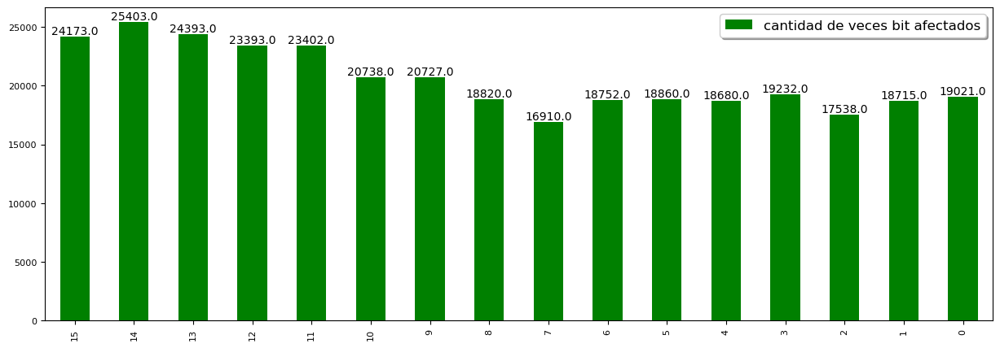

In [82]:
#fig,ax1= plt.figure(figsize=(7.5,4))
#fig = plt.subplots()
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
indice=[15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0]
n = len(count_bit)
x = np.arange(n)

graficar=pd.DataFrame(count_bit)
graficar.columns = [ 'cantidad']
graficar.set_index(pd.Index(indice))

graficar
graficar.plot(kind ='bar',width = 0.5, fontsize=8, color = 'g', figsize=(15,5), 
                            zorder=2)
for i in range(len(x)):
    plt.text(x[i], graficar['cantidad'][i], str(graficar['cantidad'][i]), ha='center', va='bottom')

plt.gca().invert_xaxis()
plt.legend(['cantidad de veces bit afectados'],fontsize=12, shadow = True)

## modelo 1

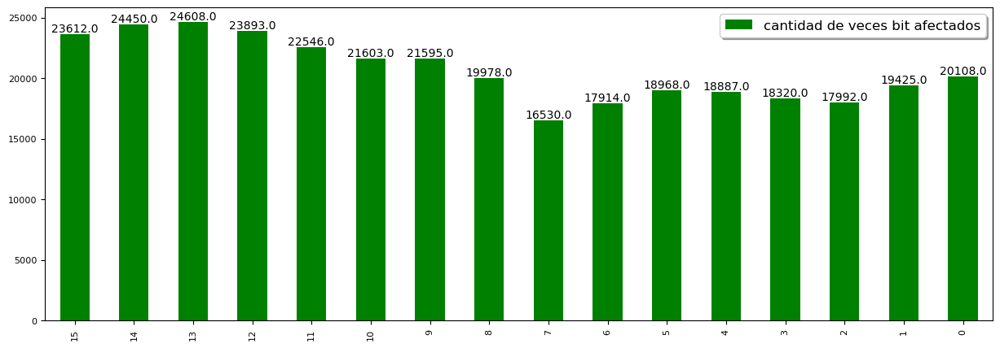

In [7]:
#fig,ax1= plt.figure(figsize=(7.5,4))
#fig = plt.subplots()
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
indice=[15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0]
n = len(count_bit)
x = np.arange(n)

graficar=pd.DataFrame(count_bit)
graficar.columns = [ 'cantidad']
graficar.set_index(pd.Index(indice))

graficar
graficar.plot(kind ='bar',width = 0.5, fontsize=8, color = 'g', figsize=(15,5), 
                            zorder=2)
for i in range(len(x)):
    plt.text(x[i], graficar['cantidad'][i], str(graficar['cantidad'][i]), ha='center', va='bottom')

plt.gca().invert_xaxis()
plt.legend(['cantidad de veces bit afectados'],fontsize=12, shadow = True)

## modelo 2

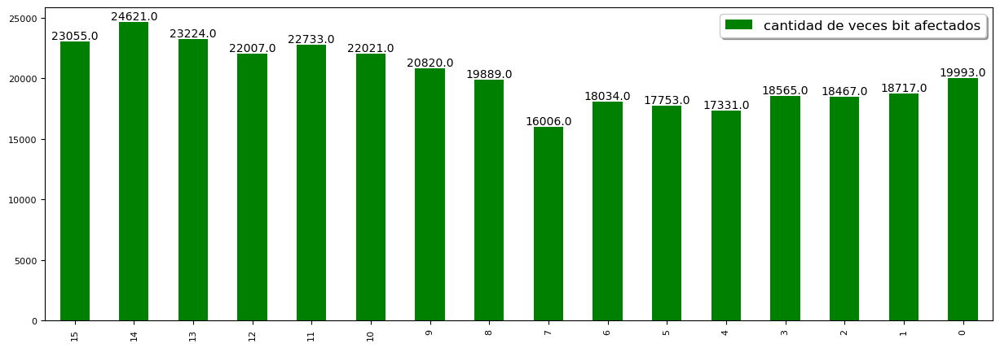

In [10]:
#fig,ax1= plt.figure(figsize=(7.5,4))
#fig = plt.subplots()
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
indice=[15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0]
n = len(count_bit)
x = np.arange(n)

graficar=pd.DataFrame(count_bit)
graficar.columns = [ 'cantidad']
graficar.set_index(pd.Index(indice))

graficar
graficar.plot(kind ='bar',width = 0.5, fontsize=8, color = 'g', figsize=(15,5), 
                            zorder=2)
for i in range(len(x)):
    plt.text(x[i], graficar['cantidad'][i], str(graficar['cantidad'][i]), ha='center', va='bottom')

plt.gca().invert_xaxis()
plt.legend(['cantidad de veces bit afectados'],fontsize=12, shadow = True)

In [12]:
error_mask = load_obj('MoRS/Modelo3_col_8_0.52/mask/comprar_con_servidor/error_mask_3')


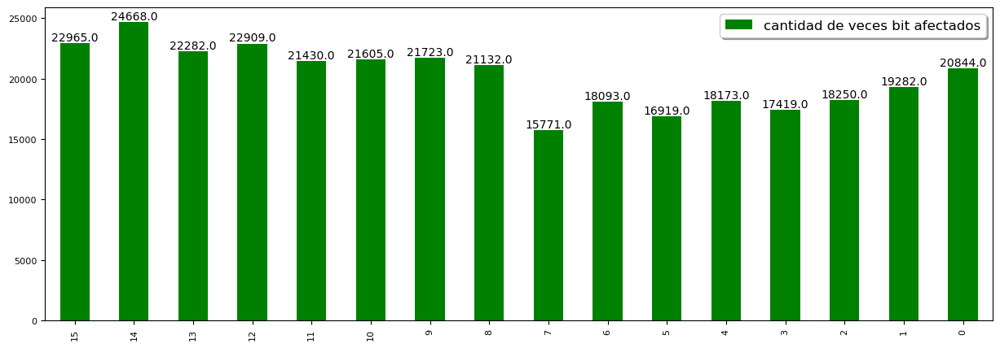

In [14]:
#fig,ax1= plt.figure(figsize=(7.5,4))
#fig = plt.subplots()
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
indice=[15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0]
n = len(count_bit)
x = np.arange(n)

graficar=pd.DataFrame(count_bit)
graficar.columns = [ 'cantidad']
graficar.set_index(pd.Index(indice))

graficar
graficar.plot(kind ='bar',width = 0.5, fontsize=8, color = 'g', figsize=(15,5), 
                            zorder=2)
for i in range(len(x)):
    plt.text(x[i], graficar['cantidad'][i], str(graficar['cantidad'][i]), ha='center', va='bottom')

plt.gca().invert_xaxis()
plt.legend(['cantidad de veces bit afectados'],fontsize=12, shadow = True)

In [15]:
error_mask = load_obj('MoRS/Modelo3_col_8_0.51/mask/error_mask_0')

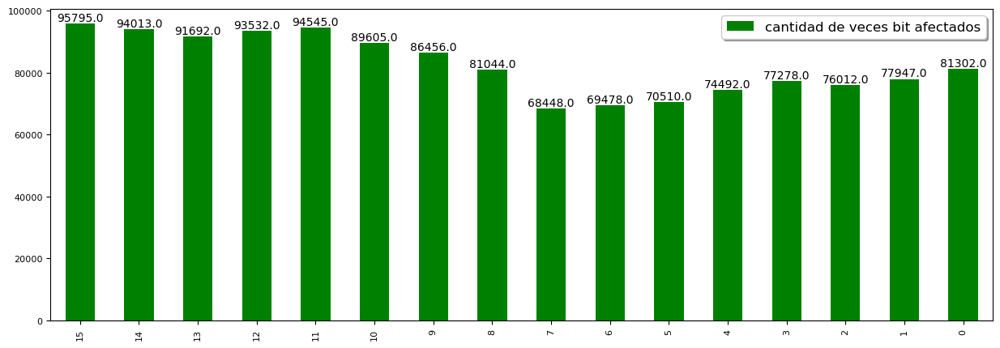

In [17]:
#fig,ax1= plt.figure(figsize=(7.5,4))
#fig = plt.subplots()
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
indice=[15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0]
n = len(count_bit)
x = np.arange(n)

graficar=pd.DataFrame(count_bit)
graficar.columns = [ 'cantidad']
graficar.set_index(pd.Index(indice))

graficar
graficar.plot(kind ='bar',width = 0.5, fontsize=8, color = 'g', figsize=(15,5), 
                            zorder=2)
for i in range(len(x)):
    plt.text(x[i], graficar['cantidad'][i], str(graficar['cantidad'][i]), ha='center', va='bottom')

plt.gca().invert_xaxis()
plt.legend(['cantidad de veces bit afectados'],fontsize=12, shadow = True)

In [73]:
graficar['cantidad']

0     19021.0
1     18715.0
2     17538.0
3     19232.0
4     18680.0
5     18860.0
6     18752.0
7     16910.0
8     18820.0
9     20727.0
10    20738.0
11    23402.0
12    23393.0
13    24393.0
14    25403.0
15    24173.0
Name: cantidad, dtype: float64

In [ ]:
#fig,ax1= plt.figure(figsize=(7.5,4))
#fig = plt.subplots()
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
indice=[15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0]
n = len(count_bit)
x = np.arange(n)

graficar=pd.DataFrame(count_bit)
graficar.columns = [ 'cantidad']
graficar.set_index(pd.Index(indice))

graficar
graficar.plot(kind ='bar',width = 0.5, fontsize=8, color = 'g', figsize=(15,5), 
                            zorder=2)
for i in range(len(x)):
    plt.text(x[i], graficar['cantidad'][i], str(graficar['cantidad'][i]), ha='center', va='bottom')

plt.gca().invert_xaxis()
plt.legend(['cantidad de veces bit afectados'],fontsize=12, shadow = True)

In [28]:
from collections import Counter
import pandas as pd
import numpy as np
count_bit_0 = 0
count_bit_1 = 0
count_bit_2 = 0
count_bit_3 = 0
count_bit_4 = 0
count_bit_5 = 0
count_bit_6 = 0
count_bit_7 = 0
count_bit_8 = 0
count_bit_9 = 0
count_bit_10= 0
count_bit_11 = 0
count_bit_12 = 0
count_bit_13 = 0
count_bit_14 = 0
count_bit_15 = 0
resumen_count_bit = []
#error_mask =['0000001000100000', '0000001000100000']
bits = ['bit_0','bit_1', 'bit_2', 'bit_3', 'bit_4','bit_5', 'bit_6','bit_7','bit_8', 'bit_9', 'bit_10', 'bit_11','bit_12', 'bit_13','bit_14', 'bit_15']
#bits = [bit_0,bit_1, bit_2, bit_3, bit_4,bit_5, bit_6,bit_7,bit_8, bit_9, bit_10, bit_11,bit_12, bit_13,bit_14, bit_15]
#marca = '@'
vol=54
print(len(error_mask))
for i, j in  enumerate(error_mask):
    
    bit_0=j[0].count('0') + j[0].count('1')
     #print(bit_1_3)
    if bit_0 > 0:
          count_bit_0+=bit_0
    
    
    bit_1=j[1].count('0') + j[1].count('1')
     #print(bit_1_3)
    if bit_1 > 0:
          count_bit_1+=bit_1
         #print('count_bit_1_3',count_bit_1_3)
    bit_2=j[2].count('0') + j[2].count('1')
    if bit_2>0:
        count_bit_2+=bit_2
    bit_3=j[3].count('0') + j[3].count('1')
    if bit_3>0:
        count_bit_3+=bit_3
    bit_4=j[4].count('0') + j[4].count('1')
    if bit_4 >0:
        count_bit_4+=bit_4
    bit_5=j[5].count('0') + j[5].count('1')
    if bit_5> 0:
        count_bit_5+=bit_5
    bit_6=j[6].count('0') + j[6].count('1')
    if bit_6>0:
        count_bit_6+=bit_6
    
    bit_7=j[7].count('0') + j[7].count('1')
     #print(bit_1_3)
    if bit_7 > 0:
          count_bit_7+=bit_7
         #print('count_bit_1_3',count_bit_1_3)
    bit_8=j[8].count('0') + j[8].count('1')
    if bit_8>0:
        count_bit_8+=bit_8
    bit_9=j[9].count('0') + j[9].count('1')
    if bit_9>0:
        count_bit_9+=bit_9
    bit_10=j[10].count('0') + j[10].count('1')
    if bit_10 >0:
        count_bit_10+=bit_10
    bit_11=j[11].count('0') + j[11].count('1')
    if bit_11> 0:
        count_bit_11+=bit_11
    bit_12=j[12].count('0') + j[12].count('1')
    if bit_12>0:
        count_bit_12+=bit_12
    bit_13=j[13].count('0') + j[13].count('1')
     #print(bit_1_3)
    if bit_13 > 0:
        count_bit_13+=bit_13
         #print('count_bit_1_3',count_bit_1_3)
    bit_14=j[14].count('0') + j[14].count('1')
    if bit_14>0:
        count_bit_14+=bit_14
    bit_15=j[15].count('0') + j[15].count('1')
    if bit_15>0:
        count_bit_15+=bit_15
print('count_bit_15',count_bit_0)   
print('count_bit_14',count_bit_1) 
print('count_bit_13',count_bit_2) 
print('count_bit_12',count_bit_3) 
print('count_bit_11',count_bit_4)   
print('count_bit_10',count_bit_5) 
print('count_bit_9',count_bit_6)
print('count_bit_8',count_bit_7)   
print('count_bit_7',count_bit_8) 
print('count_bit_6',count_bit_9) 
print('count_bit_5',count_bit_10) 
print('count_bit_4',count_bit_11)   
print('count_bit_3',count_bit_12) 
print('count_bit_2',count_bit_13)
print('count_bit_1',count_bit_14) 
print('count_bit_0',count_bit_15)

resumen_count_bit.append(count_bit_0)
resumen_count_bit.append(count_bit_1)
resumen_count_bit.append(count_bit_2)
resumen_count_bit.append(count_bit_3)  
resumen_count_bit.append(count_bit_4) 
resumen_count_bit.append(count_bit_5)                
resumen_count_bit.append(count_bit_6)
resumen_count_bit.append(count_bit_7)
resumen_count_bit.append(count_bit_8)
resumen_count_bit.append(count_bit_9)
resumen_count_bit.append(count_bit_10)  
resumen_count_bit.append(count_bit_11) 
resumen_count_bit.append(count_bit_12)                
resumen_count_bit.append(count_bit_13)
resumen_count_bit.append(count_bit_14)                
resumen_count_bit.append(count_bit_15)

print(np.sum(resumen_count_bit))
#print(count_elem)
#df_bits = pd.DataFrame(bits)
#df_count_bit_0=pd.DataFrame(resumen_count_bit)
##print(df_count_bit_0)  
##
#df_resumen_bit =  pd.concat([df_bits,df_count_bit_0], axis=1, join='outer')
#df_resumen_bit.columns = ['bits','count']
##print(df_resumen_bit)
#with pd.ExcelWriter('Analizando_fichero_detalle/Alterado_fichero/cantidad_fallos_xbits_volteada.xlsx') as writer:
#        df_resumen_bit.to_excel(writer, sheet_name='Volteada', index=False)
###                

267904
count_bit_15 19021
count_bit_14 18715
count_bit_13 17538
count_bit_12 19232
count_bit_11 18680
count_bit_10 18860
count_bit_9 18752
count_bit_8 16910
count_bit_7 18820
count_bit_6 20727
count_bit_5 20738
count_bit_4 23402
count_bit_3 23393
count_bit_2 24393
count_bit_1 25403
count_bit_0 24173
328757


# Mácara solo LO

In [34]:
inc=0
error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_' + str(inc))
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_' + str(inc))
error_mask_LO, locs,word_change = FlipPatch(error_mask, locs)

cantidad  volteada 32312
tamaño de Máscara volteada  32312
Tamaño máscara 68318
Tamaño locs 68318
total de palabras todo en xxxxxx 0
total de palabras que  se le hizo Patch 2301
total de palabras fallos HO(debe estar en 0 porque se le hizo FLIP) 0
total de palabras fallos LO(Al sumar con las del patch + las que no s ele hizo  patch = tamaño de la máscara) 66017
tamaño mask patch 68318
tamaño locs patch en este momento son las LO 66017


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
count_bit [   0.    0.    0.    0.    0.    0.    0.    0. 8007. 8687. 8386. 8946.
 9084. 8501. 9375. 9554.]
70540.0


<Figure size 750x400 with 0 Axes>

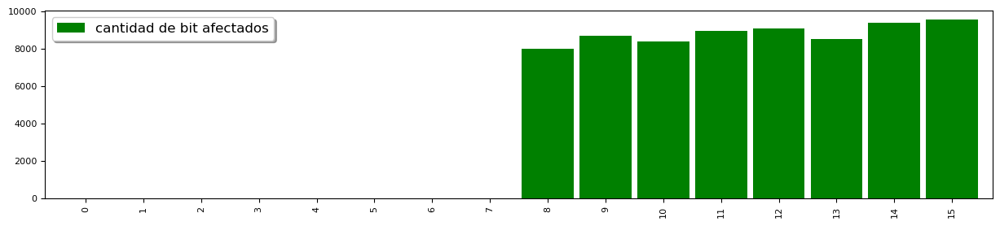

In [35]:

from matplotlib.backends.backend_pdf import PdfPages, PdfFile
from collections import Counter

#error_mask = load_obj('Data/Fault Characterization/variante_mask_vc_707/vc_707/error_mask_055')
#error_mask=['xxxx1xxxxxx011xx', 'xxxx0xxxx0xxxxxx']
repeticiones = [0] * len(error_mask_LO)
c=[]
count_bit= np.zeros(16)
print(count_bit)

for i, vector in enumerate(error_mask_LO):
    #print(vector)
       
    for j, bit in enumerate(vector):
        #print( bit)
        if bit == '1' or bit == '0':
            count_bit[j] +=1
print('count_bit', count_bit)
print(np.sum(count_bit))
           
fig= plt.figure(figsize=(7.5,4))
##plt.rcParams.update({'font.size': 10})
#plt.rcParams["figure.figsize"] = (7.5,4)
#fig, ax = plt.subplots()
n = len(count_bit)
x = np.arange(n)
graficar=pd.DataFrame(count_bit)
graficar

#
#
graficar.plot(kind ='bar',width = 0.9, fontsize=8, color = 'g', figsize=(15,3), 
                            zorder=2)
plt.legend(['cantidad de bit afectados'],fontsize=12, shadow = True)

# Shift 1

In [17]:
bin(488)

'0b111101000'

In [ ]:
####despues del shift

In [18]:
bin(976)

'0b1111010000'

In [ ]:
despues de aplicar fallos

In [ ]:
xxxx1xxxxxxx0xxx

In [20]:
bin(3024 )

'0b101111010000'

In [ ]:
reuperar el shif

In [21]:
bin(1512)

'0b10111101000'

In [ ]:
1.                   0b0000000111101000   488
despues del shift    0b0000001111010000   976
fallo                  xxxx1xxxxxxx0xxx
Despues del fallo    0b0000101111010000   3024
reuperar el shif     0b0000010111101000   1512


In [22]:
~(0b0000000000001000)

-9

In [23]:
int(0b1111111111110111)

65527

In [12]:
a=tf.bitwise.left_shift(3072,1 )
a

<tf.Tensor: shape=(), dtype=int32, numpy=6144>

In [8]:
tensor_left_shift = bitwise_ops.left_shift(0b0000110000000000, 1)
tensor_left_shift

<tf.Tensor: shape=(), dtype=int32, numpy=6144>

In [ ]:
0b0000110000000000
0b1011111111111111
0b0000110000000000

In [ ]:
tensor_left_shift = tf.bitwise.bitwise_and(3072,0b1011111111111111  )

In [61]:
bin(3072 )

'0b110000000000'

In [16]:
int(0b1011111111111111)

49151

In [18]:
bin(32768)

'0b1000000000000000'

In [72]:
bin(6144 )

'0b1100000000000'

In [ ]:
0b0000110000000000 3072
  xxxxxxxxxxx0xxxx fallo
  0000110000010000 resultado

In [63]:
int(0b0000110000010000)

3088

In [ ]:
0b0000110000010000
0b1000000000000000
0b0000110000010000

In [ ]:
0b0001100000000000 shuftleft 6144
  xxxxxxxxxxx0xxxx fallo
  0001100000010000
 

In [59]:
bin(3072 )

'0b110000000000'

In [73]:
int(0b0001100000010000)

6160

In [74]:
tensor_left_shift = bitwise_ops.right_shift(6160, 1)
tensor_left_shift

<tf.Tensor: shape=(), dtype=int32, numpy=3080>

In [ ]:
#fallo a 1

In [ ]:
0b0000110000000000 3072
  xxxxxxxxxxx1xxxx fallo 1
  0000110000010000 3088

In [77]:
int(0b001100000010000)

6160

In [ ]:
0b0001100000000000 shuftleft 6144
  xxxxxxxxxxx1xxxx fallo 1
  0001100000010000 6160
  

In [29]:
tensor_left_shift = bitwise_ops.left_shift(-1, 1)
tensor_left_shift

<tf.Tensor: shape=(), dtype=int32, numpy=-2>

In [ ]:
static_1_error  = int("".join(mask.replace('x','0')),2)
static_0_Error  = int("".join(mask.replace('x','1')),2)

In [22]:
import tensorflow as tf

tensor_original=tf.convert_to_tensor([38, 38, 32769])
static_Error0_1= ([49087,16384],[49087,64],[65471,514]) 
mod_list=tf.convert_to_tensor(static_Error0_1)

print(tensor_original)


tf.Tensor([   38    38 32769], shape=(3,), dtype=int32)


In [24]:
#affectedValues = tf.gather_nd(tensor_original, index_list)
newValues = ApplyFault(tensor_original, mod_list)

tensor original tf.Tensor([   38    38 32769], shape=(3,), dtype=int32)
tensor_left_shift tf.Tensor([   76    76 65538], shape=(3,), dtype=int32)
tensor_modi tf.Tensor([16396    76   514], shape=(3,), dtype=int32)
tensor_recuperado tf.Tensor([8198   38  257], shape=(3,), dtype=int32)


In [5]:

input_layer = tf.keras.Input(input_shape)
input_layer
fault= [[65471     0]
 [65533     0]
 [65471     0]
 [65532     0]
 [65533     0]
 [65471     0]]

<KerasTensor: shape=(None, 227, 227, 3) dtype=float32 (created by layer 'input_3')>

In [13]:
def setBitNumber(n):
    if (n == 0):
        return 0;
 
    msb = 0;
    n = int(n / 2);
 
    while (n > 0):
        n = int(n / 2);
        print(n)
        msb += 1;
 
    return (1 << msb);
 
# Driver code
n = 0;
print(setBitNumber(-100));

1


In [2]:
%cd  /Users/usuario/Desktop/CNN_Gating/MoRS


C:\Users\usuario\Desktop\CNN_Gating\MoRS


In [2]:
#estadist=pd.read_excel('Estadistic_VC_707/Tabla_resumen.xlsx',sheet_name='Hoja2' )
#estadist=pd.DataFrame(estadist)
#estadist

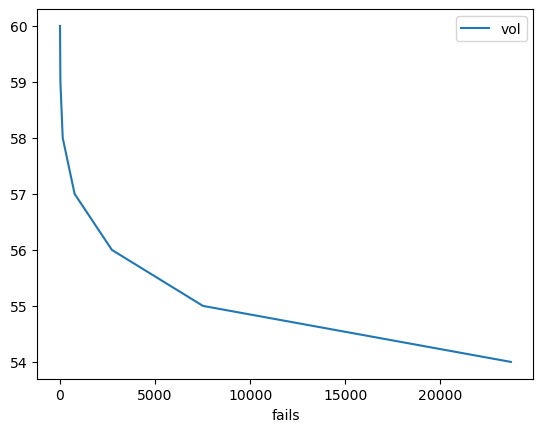

In [65]:
estadist.plot(x="fails", y="vol", kind="line")
plt.show()

In [3]:
buffer_size = 16777216
mbuffer = np.array(['x']*(buffer_size))
print(type(mbuffer))

<class 'numpy.ndarray'>


In [4]:

print(len(mbuffer))

16777216


In [69]:
cd


C:\Users\usuario


In [7]:
index=pd.read_excel('index.xlsx')
#data = pd.ExcelFile('Libro1.xlsx')
#df = data.parse('Hoja1')

In [8]:
np_array = index.values
#np_array

In [9]:
#inicio = time.time()
index=0

for i,x in enumerate(mbuffer):
    

    if i in np_array:
        #print(i)
         #a.itemset
        mbuffer[i]=random.randint(0, 1)
    


print('tipo de mbuffer',type(mbuffer))
dist = collections.Counter(mbuffer)
        #print(mbuffer[i])
            
    
#fin = time.time()
#time_run = fin - inicio 
#print(time_run)
#print(mbuffer)
print(len(mbuffer))
print((mbuffer))
print(dist)

tipo de mbuffer <class 'numpy.ndarray'>
16777216
['x' 'x' 'x' ... 'x' 'x' 'x']
Counter({'x': 16764793, '1': 6332, '0': 6091})


In [10]:
mod=np.array(['x']*8)
union=np.concatenate([mod, mbuffer])
print(len(union))

16777224


In [11]:
error_mask, locs = (buffer_vectores(union[0:buffer_size]))

soy el buffer dentro de funciones 16777216
 dentro de funciones Cantidad de elementos por tipo : Counter({'x': 16764793, '1': 6332, '0': 6091})


In [46]:
#print(locs)

In [12]:
error_mask

['xxxxxxxx11xxxxxx',
 'xxxxxxxx1xxxxxxx',
 '1xxxxxxxxxxxxxxx',
 'xxxxxxxx1xxxxxxx',
 '0xxxxxxxxxxxxxxx',
 'xxxxxxxx0xxxxxxx',
 '1xxxxxxxxxxxxxxx',
 'xxxxxxxxxxxx0xxx',
 'xxxx1xxxxxxxxxxx',
 'xxxxxxxx0xxxxxxx',
 '0xxxxxxxxxxxxxxx',
 'xxxxxxxxxxx0xxxx',
 'xxx0xxxxxxxxxxxx',
 'xxxxxxxxxxxxxx0x',
 'xxxxxx0xxxxxxxxx',
 'xxxxxxxxxxxxxx0x',
 'xx0xxxxxxxxxxxxx',
 'xxxxxxxxxxxx1xxx',
 'xxxx1xxxxxxxxxxx',
 'xxxxxxxxxxxxxxx0',
 'xxxxxxx0xxxxxxxx',
 'xxxxxxxx0xxxxxxx',
 '1xxxxxxxxxxxxxxx',
 'xxxxxxxxxxxxxx1x',
 'xxx1xxxxxxxxxxxx',
 'xxxxxxxxx0xxxxxx',
 'x1xxxxxxxxxxxxxx',
 'xxxxxxxxxxxxx0xx',
 'xxxxx0xxxxxxxxxx',
 'xxxxxxxxxxxxxxx0',
 'xxxxxxx1xxxxxxxx',
 'xxxxxxxxxxxxxxx1',
 'xxxxxxx0xxxxxxxx',
 'xxxxxxxxxxxxxxx1',
 'xxxxxxx1xxxxxxxx',
 'xxxxxxxxxxxxxxx0',
 'xxxxxxx1xxxxxxxx',
 'xxxxxxxxxxxxxxx1',
 'xxxxxxx1xxxxxxxx',
 'xxxxxxxxxxxxxxx1',
 'xxx1xxxxxxxxxxxx',
 'xxxxxxxxxxxxxxx0',
 'xxxxxxx0xxxxxxxx',
 'xxxxxxxxxxxxxxx1',
 'xxxxx1xxxxxxxxxx',
 'xxxxxxxxxxxxxxx0',
 'xxxxxxx1xxxxxxxx',
 'xxxxxxxxxxx

In [14]:
%cd  /Users/usuario/Desktop/MoRS/MoRS-master
save_obj(error_mask,'mask/error_mask')
save_obj(locs,'mask/locs')

C:\Users\usuario\Desktop\MoRS\MoRS-master


In [20]:
DF_mask = pd.DataFrame(error_mask)
DF_locs = pd.DataFrame(locs)
# #print(No_brams_total)
Mask_locs = pd.concat([DF_mask, DF_locs], axis=1, join='outer')
Mask_locs.columns = ['error_mask','locs']
Mask_locs.to_excel('Mask_locs_ok.xlsx', index=False)

In [40]:
print(len(error_mask))
print(len(locs))

11487
11487


# Cantidad de fallos 0.53 por modelos

In [8]:
inc=0
suma=0
modelo=[]
len_mask=[]
for j in range(10):
    print('modelo'+ str(inc))
    modelo.append('modelo'+ str(inc))
    error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_' + str(inc))
    locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_' + str(inc))
    tam=len(error_mask)
    len_mask.append(tam)
    suma= suma + tam
    print('suma',suma)
    print(len(error_mask))
    print(len(locs))
    inc=inc+1
prom=(suma/inc)    
print(prom)

modelo0
suma 68318
68318
68318
modelo1
suma 139838
71520
71520
modelo2
suma 212864
73026
73026
modelo3
suma 285717
72853
72853
modelo4
suma 358236
72519
72519
modelo5
suma 431088
72852
72852
modelo6
suma 504085
72997
72997
modelo7
suma 576673
72588
72588
modelo8
suma 651586
74913
74913
modelo9
suma 724089
72503
72503
72408.9


# Cantidad de fallos 0.54 por modelos

In [6]:
inc=0
suma=0
for j in range(10):
    print('modelo'+ str(inc))
    error_mask = load_obj('MoRS/Modelo3_col_8_0.54/mask/error_mask_' + str(inc))
    locs = load_obj('MoRS/Modelo3_col_8_0.54/mask/locs_' + str(inc))
    tam=len(error_mask)
    suma= suma + tam
    print('suma',suma)
    print(len(error_mask))
    print(len(locs))
    inc=inc+1
prom=(suma/inc)    
print(prom)

modelo0
suma 11963
11963
11963
modelo1
suma 23807
11844
11844
modelo2
suma 35898
12091
12091
modelo3
suma 48007
12109
12109
modelo4
suma 59880
11873
11873
modelo5
suma 71174
11294
11294
modelo6
suma 82914
11740
11740
modelo7
suma 95001
12087
12087
modelo8
suma 105869
10868
10868
modelo9
suma 118170
12301
12301
11817.0


# calcular la cantidad de errores x tipo caen por capas (LO,HO, L and H),

In [7]:
pwd

'C:\\Users\\usuario\\Desktop\\CNN_Gating'

In [19]:

error_mask=load_obj('MoRS/Modelo3_col_8_0.54/mask/error_mask_0')
locs=load_obj('MoRS/Modelo3_col_8_0.54/mask/locs_0')

In [2]:
from Simulation import buffer_simulation, save_obj, load_obj
inc= 0
error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_' + str(inc))
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_' + str(inc))

In [7]:
#print(error_mask)
#print(locs)

In [1]:
from collections import Counter
from Simulation import buffer_simulation, save_obj, load_obj
import numpy as np
import pandas as pd
#mask_LO=[]
count_bit_les = 0
coun_bit_more = 0
count_bit_conf = 0
cant_elem= []
#error_mask_L_O=[]
cant_bit_les = []
cant_bit_more = []
cant_bit_conf = []
error_mask_L_O=[]
mask_LO=[]
modelo=[]
len_mask=[]


no_mask=[]

marca = '@'
vol=0.51


inc= 5
for i in range(5):
    print('modelo'+ str(inc))
    modelo.append('modelo_'+ str(inc))
    
    
    #error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_' + str(inc))
    #locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_' + str(inc))
    
    error_mask = load_obj('MoRS/Modelo3_col_8_' + str(vol) + '/mask/error_mask_' + str(inc))
    locs = load_obj('MoRS/Modelo3_col_8_' + str(vol) + '/mask/locs_' + str(inc))
    tam=len(error_mask)
    len_mask.append(tam)
    
    print(len(error_mask))
    locs=locs
    count_bit_les = 0
    coun_bit_more = 0
    count_bit_conf = 0
    vias=[]
    error_mask_H_L_O=[]
    locs_H_L_O = []
    

    for i, j in  enumerate(error_mask):
    
   
        bit_more=j[0:8].count('0') + j[0:8].count('1')
        bit_les=j[8:16].count('0') + j[8:16].count('1')
        if bit_les>0 and bit_more==0:
        #print('LO',j)
            error_mask_L_O.append(locs[i])
            mask_LO.append(j)
            count_bit_les+=1
        
        
        
        
   
        elif bit_les == 0 and bit_more>0:
        
                coun_bit_more+=1
            
            
        else: 
        
            count_bit_conf+=1
            error_mask_H_L_O.append(j)
            #print('palabras conflictivas',j)
            locs_H_L_O.append(locs[i])
            a=locs[i]%256
            #print('a',a)
            vias.append(locs[i]%256)
        #print('tamaño vias',len(vias))

    #print('count_bit_les',count_bit_les)
    #print('coun_bit_more',coun_bit_more)
    #print('count_bit_conf',count_bit_conf)
    #print('error_mask_L_O',error_mask_L_O)
    print(len(error_mask_L_O))
    #print('vias',vias)   
    #print('tamaño del vias',len(vias))
    unique, counts = np.unique(vias, return_counts=True)
    ##print(dict(zip(unique, counts)))
    b=np.asarray(np.where(counts>5))
    #print('b',b)
    cant_elem.append(b.size) 
    #print('cant_elem',cant_elem)
    no_mask.append(i)        
    cant_bit_les.append(count_bit_les)
    print('cant_bit_les',cant_bit_les)
    cant_bit_more.append(coun_bit_more)
    print('cant_bit_more',cant_bit_more)
    cant_bit_conf.append(count_bit_conf)
    print('cant_bit_conf',cant_bit_conf)
    
    inc= inc+1
    
#

Df_error_mask_H_L_O = pd.DataFrame(error_mask_H_L_O)
Df_locs_H_L_O = pd.DataFrame(locs_H_L_O)
Df_vias = pd.DataFrame(vias)
#
#estad_H_L_O= pd.concat([Df_error_mask_H_L_O, Df_locs_H_L_O,Df_vias], axis=1, join='outer')
#print(estad_H_L_O)
#estad_H_L_O.columns = ['error_mask_H_L_O', 'locs_H_L_O', 'vias']
#estad_H_L_O.to_excel('Modelo3_mas_fallos_col_8_experimentos/estatics/Tablas_resumen_tipos_palabras/Estad_H_L_O_0_ok.xlsx', index=False)
#
df_modelo =pd.DataFrame(modelo)
df_size_marsk= pd.DataFrame(len_mask)
Df_cant_bit_les = pd.DataFrame(cant_bit_les)
#print('Df_cant_bit_les',Df_cant_bit_les)
Df_cant_bit_more = pd.DataFrame(cant_bit_more)
#print('Df_cant_bit_more',Df_cant_bit_more)
Df_cant_bit_conf = pd.DataFrame(cant_bit_conf)
#print('Df_cant_bit_conf',Df_cant_bit_conf)
Df_cant_elem = pd.DataFrame(cant_elem)
#print('Df_cant_elem',Df_cant_elem)
        
Tabla_resumen= pd.concat([df_modelo,df_size_marsk,Df_cant_bit_les, Df_cant_bit_more,Df_cant_bit_conf,Df_cant_elem], axis=1, join='outer')
Tabla_resumen.columns = ['Modelo', 'size_Mask', 'cant_bit_les', 'cant_bit_more', 'cant_bit_conf','cant_elem']
print(Tabla_resumen)
#Tabla_resumen.to_excel('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Tablas_resumen_tipos_palabras/Tabla_resumen_palabras_tipo_all_model.xlsx' )
Tabla_resumen.to_excel('MoRS/Analisis_Resultados/Palabras_x_tipo/Tabla_resumen_new_palabras_tipo_all_model_'+ str(vol)+'.xlsx' ) 

#save_obj(mask_LO,'MoRS/Modelo3_col_8_0.54/mask_/error_mask_0_LO' + str(inc))
#save_obj(error_mask_L_O,'MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_0_LO')
#


modelo5
739509
273526
cant_bit_les [273526]
cant_bit_more [235589]
cant_bit_conf [230394]
modelo6
739386
547217
cant_bit_les [273526, 273691]
cant_bit_more [235589, 234921]
cant_bit_conf [230394, 230774]
modelo7
737507
820796
cant_bit_les [273526, 273691, 273579]
cant_bit_more [235589, 234921, 235362]
cant_bit_conf [230394, 230774, 228566]
modelo8
742370
1095236
cant_bit_les [273526, 273691, 273579, 274440]
cant_bit_more [235589, 234921, 235362, 235871]
cant_bit_conf [230394, 230774, 228566, 232059]
modelo9
739715
1369243
cant_bit_les [273526, 273691, 273579, 274440, 274007]
cant_bit_more [235589, 234921, 235362, 235871, 235982]
cant_bit_conf [230394, 230774, 228566, 232059, 229726]
     Modelo  size_Mask  cant_bit_les  cant_bit_more  cant_bit_conf  cant_elem
0  modelo_5     739509        273526         235589         230394        256
1  modelo_6     739386        273691         234921         230774        256
2  modelo_7     737507        273579         235362         228566        

In [44]:
pwd

'C:\\Users\\usuario\\Desktop\\CNN_Gating'

In [22]:
mask=pd.read_excel('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Estad_H_L_O0.xlsx',usecols=["error_mask_H_L_O" ] )
locs=pd.read_excel('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Estad_H_L_O0.xlsx',usecols=["locs_H_L_O" ] )
vias=pd.read_excel('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Estad_H_L_O0.xlsx',usecols=["vias" ] )
mask_array = mask.values
locs_array = locs.values
vias_array = vias.values

In [28]:
#st = mask_array.astype(str).tolist()
#print(type(st ))
#st

In [ ]:
#guardar los locs de esta forma 
#guardar los locs que han d emodificarse los qu ecorresponden a las 5 primera 
#recorro lamascara i si el loc correspondiente concide con uno d elos qu ehay qu emodificar a esa mascarale aplico el patch 

In [70]:
import collections
import pickle
import openpyxl


wb = openpyxl.load_workbook('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Estad_H_L_O0.xlsx')
ws = wb.get_sheet_by_name('Hoja2')

#Lista = collections.defaultdict(list)
Lista =[]
for row in ws.iter_rows():
    #print(row[0].value)
    Lista.append(row[0].value)
    #Lista[row[0].value].append(row[0].value)

# Ahora serializamos el objeto Lista.
# El archivo lo vamos a llamar `Lista.dat`:
print(Lista)
print(len(Lista))
print(type(Lista))
save_obj(Lista,'MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/locs_HLO_0')
#save_obj(locs,'Data/test/Low_order//locs_0'+str(vol)
#with open("Lista.dat", "wb") as f:
    #pickle.dump(Lista, f)

[52992, 54784, 86272, 104704, 204544, 265984, 273920, 434432, 488192, 753920, 816384, 969216, 86273, 130817, 434433, 519681, 544257, 591361, 642817, 841473, 130818, 175362, 189954, 325378, 402434, 433154, 434434, 544258, 642818, 816130, 864514, 66563, 109315, 154115, 175363, 344835, 402435, 839171, 864515, 1033731, 54788, 63236, 86532, 204036, 216068, 413956, 529412, 642052, 739076, 878852, 1014532, 1285, 61957, 120837, 636933, 739077, 878853, 924933, 1003781, 13062, 24582, 107270, 309510, 343558, 344326, 344838, 418822, 636934, 778758, 780038, 840966, 960774, 68103, 778759, 811015, 841479, 909319, 130568, 204040, 324616, 386056, 436744, 540680, 661768, 66825, 260361, 279817, 337161, 386057, 541449, 840969, 874505, 974601, 997129, 81162, 117770, 213002, 269834, 787466, 840970, 978698, 310027, 319755, 368139, 478475, 491019, 540683, 556299, 678155, 678411, 767499, 799243, 806155, 186892, 194572, 280076, 393996, 518924, 540684, 741644, 770828, 799500, 865548, 937228, 126221, 135437, 2037

C:\Users\usuario\AppData\Local\Temp\ipykernel_12228\2668470251.py:7: DeprecationWarning: Call to deprecated function get_sheet_by_name (Use wb[sheetname]).
  ws = wb.get_sheet_by_name('Hoja2')


In [272]:
#vias

In [ ]:
[array([106496], dtype=int64), array([188416], dtype=int64), array([302592], dtype=int64), array([385792], dtype=int64), array([580096], dtype=int64), array([99329], dtype=int64), array([104961], dtype=int64), array([124161], dtype=int64), array([137473], dtype=int64), array([291329], dtype=int64)]

In [23]:
new_mask=[]
for i in range(256):
    count=0
    for j,k in enumerate(mask_array):
        if vias_array[j]==i:
            if count==5:
                new_mask.append(k)
                count=count+1
            else :
                
                
                

SyntaxError: unexpected EOF while parsing (1566026825.py, line 12)

# aplicar el patch directamente 

In [61]:
mask_array = mask.values[0:20]
locs_array = locs.values[0:20]
vias_array = vias.values[0:20]

In [167]:
mask_array=load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/error_mask_HLO_0')
locs=load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/locs_HLO_0')

In [86]:
print(len(mask_array))

2301


In [160]:
vias=pd.read_excel('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/Estad_H_L_O0.xlsx',usecols=["vias" ] )
vias_array = vias.values

In [172]:
mask_array=mask_array[0:20]

In [168]:

print(locs[0:20])

[52992, 54784, 86272, 104704, 204544, 265984, 273920, 434432, 488192, 753920, 816384, 969216, 86273, 130817, 434433, 519681, 544257, 591361, 642817, 841473]


In [ ]:
52992, 54784, 86272, 104704, 204544, 86273, 130817, 434433, 519681, 544257]

In [3]:
#print(vias_array[0:20])

In [11]:
error_mask_better = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_f_p_better')
len(error_mask_better)

68318

### Guardo las direcciónes de los elementos que semodificaran con el Patch

In [173]:
new_mask=[]
locs_modif=[]
locs_ok=[]
mask_ok = []
marca= '*'
for i in range(256):
    print('inicio ciclo')
    count=0
    for j,k in enumerate(mask_array):
        print('j............',j)
        #print('vias_array[j]',vias_array[j])
        #print('K....................',k)
        if vias_array[j]==i:
            if count<5:
                
                print('count',count)
                #k = str("".join(k[0:8].replace('0', 'x'))) + str(k[8:16])
                #k = str("".join(k[0:8].replace('1', 'x'))) + str(k[8:16])
                #print('mask_array[j]',mask_array[j])
                #print('k_modificada',k)
                #new_mask.append(k)
                locs_modif.append(locs[j])
                #mask_array[j].append(k)
                #new_mask=str(k) + marca
                #mask_ok.append(new_mask)
                #new_locs=(str(locs_array[j]) + marca)
                #locs_ok.append(new_locs)
                
                count=count+1
                print('count_sumador',count)
            else :
                print('j..................................',j)
                #print('dentro del primer else')
                #print('vias_array[j]',vias_array[j-1])
                #print('vias_array[j]',vias_array[j])
                if vias_array[j-1]==vias_array[j]:
                    print('es igual y guardo aquí')
                    #mask_array[j].append(k)
                    #new_mask=str(k) + marca
                    #mask_ok.append(new_mask)
                    #new_locs=(str(locs_array[j]) + marca)
                    #locs_ok.append(new_locs)
                    locs_ok.append(locs[j])
                    
                else:
                    print('es distinto y guardo aquí:::::::::::::::::::::::::::')
                    
                
print('locs_modif',len(locs_modif)    )  
print('locs_ok',len(locs_ok)  )
print('locs_modif',(locs_modif)  )
#df_error_mask=pd.DataFrame(mask_ok)
#df_locs = pd.DataFrame(locs_ok) 
#buf_fails = pd.concat([df_error_mask,df_locs], axis=1, join='outer')
#buf_fails.columns = ['error_mask','locs']
#print(buf_fails)
#buf_fails.to_excel('MoRS/Analisis_Resultados/scrach.xlsx', sheet_name='fichero_707', index=False)

inicio ciclo
j............ 0
count 0
count_sumador 1
j............ 1
count 1
count_sumador 2
j............ 2
count 2
count_sumador 3
j............ 3
count 3
count_sumador 4
j............ 4
count 4
count_sumador 5
j............ 5
j.................................. 5
es igual y guardo aquí
j............ 6
j.................................. 6
es igual y guardo aquí
j............ 7
j.................................. 7
es igual y guardo aquí
j............ 8
j.................................. 8
es igual y guardo aquí
j............ 9
j.................................. 9
es igual y guardo aquí
j............ 10
j.................................. 10
es igual y guardo aquí
j............ 11
j.................................. 11
es igual y guardo aquí
j............ 12
j............ 13
j............ 14
j............ 15
j............ 16
j............ 17
j............ 18
j............ 19
inicio ciclo
j............ 0
j............ 1
j............ 2
j............ 3
j............ 4
j............ 5

In [91]:
save_obj(locs_modif,'MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/locs_a_modif')

In [126]:
locs_a_modif=load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/estatics/locs_a_modif')
#for que recorre  los locs a modificar 

In [4]:
#locs_a_modif

In [178]:
error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_0')
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_0')
error_mask=error_mask[0:44]
locs=locs[0:44]

In [179]:
type(error_mask)

list

In [180]:
def StaticIndexVbw(error_mask,locs):
    count_bit_les = 0
    coun_bit_more = 0
    count_bit_conf =0
    error_mask_H_L_O =[]
    locs_H_L_O =[]
    vias =[]
    cant_elem=[]
    for i, j in enumerate(error_mask):
        bit_more = j[0:8].count('0') + j[0:8].count('1')
        bit_les = j[8:16].count('0') + j[8:16].count('1')
        if bit_les > 0 and bit_more == 0:
            count_bit_les += 1

        elif bit_les == 0 and bit_more > 0:
            coun_bit_more += 1

        else:
            #print('vbw dendro de index', j)
            count_bit_conf += 1
            error_mask_H_L_O.append(j)
            locs_H_L_O.append(locs[i])
            vias.append(locs[i] % 256)

    unique, counts = np.unique(vias, return_counts=True)
    # print(dict(zip(unique, counts)))
    b = np.asarray(np.where(counts > 5))
    cant_elem.append(b.size)
# puedo retornar o guardar estadísticas aquí si lo considero necesario
#o proseguir para optener los indices de los elementos que serán cambiado
#al hacer pacth
    #return error_mask_H_L_O, locs_H_L_O, vias
    new_mask = []
    locs_modif = []
    locs_ok = []
    mask_ok = []
    marca = '*'
    for i in range(256):
        count = 0
        for j, k in enumerate(error_mask_H_L_O):
            #print('vbw', k)
            if vias[j] == i:
                if count < 5:
                    locs_modif.append(locs_H_L_O[j])
                    # mask_array[j].append(k)
                    # new_mask=str(k) + marca
                    # mask_ok.append(new_mask)
                    # locs_ok.append(new_locs)
                    count = count + 1
                    #print('count_sumador', count)
                else:
                    if vias[j - 1] == vias[j]:
                        print('es igual y guardo aquí')
                        locs_ok.append(locs[j])
    #print('locs_modif', locs_modif)
    return locs_modif

In [181]:
def Flip(error_mask, locs):
    error_mask_flip = []
    locs_flip = []
    count_flip = 0
    locs_sin_flip = []
    error_mask_flip_ = []
    count_vbw=0
    # k = 0
    # marca ='*'
    for i, j in enumerate(error_mask):
        k = 0
        stop = False
        while k < 8 and stop == False:
            if ('0' in j[k] or '1' in j[k]) and 'x' in j[15 - k]:
                error_volteado = (j[::-1])
                # print('error_volteado',error_volteado)
                error_mask_flip.append(error_volteado)
                count_flip = count_flip + 1
                flip_locs = locs[i]
                locs_flip.append(flip_locs)
                stop = True

            else:
                if '0' in j[15 - k] or '1' in j[15 - k]:
                    error_mask_flip.append(j)
                    locs_sin_flip.append(locs[i])

                    stop = True
                k += 1

        if stop == False:
            error_mask_flip.append(j)
            locs_sin_flip.append(locs[i])
            #error_mask_flip_.append(j)


    print('cantidad  volteada', count_flip)
    print('tamaño de Máscara volteada ', len(locs_flip))
    print('Tamaño máscara', len(error_mask_flip))
    print('Tamaño locs', len(locs))
    return error_mask_flip, locs, count_flip


In [182]:
def WordType(error_mask):
    count_bit_les = 0
    coun_bit_more = 0
    count_bit_conf1 = 0
    error_mask_ana = []
    error_mask_ana_inv = []
    error_mask_ana_antes = []
    locs_ana = []
    locs_ana_ = []
    locs_bin = []
    for i, j in enumerate(error_mask):
        # print(i)
        bit_more = j[0:8].count('0') + j[0:8].count('1')
        bit_les = j[8:16].count('0') + j[8:16].count('1')
        if bit_les > 0 and bit_more == 0:
            count_bit_les += 1
            error_mask_ana.append(j)
            #locs_ana.append(locs[i])



        elif bit_les == 0 and bit_more > 0:
            coun_bit_more += 1
            error_mask_ana.append(j)
            #locs_ana.append(locs[i])
        elif bit_les == 0 and bit_more == 0:
        
            error_mask_ana.append(j)

        else:

            count_bit_conf1 += 1
            print('la palabra conflictiva es ',i, j)
            error_mask_ana.append(j)
            #locs_ana_.append(locs[i])
            #locs_bin.append(format((locs[i]), "b"))
    print('count_bit_les', count_bit_les)
    print('coun_bit_more', coun_bit_more)
    print('count_bit_conf', count_bit_conf1)
    print('Tamaño mascara final', len(error_mask_ana))


In [183]:
locs_modif=StaticIndexVbw(error_mask,locs)
len(locs_modif)

1

In [184]:
mask_flip,locs, count_flip= Flip(error_mask,locs)

cantidad  volteada 20
tamaño de Máscara volteada  20
Tamaño máscara 44
Tamaño locs 44


In [185]:
#mask_flip

In [186]:
WordType(mask_flip)

la palabra conflictiva es  43 xxxx1xxxxxx0xxxx
count_bit_les 43
coun_bit_more 0
count_bit_conf 1
Tamaño mascara final 44


In [171]:
mask_flip[43]

'xxxx1xxxxxx0xxxx'

In [172]:
#mask_flip

In [187]:
error_mask_patch=[]
verif=[]
count_bit_conf = 0
count_bit_else=0
for index, item in enumerate(mask_flip):
    print('index inicial',index)

    if locs[index] in locs_modif:
        #print('index locs', index)
        item_new = str("".join(item[0:16].replace('0', 'x')))
        item_new = str("".join(item_new[0:16].replace('1', 'x')))
        #print('item_new', item_new)
        print('error_mask antes', mask_flip[index] )
        mask_flip[index] = item_new
        print(' mask_flip[index]',  mask_flip[index])
        #print('error_mask despues', mask_flip[index])
        error_mask_patch.append(item_new)
        print('error_mask_patch',error_mask_patch)
        verif.append(index)
        count_bit_conf += 1
        print('count_bit_patch',count_bit_conf)
    
    else:
        #print('index else', index)
        mask_flip[index] = item
        #print(' mask_flip[index]',  mask_flip[index])
        error_mask_patch.append(item)
        count_bit_else += 1
        #print('error_mask_patch else',error_mask_patch)
print('count_bit_patch',count_bit_conf)
print('count_bit_patch',count_bit_else)
print(mask_flip)
#error_mask = save_obj(error_mask_patch,'MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_f_p_better')

index inicial 0
index inicial 1
index inicial 2
index inicial 3
index inicial 4
index inicial 5
index inicial 6
index inicial 7
index inicial 8
index inicial 9
index inicial 10
index inicial 11
index inicial 12
index inicial 13
index inicial 14
index inicial 15
index inicial 16
index inicial 17
index inicial 18
index inicial 19
index inicial 20
index inicial 21
index inicial 22
index inicial 23
index inicial 24
index inicial 25
index inicial 26
index inicial 27
index inicial 28
index inicial 29
index inicial 30
index inicial 31
index inicial 32
index inicial 33
index inicial 34
index inicial 35
index inicial 36
index inicial 37
index inicial 38
index inicial 39
index inicial 40
index inicial 41
index inicial 42
index inicial 43
index locs 43
error_mask antes xxxx1xxxxxx0xxxx
 mask_flip[index] xxxxxxxxxxxxxxxx
error_mask_patch ['xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx0x', 'xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx1x', 'xxxxxxxxx1xxxxxx', 'xxxxxxxxxxxxxx0x', 'xxxxxxxxxx0xxxxx', 'xxxxxxxxxxxxx1xx', '

In [188]:
WordType(mask_flip)

count_bit_les 43
coun_bit_more 0
count_bit_conf 0
Tamaño mascara final 44


In [177]:
type(mask_flip)

list

In [135]:
error_mask_patch[43]

'xxxxxxxxxxxxxxxx'

In [74]:
verif

[43]

In [ ]:
### luego recorro toda la mascara y voy analizando si el locs correcpondiente  alas máscaras esta dentro de los locs a modif
##car y si es así aplico Patch a esa palabra y el resto la dejo igual
# nota esto ha de aplicarse luego de hacer el Flip a la máscara.

In [157]:
error_mask_patch=[]
verif=[]
for index, item in enumerate(error_mask):
    #print('index',index)
    
    if locs[index] in locs_a_modif:
        print('index',index)
        print('entro a modificar')
        print('locs[index]',locs[index])
        item_new = str("".join(item[0:8].replace('0', 'x'))) + str(item[8:16])
        item_new = str("".join(item_new[0:8].replace('1', 'x'))) + str(item_new[8:16])
        print('item_new',item_new)
        error_mask[index]=item_new
        error_mask_patch.append(item_new)
        verif.append(index)
    else:
        error_mask[index]=item
        error_mask_patch.append(item_new)
        
#print(len(error_mask))
#print(len(error_mask_patch))


index 43
entro a modificar
locs[index] 1285
item_new xxxxxxxxxxx0xxxx
index 241
entro a modificar
locs[index] 5316
item_new xxxxxxxxxxxx11xx
index 280
entro a modificar
locs[index] 5772
item_new xxxxxxxxxxxxxxx0
index 588
entro a modificar
locs[index] 10542
item_new xxxxxxxxxxxxxx0x
index 634
entro a modificar
locs[index] 11416
item_new xxxxxxxxxxxxxxx1
index 667
entro a modificar
locs[index] 12324
item_new xxxxxxxxxxx0xxx0
index 669
entro a modificar
locs[index] 12333
item_new xxxxxxxxxxxxxx1x
index 674
entro a modificar
locs[index] 12344
item_new xxxxxxxxxxx10xxx
index 710
entro a modificar
locs[index] 12453
item_new xxxxxxxxxxx1xxxx
index 713
entro a modificar
locs[index] 12458
item_new xxxxxxxxxxx0xxxx
index 758
entro a modificar
locs[index] 12650
item_new xxxxxxxxxxx0xxxx
index 782
entro a modificar
locs[index] 12704
item_new xxxxxxxxxxx1xxxx
index 791
entro a modificar
locs[index] 12748
item_new xxxxxxxxxxx0xxxx
index 805
entro a modificar
locs[index] 12814
item_new xxxxxxxxxxx1x

index 5693
entro a modificar
locs[index] 80999
item_new xxxxxxxxx1xxxxxx
index 5729
entro a modificar
locs[index] 81123
item_new xxxxxxxxxxxxx0xx
index 5732
entro a modificar
locs[index] 81126
item_new xxxxxxxx0xxxxxxx
index 5741
entro a modificar
locs[index] 81162
item_new xxxxxxxxxxxxx0xx
index 5783
entro a modificar
locs[index] 81322
item_new xxxxxxxxxxxxx1xx
index 5817
entro a modificar
locs[index] 81478
item_new xxxxxxxx1x1xxxxx
index 5889
entro a modificar
locs[index] 81842
item_new xxxxxxxx0xxxx1xx
index 5892
entro a modificar
locs[index] 81847
item_new xxxxxxxx0xxxxxxx
index 5895
entro a modificar
locs[index] 81858
item_new xxxxxxxx1xxxxxxx
index 5896
entro a modificar
locs[index] 81859
item_new xxxxxxxxxxxxx1xx
index 5905
entro a modificar
locs[index] 81892
item_new xxxxxxxxxxxxxx0x
index 5910
entro a modificar
locs[index] 81912
item_new xxxxxxxxxxxxx0xx
index 5913
entro a modificar
locs[index] 81916
item_new xxxxxxxx10xxxxxx
index 5936
entro a modificar
locs[index] 82266
item

index 10442
entro a modificar
locs[index] 139310
item_new xxxxxxxx1xxxxxxx
index 10544
entro a modificar
locs[index] 140495
item_new xxxxxxxxxxxxxxx1
index 10594
entro a modificar
locs[index] 140873
item_new xxxxxxxxxxxxxxx0
index 10601
entro a modificar
locs[index] 140942
item_new xxxxxxxxxxxxxxx1
index 10767
entro a modificar
locs[index] 144449
item_new xxxxxxxxxxxxxx1x
index 10782
entro a modificar
locs[index] 144523
item_new xxxxxxxxxx1xxxxx
index 10795
entro a modificar
locs[index] 144554
item_new xxxxxxxxxx1xxxxx
index 10816
entro a modificar
locs[index] 144632
item_new xxxxxxxxxxxxx1xx
index 10819
entro a modificar
locs[index] 144637
item_new xxxxxxxxxx1xxxxx
index 10834
entro a modificar
locs[index] 144677
item_new xxxxxxxxxxxxx01x
index 10851
entro a modificar
locs[index] 144745
item_new xxxxxxxxxxxxx1xx
index 10856
entro a modificar
locs[index] 144763
item_new xxxxxxxxxxxxx10x
index 10862
entro a modificar
locs[index] 144781
item_new xxxxxxxxxx1xxxxx
index 10863
entro a modif

index 14691
entro a modificar
locs[index] 200154
item_new xxxxxxxxxxxxxxx0
index 14738
entro a modificar
locs[index] 200499
item_new xxxxxxxxxxxxxxx1
index 14797
entro a modificar
locs[index] 203789
item_new xxxxxxxxxxx1xxxx
index 14849
entro a modificar
locs[index] 204036
item_new xxxxxxxxxxx0xxxx
index 14852
entro a modificar
locs[index] 204040
item_new xxxxxxxx11xxxxxx
index 14856
entro a modificar
locs[index] 204074
item_new xxxxxxxxxxx1x1xx
index 14864
entro a modificar
locs[index] 204120
item_new xxxxxxxxxxx1xxxx
index 14913
entro a modificar
locs[index] 204399
item_new xxxxxxxxxxx1xxxx
index 14916
entro a modificar
locs[index] 204406
item_new xxxxxxxxxxx0xxxx
index 14917
entro a modificar
locs[index] 204407
item_new xxxxxxxxxxx0xxxx
index 14943
entro a modificar
locs[index] 204544
item_new xxxxxxxxxxx1xxxx
index 14958
entro a modificar
locs[index] 204624
item_new xxxxxxxxxxx1x1xx
index 15026
entro a modificar
locs[index] 206102
item_new xxxxxxxxxxxxxx0x
index 15027
entro a modif

index 23336
entro a modificar
locs[index] 325178
item_new xxxxxxxxxxxx0xxx
index 23340
entro a modificar
locs[index] 325182
item_new xxxxxxxxxxxx1xxx
index 23351
entro a modificar
locs[index] 325218
item_new xxxxxxxxxxxx0xxx
index 23355
entro a modificar
locs[index] 325235
item_new xxxxxxxxxxxx0xxx
index 23364
entro a modificar
locs[index] 325256
item_new xxxxxxxxxxxx1xxx
index 23371
entro a modificar
locs[index] 325291
item_new xxxxxxxxxxxx0xxx
index 23386
entro a modificar
locs[index] 325327
item_new xxxxxxxxxxxx1xxx
index 23390
entro a modificar
locs[index] 325339
item_new xxxxxxxxx1xxxxxx
index 23403
entro a modificar
locs[index] 325378
item_new xxxxxxxxxxxx1xxx
index 23416
entro a modificar
locs[index] 325417
item_new xxxxxxxxx0xxxxxx
index 23454
entro a modificar
locs[index] 325567
item_new xxxxxxxxx0xxxxxx
index 23500
entro a modificar
locs[index] 325908
item_new xxxxxxxxxxxx1xxx
index 23501
entro a modificar
locs[index] 325909
item_new xxxxxxxxxxxx0xxx
index 23588
entro a modif

index 31948
entro a modificar
locs[index] 457849
item_new xxxxxxxxxxx1xxxx
index 31965
entro a modificar
locs[index] 458256
item_new xxxxxxxxxx11xxxx
index 31986
entro a modificar
locs[index] 458820
item_new xxxxxxxxx1x0xxxx
index 32051
entro a modificar
locs[index] 460252
item_new xxxxxxxxxxxxx1xx
index 32110
entro a modificar
locs[index] 460924
item_new xxxxxxxxxxxxx1xx
index 32128
entro a modificar
locs[index] 461031
item_new xxxxxxxxxxxxx10x
index 32350
entro a modificar
locs[index] 465110
item_new xxxxxxxxxxxxxxx1
index 32364
entro a modificar
locs[index] 465338
item_new xxxxxxxxxxxxxxx1
index 32508
entro a modificar
locs[index] 466637
item_new xxxxxxxxxx1xxxxx
index 32567
entro a modificar
locs[index] 466884
item_new xxxxxxxxxxxx1xxx
index 32568
entro a modificar
locs[index] 466885
item_new xxxxxxxx0x0xxxxx
index 32569
entro a modificar
locs[index] 466886
item_new xxxxxxxx0xxxxxxx
index 32658
entro a modificar
locs[index] 469464
item_new xxxxxxxxxxx1xxxx
index 32813
entro a modif

index 42266
entro a modificar
locs[index] 638460
item_new xxxxxxxxx0xxxxxx
index 42280
entro a modificar
locs[index] 638549
item_new xxxxxxxxxxxxx0xx
index 42306
entro a modificar
locs[index] 638690
item_new xxxxxxxxxxxxx01x
index 42325
entro a modificar
locs[index] 638806
item_new xxxxxxxxxxxxx0xx
index 42555
entro a modificar
locs[index] 642236
item_new xxxxxxxx0xxxxxxx
index 42583
entro a modificar
locs[index] 642327
item_new xxxxxxxx1xxxxx0x
index 42617
entro a modificar
locs[index] 642447
item_new xxxxxxxxx0xxxxxx
index 42632
entro a modificar
locs[index] 642501
item_new xxxxxxxxx1xxxxxx
index 42680
entro a modificar
locs[index] 642698
item_new xxxxxxxx1xxxxxxx
index 42686
entro a modificar
locs[index] 642704
item_new xxxxxxxxx1xxxxxx
index 42765
entro a modificar
locs[index] 642946
item_new xxxxxxxxx0xxxxxx
index 42772
entro a modificar
locs[index] 642956
item_new xxxxxxxxxx1xxxxx
index 42784
entro a modificar
locs[index] 642977
item_new xxxxxxxxx0xxxxxx
index 42791
entro a modif

index 65159
entro a modificar
locs[index] 997072
item_new xxxxxxxxxxxxxx0x


In [5]:
#verif

In [158]:
print(error_mask[241])

xxxxxxxxxxxx11xx


In [159]:
print(len(error_mask))

68318


In [118]:
#Lista = [1, 2, 3, 4,5]
#itemAReemplazar=[0,3,5]
#nuevoValor=[8]
error_mask_patch=[]

for index, item in enumerate(Lista):
    print('index',index)
    print(itemAReemplazar)
    if item in itemAReemplazar:      
        
        print('item',item)
       
        Lista[index] = nuevoValor[0]
print(Lista)

index 0
[0, 3, 5]
index 1
[0, 3, 5]
index 2
[0, 3, 5]
index 3
[0, 3, 5]
index 4
[0, 3, 5]
[1, 2, 8, 4, 8]


## Código ok donde para una variable van las 5 del patch y pata la otra el resto

In [15]:
new_mask=[]
locs_modif=[]
locs_ok=[]
mask_ok = []
marca= '*'
for i in range(256):
    print('inicio ciclo')
    count=0
    for j,k in enumerate(mask_array):
        #print('j',j)
        #print('vias_array[j]',vias_array[j])
        #print('i',i)
        if vias_array[j]==i:
            if count<5:
                print('count',count)
                new_mask=str(k) + marca
                mask_ok.append(new_mask)
                new_locs=(str(locs_array[j]) + marca)
                locs_ok.append(new_locs)
                count=count+1
                print('count_sumador',count)
            else :
                #print('dentro del primer else')
                #print('vias_array[j]',vias_array[j-1])
                #print('vias_array[j]',vias_array[j])
                if vias_array[j-1]==vias_array[j]:
                    print('es igual y guardo aquí')
                    new_mask=str(k) + marca
                    mask_ok.append(new_mask)
                    new_locs=(str(locs_array[j]) + marca)
                    locs_ok.append(new_locs)
                    locs_modif.append(locs_array[j])
                    
                else:
                    print('es distinto y guardo aquí:::::::::::::::::::::::::::')
                    
                
print('locs_modif',len(locs_modif)    )  
print('locs_ok',len(locs_ok)  )
df_error_mask=pd.DataFrame(mask_ok)
df_locs = pd.DataFrame(locs_ok) 
buf_fails = pd.concat([df_error_mask,df_locs], axis=1, join='outer')
buf_fails.columns = ['error_mask','locs']
print(buf_fails)
buf_fails.to_excel('MoRS/Analisis_Resultados/scrach.xlsx', sheet_name='fichero_707', index=False)

inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio c

inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y gu

count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aqu

inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_

count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
count_sumador 5
es igual y guardo aquí
inicio ciclo
count 0
count_sumador 1
count 1
count_sumador 2
count 2
count_sumador 3
count 3
count_sumador 4
count 4
c

In [9]:
print(len(locs_ok))

50


## graficar cuantos fallos hay  en la s lo luego d ehacer flip +patch

In [7]:
pwd

'C:\\Users\\usuario\\Desktop\\CNN_Gating'

In [2]:
from funciones import buffer_vectores,Base,IsoAECC,ECC, Flip,FlipPatch,FlipPatchBetter
error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_0')
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_0')

#error_mask_new, locs,word_change = Funcion[i](error_mask, locs)
#error_mask, locs,word_change = FlipPatch(error_mask, locs)

In [5]:
from collections import Counter
import pandas as pd
count_bit_0 = 0
count_bit_1_3 = 0
count_bit_1_4 = 0
count_bit_4_7 = 0
count_bit_1_6 = 0
count_bit_5_15= 0
count_bit_7_15 =0

count_bit_8_15 = 0
resumen_count_bit = []
#error_mask =['0000001000100000', '0000001000100000']
bits = ['bit_0','bit_1_3', 'bit_4_15', 'bit_1_4', 'bit_5_15','bit_1_6', 'bit_7_15']
#marca = '@'
vol=54
print(len(error_mask))
for i, j in  enumerate(error_mask):
    #print(j)
    bit_0=j[0].count('0') + j[0].count('1')
    if bit_0>0:
        count_bit_0+=bit_0
    bit_1_3=j[1:4].count('0') + j[1:4].count('1')
    #print(bit_1_3)
    if bit_1_3 > 0:
        count_bit_1_3+=bit_1_3
        print('jpalabras con fallos del 1-3',j)
        #print('count_bit_1_3',count_bit_1_3)
    bit_4_7=j[4:8].count('0') + j[4:8].count('1')
    if bit_4_7>0:
        count_bit_4_7+=bit_4_7
    bit_8_15=j[8:16].count('0') + j[8:16].count('1')
    if bit_8_15>0:
        count_bit_8_15+=bit_8_15
    bit_5_15=j[5:16].count('0') + j[5:16].count('1')
    if bit_5_15 >0:
        count_bit_5_15+=bit_5_15
    bit_1_6=j[1:7].count('0') + j[1:7].count('1')
    if bit_1_6> 0:
        count_bit_1_6+=bit_1_6
    bit_7_15=j[7:16].count('0') + j[7:16].count('1')
    if bit_7_15>0:
        count_bit_7_15+=bit_7_15
print('count_bit_0',count_bit_0)   
print('count_bit_1_3',count_bit_1_3) 
print('count_bit_4_7',count_bit_4_7) 
print('count_bit_8_15',count_bit_8_15) 
#print('count_bit_5_15',count_bit_5_15)   
#print('count_bit_1_6',count_bit_1_6) 
#print('count_bit_7_15',count_bit_7_15)
#
resumen_count_bit.append(count_bit_0)
resumen_count_bit.append(count_bit_1_3)
resumen_count_bit.append(count_bit_4_7)
resumen_count_bit.append(count_bit_1_4)  
resumen_count_bit.append(count_bit_8_15) 
#resumen_count_bit.append(count_bit_1_6)                
#resumen_count_bit.append(count_bit_7_15)
#
    
#print(count_elem)
#df_bits = pd.DataFrame(bits)
#df_count_bit_0=pd.DataFrame(resumen_count_bit)
#print(df_count_bit_0)  
#
#df_resumen_bit =  pd.concat([df_bits,df_count_bit_0], axis=1, join='outer')
#df_resumen_bit.columns = ['bits','count']
##print(buf_conflic)
##with pd.ExcelWriter('Analizando_fichero_detalle/Alterado_fichero/cantidad_fallos_bits_redes_volteada.xlsx') as writer:
         # df_resumen_bit.to_excel(writer, sheet_name='fallos_bits', index=False)
#                           
        

68318
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xx1xxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0x0xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xx1xxxxxxxxxxxxx
jpalabras con fallos del 1-3 xx0xxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 xx1xxxxxxxxxxxxx
jpalabras con fallos del 1-3

jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xx1xxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxx1xxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxx

jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 11xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxx1xxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxx0xxxxxx
jpalabras con fallos del 1-3 x0xxx

jpalabras con fallos del 1-3 xx0xxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 xx1xxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx0xxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xxx1xxxxxxxxxxxx
jpalabras con fallos del 1-3 xx0xxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xx0xxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x0xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 x1xxxxxxxxxxxxxx
jpalabras con fallos del 1-3 xx1xx

In [ ]:
## Permite saber la cantidad de palabras x cantidad de fallos 
# Se le pasa una mácara , previo a ello se se le ha de hacer un llamado a la función 
#según la técnica que se desee aplicar

cantidad de 1 61592
68318
68318
Counter({1: 61592, 2: 6321, 3: 396, 4: 9})
[1, 2, 3, 4]
[61592, 6321, 396, 9]
 operación completada:  17:09:45


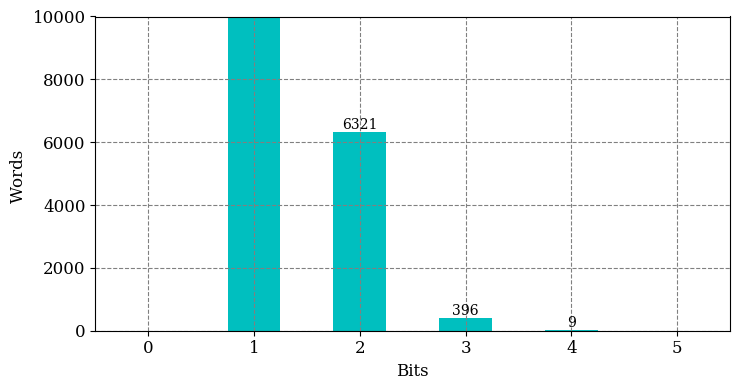

In [6]:
from Stats import CheckAccuracyAndLoss
from Simulation import save_obj, load_obj
from FileAnalize import analize_file, analize_file_uno,analize_file_uno_ceros, save_file, load_file
from funciones import buffer_vectores
import collections
from collections import Counter
from datetime import datetime
import itertools
from Training import GetDatasets
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import pandas as pd
import os, sys
from matplotlib.backends.backend_pdf import PdfPages, PdfFile


#error_mask = load_obj('Data/Fault Characterization/variante_mask_vc_707/vc_707/error_mask_055')
#error_mask=['xxxx1xxxxxx011xx', 'xxxx0xxxx0xxxxxx']
repeticiones = [0] * len(error_mask)
c=[]

for vector in error_mask:
    h=collections.Counter(vector)
    #print(h) 
    c.append(h['1'] + h['0']) 
    a=c.count(1)
    

print('cantidad de 1', a)    
#print(c)
#print('d',d)
print(len(c))

print(len(error_mask))
# los elementos que mas se repiten 
#print(h.most_common(1))
#save_obj(c,'Analizando_fichero_detalle/errores _x_tipo/VC_707_0_59')  
#save_obj(c,'Analizando_fichero_detalle/errores _x_tipoprueba') 

bit=[]
frec=[]
a=Counter(c)
print(a)
for i in a:
    bit.append(i)
    frec.append(a[i])


print(bit)
print(frec)

#fig= plt.figure(figsize=(7.5,4))
#plt.rcParams.update({'font.size': 10})
plt.rcParams["figure.figsize"] = (7.5,4)
fig, ax = plt.subplots()


ax.set_xlim(-0.5,5.5)
ax.set_ylim(0,10000)


a= ax.bar(x=bit, height = frec,color='c', width = 0.50)

#ax.set_title('Number of errors by words')
ax.set_xlabel('Bits', fontsize=12, fontfamily="serif")
ax.set_ylabel('Words ', fontsize=12, fontfamily="serif")
plt.grid(color = 'gray', linestyle = 'dashed')
ax.bar_label(ax.containers[0],fontsize= 10, fontfamily="serif" )
plt.xticks( fontsize= 12, fontfamily="serif" )
plt.yticks( fontsize= 12, fontfamily="serif" )
#plt.savefig('word_with_more_one_bit_error.pdf', transparent = True, bbox_inches = 'tight', pad_inches = 0)
#pdfFile=PdfPages('Analizando_fichero_detalle/amount_error_word/Number_errors_words_0.60.pdf')
#pdfFile=PdfPages('Analizando_fichero_detalle/amount_error_word/705_Number_errors_words_0.58.pdf')
#pdfFile.savefig(fig, transparent = True, bbox_inches = 'tight', pad_inches = 0)
#pdfFile.close()


plt.tight_layout()
              
print(str()+' operación completada: ', datetime.now().strftime("%H:%M:%S"))        
   

# Nuevas Ténicas para los modelos de MoRS

##  Hacer un shif a la máscara despues de flip_patch ccolocando x alante 

In [4]:
from funciones import buffer_vectores,Base,IsoAECC,ECC, Flip,FlipPatch,FlipPatchBetter,ShiftMask
error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_0')
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_0')

#error_mask_new, locs,word_change = Funcion[i](error_mask, locs)
error_mask, locs,word_change = FlipPatch(error_mask, locs)

cantidad  volteada 32312
tamaño de Máscara volteada  32312
Tamaño máscara 68318
Tamaño locs 68318
total de palabras todo en xxxxxx 0
total de palabras que no se le hizo Patch 2301
total de palabras fallos HO(debe estar en 0 porque se le hizo FLIP) 0
total de palabras fallos LO(Al sumar con las del patch + las que no s ele hizo  patch = tamaño de la máscara) 66017


In [6]:
error_mask =error_mask[0:20]

In [63]:
shift = 1

for i, j in  enumerate(error_mask):
    print(j)
    lista = list(j)
    lista.pop()
    a='x'+''.join(lista)
    print(a)
     
    
    

xxxxxxxxx0xxxxxx
xxxxxxxxxx0xxxxx
xxxxxxxxxxxxxx0x
xxxxxxxxxxxxxxx0
xxxxxxxxx0xxxxxx
xxxxxxxxxx0xxxxx
xxxxxxxxxxxxxx1x
xxxxxxxxxxxxxxx1
xxxxxxxxx1xxxxxx
xxxxxxxxxx1xxxxx
xxxxxxxxxxxxxx0x
xxxxxxxxxxxxxxx0
xxxxxxxxxx0xxxxx
xxxxxxxxxxx0xxxx
xxxxxxxxxxxxx1xx
xxxxxxxxxxxxxx1x
xxxxxxxxxxxxxx0x
xxxxxxxxxxxxxxx0
xxxxxxxxx1xxxxxx
xxxxxxxxxx1xxxxx


In [100]:
pwd

'C:\\Users\\usuario\\Desktop\\CNN_Gating'

In [14]:
from Simulation import buffer_simulation, save_obj, load_obj
from funciones import ShiftMask
ShiftMask(error_mask,1)

j xxxxxxxxx0xxxxxx
a xxxxxxxxxx0xxxxx
16
j xxxxxxxxxxxxxx0x
a xxxxxxxxxxxxxxx0
16
j xxxxxxxxx0xxxxxx
a xxxxxxxxxx0xxxxx
16
j xxxxxxxxxxxxxx1x
a xxxxxxxxxxxxxxx1
16
j xxxxxxxxx1xxxxxx
a xxxxxxxxxx1xxxxx
16
['xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx0x', 'xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx1x', 'xxxxxxxxx1xxxxxx']
['xxxxxxxxxx0xxxxx', 'xxxxxxxxxxxxxxx0', 'xxxxxxxxxx0xxxxx', 'xxxxxxxxxxxxxxx1', 'xxxxxxxxxx1xxxxx']


['xxxxxxxxxx0xxxxx',
 'xxxxxxxxxxxxxxx0',
 'xxxxxxxxxx0xxxxx',
 'xxxxxxxxxxxxxxx1',
 'xxxxxxxxxx1xxxxx']

## SHIFT Final versión 2

In [2]:
error_mask =['xxxxxxxxxxxxxx0x','xxxxxxxxxxxxx10x','xxxxxxxxxxxxxxx1','xxxxxxxxxx1xxxx']

In [8]:
shift = 0
mask_new = []
count_bit_remove =0


#xxxxxxxxxxxxxx0x
for i, j in  enumerate(error_mask):
    posicion = 3
    print('j',j)
    lista = list(j)
    ### en las direcciones qu ehay fallos estos deben mantenerse por tanto si al hacer shift
    ## esto implica qu eno haya error en est aposición no se hace shift para qu eprevaleza el fallo en esta dirección
    test=lista[16-posicion:16].count('0') + lista[16-posicion:16].count('1')
    print('test',test)
    if test>0:
        a=''.join(lista)
        mask_new.append(a)
    else:
        
        while posicion>0:
            
            lista.pop()
            #disminuyo las posiciones
            posicion=posicion-1
            shift += 1 ##incremento contador para agregar los elementos que he quitado como x delante
          
        a='x'* shift +''.join(lista)
        bit_remove=a[0:16].count('0') + a[0:16].count('1')
        mask_new.append(a)
        shift=0 
        if bit_remove==0:
            count_bit_remove +=1
            
        
    print('a',a)
    print(len(a))
print(error_mask)
print(mask_new) 
print(count_bit_remove)
print('La cantidad de palabras' )

j xxxxxxxxx0xxxxxx
test 0
a xxxxxxxxxxxx0xxx
16
j xxxxxxxxxxxxxx0x
test 1
a xxxxxxxxxxxxxx0x
16
j xxxxxxxxx0xxxxxx
test 0
a xxxxxxxxxxxx0xxx
16
j xxxxxxxxxxxxxx1x
test 1
a xxxxxxxxxxxxxx1x
16
j xxxxxxxxx1xxxxxx
test 0
a xxxxxxxxxxxx1xxx
16
['xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx0x', 'xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx1x', 'xxxxxxxxx1xxxxxx']
['xxxxxxxxxxxx0xxx', 'xxxxxxxxxxxxxx0x', 'xxxxxxxxxxxx0xxx', 'xxxxxxxxxxxxxx1x', 'xxxxxxxxxxxx1xxx']
0
La cantidad de palabras


# Shift version 1

In [20]:
shift = 0
mask_new = []
count_bit_remove =0



for i, j in  enumerate(error_mask):
    posicion = 2
    print('j',j)
    lista = list(j)
    ### en las direcciones qu ehay fallos estos deben mantenerse por tanto si al hacer shift
    ## esto implica qu eno haya error en est aposición no se hace shift para qu eprevaleza el fallo en esta dirección
    
    while posicion>0:
        #if lista[0:16].count('0') + lista[0:16].count('1')
        lista.pop()
#disminuyo las posiciones
        posicion=posicion-1
        shift += 1 ##incremento contador para agregar los elementos que he quitado como x delante
      
    a='x'* shift +''.join(lista)
    bit_remove=a[0:16].count('0') + a[0:16].count('1')
    mask_new.append(a)
    shift=0 
    if bit_remove==0:
        count_bit_remove +=1
        
        
    print('a',a)
    print(len(a))
print(error_mask)
print(mask_new) 
print(count_bit_remove)
print('La cantidad de palabras con  fallos que permanecen',len(mask_new)- count_bit_remove)


j xxxxxxxxx0xxxxxx
a xxxxxxxxxxx0xxxx
16
j xxxxxxxxxxxxxx0x
a xxxxxxxxxxxxxxxx
16
j xxxxxxxxx0xxxxxx
a xxxxxxxxxxx0xxxx
16
j xxxxxxxxxxxxxx1x
a xxxxxxxxxxxxxxxx
16
j xxxxxxxxx1xxxxxx
a xxxxxxxxxxx1xxxx
16
['xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx0x', 'xxxxxxxxx0xxxxxx', 'xxxxxxxxxxxxxx1x', 'xxxxxxxxx1xxxxxx']
['xxxxxxxxxxx0xxxx', 'xxxxxxxxxxxxxxxx', 'xxxxxxxxxxx0xxxx', 'xxxxxxxxxxxxxxxx', 'xxxxxxxxxxx1xxxx']
2
La cantidad de palabras con  fallos que permanecen 3


## correr las capas d elas redes y para las activaciones (ouput) analizar las activaciones ## por valores ver graficas analizar (flip_Patch antiguo)


In [2]:
import os
import pickle as pickle
import tensorflow as tf
import numpy as np
from Stats import WeightQuantization,IntroduceFaultsInWeights,GenerateFaultsList,CheckAccuracyAndLoss
from Nets_original import GetNeuralNetworkModel
from Training import GetDatasets
from Simulation import get_all_outputs
from Simulation import buffer_simulation, save_obj, load_obj
from datetime import datetime
import collections 
import pandas as pd
import random
from Simulation import save_obj, load_obj
from funciones import buffer_vectores
import collections
from datetime import datetime
import itertools
import matplotlib.pyplot as plt
import pathlib
import os, sys
from tensorflow.python.ops import bitwise_ops

In [6]:
#from Nets_test_shift import GetNeuralNetworkModel
from Nets_original import GetNeuralNetworkModel
from Simulation import buffer_simulation, save_obj, load_obj
from Training import GetDatasets
from Simulation import get_all_outputs
from funciones import buffer_vectores,Base,IsoAECC,ECC, Flip,FlipPatch,FlipPatchBetter,ShiftMask,WordType
#error_mask=load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_all_x')
#error_mask=load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_0')
#locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_0')
#error_mask_new, locs,locs_patch,word_change = FlipPatch(error_mask, locs)

error_mask = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/error_mask_0')
locs = load_obj('MoRS/Modelo3_mas_fallos_col_8_experimentos/mask/locs_0')
error_mask_new, locs,locs_patch,word_change = FlipPatch(error_mask, locs)
locs_LO, locs_HO, locs_H_L_O = WordType(error_mask_new, locs)

locs_lo = np.array(locs_LO)
print(len(locs_LO))
print(len(locs_HO))
print(len(locs_H_L_O))




#error_mask_new, locs,word_change = Funcion[i](error_mask, locs)
#error_mask_new, locs,word_change = FlipPatch(error_mask, locs)

FlipPatch
cantidad  volteada 32312
tamaño de Máscara volteada  32312
Tamaño máscara 68318
Tamaño locs 68318
total de palabras todo en xxxxxx 0
total de palabras que  se le hizo Patch 2301
total de palabras fallos HO(debe estar en 0 porque se le hizo FLIP) 0
total de palabras fallos LO(Al sumar con las del patch + las que no s ele hizo  patch = tamaño de la máscara) 66017
tamaño mask patch 68318
tamaño locs patch en este momento son toda xxxxx 2301
tamaño locs LO en este momento son las LO 66017
count_bit_les 66017
coun_bit_more 0
count_bit_conf 0
count_perfect_word 2301
LO 66017
HO 0
LHO 0
suma de perf wored y cpunt_bit_less debe ser igual qu ela máscara 68318
Tamaño mascara final 68318
66017
0
0


In [4]:
trainBatchSize = testBatchSize = 1
_, _, test_dataset = GetDatasets('colorectal_histology', (80, 5, 15), (224, 224), 8, trainBatchSize, testBatchSize)



word_size  = 16
afrac_size = 9
aint_size  = 6
wfrac_size = 15
wint_size  = 0

# Tamaño del buffer de activaciones == al tamaño de la capa con mayor numero de activaciones (290400 pesos de 16 bits cada uno)
abuffer_size = 16777216
# Directorio de los pesos
cwd = os.getcwd()
wgt_dir = os.path.join(cwd, 'Data')
wgt_dir = os.path.join(wgt_dir, 'Trained Weights')
wgt_dir = os.path.join(wgt_dir, 'SqueezeNet')
wgt_dir = os.path.join(wgt_dir, 'Colorectal Dataset')
wgt_dir = os.path.join(wgt_dir,'Weights')


# In[4]:


activation_aging = [False]*22

#faulty_addresses=locs, masked_faults=error_mask
Net2 = GetNeuralNetworkModel('SqueezeNet', (224,224,3), 8, 
                                 aging_active=activation_aging, word_size=word_size, frac_size=afrac_size, 
                                 batch_size = testBatchSize)
Net2.load_weights(wgt_dir).expect_partial()
loss = tf.keras.losses.CategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
Net2.compile(optimizer=optimizer, loss=loss, metrics='accuracy')
WeightQuantization(model=Net2, frac_bits=wfrac_size, int_bits=wint_size)
loss,acc  = Net2.evaluate(test_dataset)
#acc_list.append(acc)
#list_ciclo.append(i)




C:\Users\usuario\anaconda3\envs\env_first\lib\site-packages\tensorflow\python\data\ops\dataset_ops.py:3703: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable.debug_mode()`.
  warnings.warn(


dentro de getneuronalmodel
750/750 [==============================] - 73s 97ms/step - loss: 0.2536 - accuracy: 0.9307


# capas lambdas y para todas las imagenes, el bit 14 afectado 32-64

## Recorriendo todo el dataset y las capas 

In [9]:
#write_layer = [2,6,8,12,19,23, 30,34, 41,43,47, 54,58, 65,69, 76,80 , 87,89,93, 100,103,107]
write_layer = [2,6,8,12]
#np_count = np.full(14, 0)
#bins = [-64,-32,-16,-8,-4,-2,-1,0, 1, 2, 4, 8, 16, 32, 64]
np_count=np.full(16, 0)
#print(np_count)
bins = [-256,-128,-64,-32,-16,-8,-4,-2,0, 2, 4, 8,16,32,64,128,256]
intervalo = []
save=[]
for i, j in enumerate(write_layer):
#for i, j in enumerate(Net2.layers):
    
    print('.........................................',j)

    save_values=[]
    index = 0
    stop = False
    
    iterator = iter(test_dataset)
    while index < 2 and stop == False:
        print('index............................',index)
        image = next(iterator)[0]
        outputs = get_all_outputs(Net2, image)
        print('outputs[j].size',outputs[j].size)
        output=outputs[j]
        output.flatten(order='F')
        datos = output

        counts, bin_edges = np.histogram(datos, bins)

        contar = []
        intervalo=[]
        for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
            
            intervalo.append(f'{low}-{hight}')
            print(f"{count}")
            # rint('size',count.size)
            contar.append(count)

            np_contar = np.array(contar)
        np_count = np_count + np_contar
        print('np_count', np_count)
        index = index + 1
        
df_intervalo= pd.DataFrame(intervalo)
df_contador= pd.DataFrame(np_count)
#print(df_contador)
df_concat= pd.concat([df_intervalo,df_contador],axis=1, join='outer')
df_concat.columns =['INTERVALO', 'CONTADOR']
print(df_concat)


......................................... 2
index............................ 0
outputs[j].size 150528
0
0
0
0
0
0
0
0
150528
0
0
0
0
0
0
0
np_count [     0      0      0      0      0      0      0      0 150528      0
      0      0      0      0      0      0]
index............................ 1
outputs[j].size 150528
0
0
0
0
0
0
0
0
150528
0
0
0
0
0
0
0
np_count [     0      0      0      0      0      0      0      0 301056      0
      0      0      0      0      0      0]
......................................... 6
index............................ 0
outputs[j].size 1204224
0
0
0
0
0
0
0
0
1204004
220
0
0
0
0
0
0
np_count [      0       0       0       0       0       0       0       0 1505060
     220       0       0       0       0       0       0]
index............................ 1
outputs[j].size 1204224
0
0
0
0
0
0
0
0
1204092
132
0
0
0
0
0
0
np_count [      0       0       0       0       0       0       0       0 2709152
     352       0       0       0       0       0  

In [9]:
write_layer = [2,6,8,12]
#np_count = np.full(14, 0)
#bins = [-64,-32,-16,-8,-4,-2,-1,0, 1, 2, 4, 8, 16, 32, 64]
np_count=np.full(16, 0)
#print(np_count)
bins = [-256,-128,-64,-32,-16,-8,-4,-2,0, 2, 4, 8,16,32,64,128,256]
intervalo = []
save=[]
for i, j in enumerate(write_layer):
#for i, j in enumerate(Net2.layers):
    
    print('.........................................',j)

    save_values=[]
    index = 0
    stop = False
    
    iterator = iter(test_dataset)
    while index < 2 and stop == False:
        print('index............................',index)
        image = next(iterator)[0]
        outputs = get_all_outputs(Net2, image)
        print('outputs[j].size',outputs[j].size)
        output=outputs[j]
        output.flatten(order='F')
        datos = output
        actvs = output.size
        print('tamaño de las actvs', actvs)
        locs_lo = np.array(locs_LO)
        print('tamalo de lo afectado', len(locs_lo))
        
        locs_affected = locs_lo[(locs_lo < output.size)]
        #print('tamalo de lo afectado', len(locs_affected_lo))
        
        #print('tamalo de HO afectado', len(locs_affected_ho))
        print('tipo variable lo',type(locs_affected_lo))
        locs_size = len(locs_affected)
        print('tamaño de locs_ffected', locs_size)
        affectedValues = np.take(output, locs_affected)
        counts, bin_edges = np.histogram(affectedValues, bins)

        contar = []
        intervalo=[]
        for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
            
            intervalo.append(f'{low}-{hight}')
            print(f"{count}")
            # rint('size',count.size)
            contar.append(count)

        np_contar = np.array(contar)
        print('np_contar',np_contar)
        np_count = np_count + np_contar
        print('np_count', np_count)
        index = index + 1
        
df_intervalo= pd.DataFrame(intervalo)
df_contador= pd.DataFrame(np_count)
#print(df_contador)
df_concat= pd.concat([df_intervalo,df_contador],axis=1, join='outer')
df_concat.columns =['INTERVALO', 'CONTADOR']
print(df_concat)

......................................... 2
index............................ 0
outputs[j].size 150528
tamaño de las actvs 150528
tamalo de lo afectado 66017
tipo variable lo <class 'numpy.ndarray'>
tamaño de locs_ffected 10881
0
0
0
0
0
0
0
0
10881
0
0
0
0
0
0
0
np_contar [    0     0     0     0     0     0     0     0 10881     0     0     0
     0     0     0     0]
np_count [    0     0     0     0     0     0     0     0 10881     0     0     0
     0     0     0     0]
index............................ 1
outputs[j].size 150528
tamaño de las actvs 150528
tamalo de lo afectado 66017
tipo variable lo <class 'numpy.ndarray'>
tamaño de locs_ffected 10881
0
0
0
0
0
0
0
0
10881
0
0
0
0
0
0
0
np_contar [    0     0     0     0     0     0     0     0 10881     0     0     0
     0     0     0     0]
np_count [    0     0     0     0     0     0     0     0 21762     0     0     0
     0     0     0     0]
......................................... 6
index............................ 0
ou

### Pasando direcciones afectadas 

In [10]:
write_layer = [2,6,8,12]
#np_count = np.full(14, 0)
#bins = [-64,-32,-16,-8,-4,-2,-1,0, 1, 2, 4, 8, 16, 32, 64]
np_count=np.full(16, 0)
#print(np_count)
bins = [-256,-128,-64,-32,-16,-8,-4,-2,0, 2, 4, 8,16,32,64,128,256]
intervalo = []
save=[]
for i, j in enumerate(write_layer):
#for i, j in enumerate(Net2.layers):
    
    print('.........................................',j)

    save_values=[]
    index = 0
    stop = False
    
    iterator = iter(test_dataset)
    while index < 2 and stop == False:
        print('index............................',index)
        image = next(iterator)[0]
        outputs = get_all_outputs(Net2, image)
        print('outputs[j].size',outputs[j].size)
        output=outputs[j]
        output.flatten(order='F')
        datos = output
        actvs = output.size
        print('tamaño de las actvs', actvs)
        locs_lo = np.array(locs_LO)
        print('tamalo de lo afectado', len(locs_lo))
        
        locs_affected = locs_lo[(locs_lo < output.size)]
        #print('tamalo de lo afectado', len(locs_affected_lo))
        
        #print('tamalo de HO afectado', len(locs_affected_ho))
        print('tipo variable lo',type(locs_affected_lo))
        locs_size = len(locs_affected)
        print('tamaño de locs_ffected', locs_size)
        affectedValues = np.take(output, locs_affected)
        counts, bin_edges = np.histogram(affectedValues, bins)

        contar = []
        intervalo=[]
        for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
            
            intervalo.append(f'{low}-{hight}')
            print(f"{count}")
            # rint('size',count.size)
            contar.append(count)

            np_contar = np.array(contar)
        print('np_contar',np_contar)
        np_count = np_count + np_contar
        print('np_count', np_count)
        index = index + 1
        
df_intervalo= pd.DataFrame(intervalo)
df_contador= pd.DataFrame(np_count)
#print(df_contador)
df_concat= pd.concat([df_intervalo,df_contador],axis=1, join='outer')
df_concat.columns =['INTERVALO', 'CONTADOR']
print(df_concat)

......................................... 2
index............................ 0
outputs[j].size 150528
tamaño de las actvs 150528
tamalo de lo afectado 66017
tipo variable lo <class 'numpy.ndarray'>
tamaño de locs_ffected 10881
0
0
0
0
0
0
0
0
10881
0
0
0
0
0
0
0
np_contar [    0     0     0     0     0     0     0     0 10881     0     0     0
     0     0     0     0]
np_count [    0     0     0     0     0     0     0     0 10881     0     0     0
     0     0     0     0]
index............................ 1
outputs[j].size 150528
tamaño de las actvs 150528
tamalo de lo afectado 66017
tipo variable lo <class 'numpy.ndarray'>
tamaño de locs_ffected 10881
0
0
0
0
0
0
0
0
10881
0
0
0
0
0
0
0
np_contar [    0     0     0     0     0     0     0     0 10881     0     0     0
     0     0     0     0]
np_count [    0     0     0     0     0     0     0     0 21762     0     0     0
     0     0     0     0]
......................................... 6
index............................ 0
ou

In [22]:
df_intervalo= pd.DataFrame(intervalo)
df_contador= pd.DataFrame(np_count)
#print(df_contador)
df_concat= pd.concat([df_intervalo,df_contador],axis=1, join='outer')
df_concat.columns =['INTERVALO', 'CONTADOR']
print(df_concat)

    INTERVALO  CONTADOR
0   -256--128         0
1    -128--64         0
2     -64--32         0
3     -32--16         0
4      -16--8         0
5       -8--4         0
6       -4--2         0
7        -2-0         0
8         0-2   3405767
9         2-4      6201
10        4-8         0
11       8-16         0
12      16-32         0
13      32-64         0
14     64-128         0
15    128-256         0


In [37]:
np_count=np.full(16, 0)
#print(np_count)
bins = [-256,-128,-64,-32,-16,-8,-4,-2,0, 2, 4, 8,16,32,64,128,256]
                                        
save=[]


datos = [0,1,7,8,9,2,2,2.5,31,32,-4,4,-3.99, 8,255,-31]
print(datos)

counts, bin_edges = np.histogram(datos, bins)
print('counts',counts)

contar=[]
for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
    
    
    print(f"{count}")
    #rint('size',count.size)
    contar.append(count)
    print('contar', contar)
    np_contar= np.array(contar)
np_count = np_count + np_contar
print('np_count',np_count)


[0, 1, 7, 8, 9, 2, 2, 2.5, 31, 32, -4, 4, -3.99, 8, 255, -31]
counts [0 0 0 1 0 0 2 0 2 3 2 3 1 1 0 1]
0
contar [0]
0
contar [0, 0]
0
contar [0, 0, 0]
1
contar [0, 0, 0, 1]
0
contar [0, 0, 0, 1, 0]
0
contar [0, 0, 0, 1, 0, 0]
2
contar [0, 0, 0, 1, 0, 0, 2]
0
contar [0, 0, 0, 1, 0, 0, 2, 0]
2
contar [0, 0, 0, 1, 0, 0, 2, 0, 2]
3
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3]
2
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3, 2]
3
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3, 2, 3]
1
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3, 2, 3, 1]
1
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3, 2, 3, 1, 1]
0
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3, 2, 3, 1, 1, 0]
1
contar [0, 0, 0, 1, 0, 0, 2, 0, 2, 3, 2, 3, 1, 1, 0, 1]
np_count [0 0 0 1 0 0 2 0 2 3 2 3 1 1 0 1]


In [38]:
print(f"INTERVALO     CONTADOR")
for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), np_count):
        print(f"{f'{low}-{hight-1}': <10}    {count}")

INTERVALO     CONTADOR
-256--129     0
-128--65      0
-64--33       0
-32--17       1
-16--9        0
-8--5         0
-4--3         2
-2--1         0
0-1           2
2-3           3
4-7           2
8-15          3
16-31         1
32-63         1
64-127        0
128-255       1


# experimento con mascara con todo en x (es decir sin fallos) original aplicando el shift

In [77]:
np_count=np.full(7, 0)
print(np_count)

[0 0 0 0 0 0 0]


## Código para una sola imagen 

In [10]:
## itero sobre 1 imagen si quiero hacer en todo el dataset reviso(diff_part_int______)
X = [x for x,y in test_dataset]
        #salidas del modelo sin fallas para la primer imagen del dataset de prueba
outputs1= get_all_outputs(Net2,X[0])

In [36]:
#c_0_1
#c_1_2
#c_2_4
np_count=np.full(14, 0)
#print(np_count)
bins = [-64,-32,-16,-8,-4,-2,-1,0, 1, 2, 4, 8, 16, 32, 64]
save=[]

for index in range(0, len(outputs1)):
    #if index == 106:
        # for i, layer in enumerate(write_layer):
    print('Capa', index, Net2.layers[index].__class__.__name__)
    a = outputs1[index]
    print('size',a.size)
    print('shape',a.shape)
    b=a.flatten(order='F')
    print('valor maximo' ,np.max(b, axis=0) )
    print('valor mínimo' ,np.min(b, axis=0)) 
    print('size despues',b.size)
    print('shape',b.shape)
    datos =b
    
    counts, bin_edges = np.histogram(datos, bins)
    print('counts',counts)
    
    contar=[]
    for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
        
        
        print(f"{count}")
        #rint('size',count.size)
        contar.append(count)
        print('contar', contar)
        np_contar= np.array(contar)
    np_count = np_count + np_contar
    print('np_count',np_count)
    
   
    

Capa 0 InputLayer
size 150528
shape (1, 224, 224, 3)
valor maximo 0.9800268
valor mínimo 0.80948883
size despues 150528
shape (150528,)
counts [     0      0      0      0      0      0      0 150528      0      0
      0      0      0      0]
0
contar [0]
0
contar [0, 0]
0
contar [0, 0, 0]
0
contar [0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0, 0]
150528
contar [0, 0, 0, 0, 0, 0, 0, 150528]
0
contar [0, 0, 0, 0, 0, 0, 0, 150528, 0]
0
contar [0, 0, 0, 0, 0, 0, 0, 150528, 0, 0]
0
contar [0, 0, 0, 0, 0, 0, 0, 150528, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0, 0, 150528, 0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0, 0, 150528, 0, 0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0, 0, 150528, 0, 0, 0, 0, 0, 0]
np_count [     0      0      0      0      0      0      0 150528      0      0
      0      0      0      0]
Capa 1 Lambda
size 150528
shape (1, 224, 224, 3)
valor maximo 0.98046875
valor mínimo 0.80859375
size despues 150528
shape (150528,)
counts [     0    

counts [     0      0      0      0      0      0      0 226103  41388  64382
  54615  14632    288      0]
0
contar [0]
0
contar [0, 0]
0
contar [0, 0, 0]
0
contar [0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0]
0
contar [0, 0, 0, 0, 0, 0, 0]
226103
contar [0, 0, 0, 0, 0, 0, 0, 226103]
41388
contar [0, 0, 0, 0, 0, 0, 0, 226103, 41388]
64382
contar [0, 0, 0, 0, 0, 0, 0, 226103, 41388, 64382]
54615
contar [0, 0, 0, 0, 0, 0, 0, 226103, 41388, 64382, 54615]
14632
contar [0, 0, 0, 0, 0, 0, 0, 226103, 41388, 64382, 54615, 14632]
288
contar [0, 0, 0, 0, 0, 0, 0, 226103, 41388, 64382, 54615, 14632, 288]
0
contar [0, 0, 0, 0, 0, 0, 0, 226103, 41388, 64382, 54615, 14632, 288, 0]
np_count [    975    7876   54875  128156  142002  160689  560330 5968504  927769
  639321  571387  272791   33671   14916]
Capa 29 Lambda
size 401408
shape (1, 56, 56, 128)
valor maximo 29.140625
valor mínimo 0.0
size despues 401408
shape (401408,)
counts [     0      0      0      0      0      0    

counts [     4     10     51    167    234    182    263 545089  75371  94953
  67083  15551   2050   1808]
4
contar [4]
10
contar [4, 10]
51
contar [4, 10, 51]
167
contar [4, 10, 51, 167]
234
contar [4, 10, 51, 167, 234]
182
contar [4, 10, 51, 167, 234, 182]
263
contar [4, 10, 51, 167, 234, 182, 263]
545089
contar [4, 10, 51, 167, 234, 182, 263, 545089]
75371
contar [4, 10, 51, 167, 234, 182, 263, 545089, 75371]
94953
contar [4, 10, 51, 167, 234, 182, 263, 545089, 75371, 94953]
67083
contar [4, 10, 51, 167, 234, 182, 263, 545089, 75371, 94953, 67083]
15551
contar [4, 10, 51, 167, 234, 182, 263, 545089, 75371, 94953, 67083, 15551]
2050
contar [4, 10, 51, 167, 234, 182, 263, 545089, 75371, 94953, 67083, 15551, 2050]
1808
contar [4, 10, 51, 167, 234, 182, 263, 545089, 75371, 94953, 67083, 15551, 2050, 1808]
np_count [   1007   13933  106195  244699  276079  254254  664828 8873113 1422849
 1301983 1081755  403205   39748   17918]
Capa 42 MaxPooling2D
size 200704
shape (1, 28, 28, 256)
val

counts [25369 29421 23342 11670  5763  2828  2843  2737  2606  4770  8750 14174
 30663 22863]
25369
contar [25369]
29421
contar [25369, 29421]
23342
contar [25369, 29421, 23342]
11670
contar [25369, 29421, 23342, 11670]
5763
contar [25369, 29421, 23342, 11670, 5763]
2828
contar [25369, 29421, 23342, 11670, 5763, 2828]
2843
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843]
2737
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737]
2606
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737, 2606]
4770
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737, 2606, 4770]
8750
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737, 2606, 4770, 8750]
14174
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737, 2606, 4770, 8750, 14174]
30663
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737, 2606, 4770, 8750, 14174, 30663]
22863
contar [25369, 29421, 23342, 11670, 5763, 2828, 2843, 2737, 2606, 4770, 8750, 14174, 30663, 22863]
np_count [   74138   143742   2

In [47]:
print(f"INTERVALO     CONTADOR")
for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), np_count):
        print(f"{f'{low}-{hight}': <10}    {count}")

INTERVALO     CONTADOR
-64--32       963
-32--16       5730
-16--8        40276
-8--4         88285
-4--2         90909
-2--1         125446
-1-0          519896
0-1           5454247
1-2           799955
2-4           438699
4-8           395905
8-16          221690
16-32         32063
32-64         14798


In [30]:
intervalo = []
contador= []
print(f"INTERVALO     CONTADOR")
for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), np_count):
    intervalo.append(f'{low}-{hight}')
    contador.append(count)
print(intervalo, contador)    
df_intervalo= pd.DataFrame(intervalo)
df_contador= pd.DataFrame(contador)
df_concat= pd.concat([df_intervalo,df_contador],axis=1, join='outer')
df_concat.columns =['INTERVALO', 'CONTADOR']
print(df_concat)

    
        #print(f"{f'{low}-{hight}': <10}    {count}")
  

INTERVALO     CONTADOR
['-64--32', '-32--16', '-16--8', '-8--4', '-4--2', '-2--1', '-1-0', '0-1', '1-2', '2-4', '4-8', '8-16', '16-32', '32-64'] [131187, 180696, 262325, 359272, 347160, 292319, 704316, 12432870, 1664469, 1751358, 1733431, 1070782, 670708, 626211]
   INTERVALO  CONTADOR
0    -64--32    131187
1    -32--16    180696
2     -16--8    262325
3      -8--4    359272
4      -4--2    347160
5      -2--1    292319
6       -1-0    704316
7        0-1  12432870
8        1-2   1664469
9        2-4   1751358
10       4-8   1733431
11      8-16   1070782
12     16-32    670708
13     32-64    626211


### Verificando qu elas salidas de las capas para cada imagen es diferente

In [73]:
write_layer = [2,6,8]

for i, j in enumerate(write_layer):
    print('.........................................',j)
    index = 0
    iterator = iter(test_dataset)
    while index < 3 and stop == False:
            print('index............................',index)
            image = next(iterator)[0]
            outputs = get_all_outputs(Net2, image)
            print('outputs[i].size',outputs[i].size)
            sum_out = np.sum(outputs[i])
            print(sum_out)
            index = index + 1
            

......................................... 2
index............................ 0
outputs[i].size 150528
143419.64
index............................ 1
outputs[i].size 150528
131309.5
index............................ 2
outputs[i].size 150528
60033.645
......................................... 6
index............................ 0
outputs[i].size 150528
143436.94
index............................ 1
outputs[i].size 150528
131316.89
index............................ 2
outputs[i].size 150528
60033.836
......................................... 8
index............................ 0
outputs[i].size 150528
166407.94
index............................ 1
outputs[i].size 150528
154435.53
index............................ 2
outputs[i].size 150528
83987.51


In [116]:
np.histogram([1, 2, 1], bins=[0, 1, 2, 3])

(array([0, 2, 1], dtype=int64), array([0, 1, 2, 3]))

In [8]:
bin_edges=[0, 1, 2, 3]

In [9]:
count=[1,2,3,6,10]

In [10]:
np.histogram(count, bins=bin_edges)

(array([0, 1, 2], dtype=int64), array([0, 1, 2, 3]))

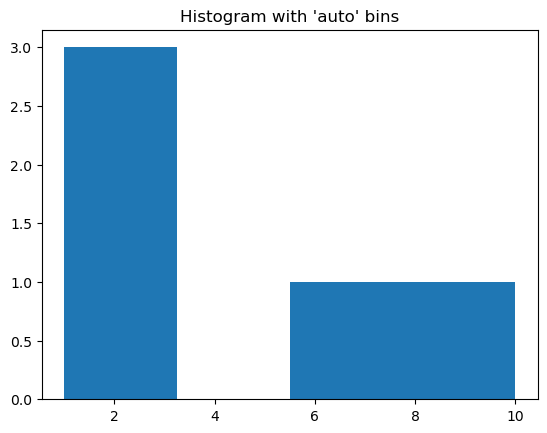

In [12]:
import matplotlib.pyplot as plt

bins = [0, 1, 2, 4, 8, 16, 32, 64]

_ = plt.hist(count, bins='auto')  # arguments are passed to np.histogram

plt.title("Histogram with 'auto' bins")
#Text(0.5, 1.0, "Histogram with 'auto' bins")

plt.show()

In [76]:
#c_0_1
#c_1_2
#c_2_4

bins = [0, 1, 2, 4, 8, 16, 32, 64]
for index in range(0, len(outputs1)):
    #if index == 106:
        # for i, layer in enumerate(write_layer):
    print('Capa', index, Net2.layers[index].__class__.__name__)
    a = outputs1[index]
    print('size',a.size)
    print('shape',a.shape)
    b=a.flatten(order='F')
    print('size despues',b.size)
    print('shape',b.shape)
    datos =b
    
    counts, bin_edges = np.histogram(datos, bins)
    print(f"INTERVALO     CONTADOR")
    for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
        print(f"{f'{low}-{hight}': <14}    {count}")
    #print(collections.Counter(b))
    #unique, counts = np.unique(b, return_counts=True)
    ##print(dict(zip(unique, counts)))
    #c=np.asarray(np.where(b>0 ))
    #print('c',c)
    #print(b.max())
    #print(b.min())

Capa 0 InputLayer
size 150528
shape (1, 224, 224, 3)
size despues 150528
shape (150528,)
INTERVALO     CONTADOR
0-1               150528
1-2               0
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 1 Lambda
size 150528
shape (1, 224, 224, 3)
size despues 150528
shape (150528,)
INTERVALO     CONTADOR
0-1               150528
1-2               0
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 2 Lambda
size 150528
shape (1, 224, 224, 3)
size despues 150528
shape (150528,)
INTERVALO     CONTADOR
0-1               150528
1-2               0
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 3 Conv2D
size 1204224
shape (1, 112, 112, 96)
size despues 1204224
shape (1204224,)
INTERVALO     CONTADOR
0-1               502439
1-2               97726
2-4               220
4-8               0
8-16              0
16-32         

INTERVALO     CONTADOR
0-1               167765
1-2               0
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 36 Conv2D
size 401408
shape (1, 56, 56, 128)
size despues 401408
shape (401408,)
INTERVALO     CONTADOR
0-1               125618
1-2               91
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 37 ReLU
size 401408
shape (1, 56, 56, 128)
size despues 401408
shape (401408,)
INTERVALO     CONTADOR
0-1               401408
1-2               0
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 38 ReLU
size 401408
shape (1, 56, 56, 128)
size despues 401408
shape (401408,)
INTERVALO     CONTADOR
0-1               401317
1-2               91
2-4               0
4-8               0
8-16              0
16-32             0
32-64             0
Capa 39 Concatenate
size 802816
shape (1, 56, 56, 256)
size despues 8028

INTERVALO     CONTADOR
0-1               32757
1-2               2946
2-4               5069
4-8               6241
8-16              2735
16-32             424
32-64             4
Capa 98 Concatenate
size 100352
shape (1, 14, 14, 512)
size despues 100352
shape (100352,)
INTERVALO     CONTADOR
0-1               67618
1-2               10963
2-4               10432
4-8               7982
8-16              2925
16-32             428
32-64             4
Capa 99 Lambda
size 100352
shape (1, 14, 14, 512)
size despues 100352
shape (100352,)
INTERVALO     CONTADOR
0-1               67603
1-2               10966
2-4               10443
4-8               7982
8-16              2926
16-32             428
32-64             4
Capa 100 Lambda
size 100352
shape (1, 14, 14, 512)
size despues 100352
shape (100352,)
INTERVALO     CONTADOR
0-1               67603
1-2               10966
2-4               10443
4-8               7982
8-16              2926
16-32             428
32-64             4
Capa 1

In [31]:
datos

array([0.        , 0.        , 0.02539062, 0.9746094 , 0.        ,
       0.        , 0.        , 0.        ], dtype=float32)

In [119]:
datos =[ -0.1,0.2,1,6,8,-8,63,2,64,32]

bins = [-64,-32,-16,-8,-4,-2,-1,0, 1, 2, 4, 8, 16, 32, 64]

counts, bin_edges = np.histogram(datos, bins)

print(f"INTERVALO     CONTADOR")
for low, hight, count in zip(bin_edges, np.roll(bin_edges, -1), counts):
    print(f"{f'{low}-{hight}': <14}    {count}")

INTERVALO     CONTADOR
-64--32           0
-32--16           0
-16--8            0
-8--4             1
-4--2             0
-2--1             0
-1-0              1
0-1               1
1-2               1
2-4               1
4-8               1
8-16              1
16-32             0
32-64             3


In [ ]:
for vector in error_mask:
        h=collections.Counter(vector)
        print('h',h) 
        c.append(h['1'])
        #count= count+1
        #if count==num_fallos
    print('c',c)
    print(len(c))
    print(len(error_mask))
    
    # los elementos que mas se repiten 
    print('los elementos que mas se repiten',h.most_common(3))

    a=Counter(c)
    print(a)
    for i in a:
        bit.append(i)
        frec.append(a[i])


    print('bit',bit)
    print('frec',frec)
    print(graficar(bit,frec,j))
    del c
    

In [ ]:
fig= plt.figure(figsize=(20,5), dpi= 100)
plt.rcParams.update({'font.size': 10})
fig, ax = plt.subplots()



ax.set_xlim(0,10)
ax.set_ylim(0,30)


a= ax.bar(x=bit, height = frec,color='g')

#ax.set_title('Number of errors by words')
ax.set_xlabel('Bits')
ax.set_ylabel('Frequency')
plt.grid(color = 'gray', linestyle = 'dashed')
ax.bar_label(ax.containers[0])

In [30]:
print(a.shape)

(1, 8)


In [27]:
a.flatten(order='F')

array([0.        , 0.        , 0.        , 0.        , 0.00390625,
       0.        , 0.99609375, 0.        ], dtype=float32)

In [19]:
collections.Counter(a)

TypeError: unhashable type: 'numpy.ndarray'

In [7]:
#new_mask=[]
#locs_modif=[]
#locs_ok=[]
#mask_ok = []
#for i in range(255):
#    print('inicio ciclo')
#    count=0
#    for j,k in enumerate(mask_array):
#        print('j',j)
#        print('vias_array[j]',vias_array[j])
#        print('i',i)
#        if vias_array[j]==i:
#            if count<5:
#                print('count',count)
#                mask_ok.append(k)
#                locs_ok.append(locs_array[j])
#                count=count+1
#                print('count_sumador',count)
#            else :
#                print('dentro del primer else')
#                print('vias_array[j]',vias_array[j-1])
#                print('vias_array[j]',vias_array[j])
#                if vias_array[j-1]==vias_array[j]:
#                    print('es igual y guardo aquí')
#                    new_mask.append(k)
#                    locs_modif.append(locs_array[j])
#                else:
#                    print('dentro del segundo else')
#                    #count=0
#                    #print('brak......................')
#                    #break
##print('locs_modif',locs_modif)      
##print('locs_ok',locs_ok)  
#print('locs_modif',len(locs_modif)    )  
#print('locs_ok',len(locs_ok)  )

In [ ]:
890880,296193,307457]

In [25]:
new_mask=[]
new_locs=[]
count_others=0
for i in range(255):
    count=0
    print('primer for')
    
    
    for j,k in enumerate(mask_array):
       
        print('segundo for')
        print('j',j)
        while count<5:
            if vias_array[j]==i :
                new_mask.append(k)
                new_locs.append(locs_array[j])
                print('en el primer if')
                print('vias_array[j]',vias_array[j])
                print('i',i)
                count+=1
        #if count==5:
            #break
             
            
       # elif count==5 and j<100 and vias_array[j]!=vias_array[j+1]:
       # 
       #    
       #     print('elif')
       #     print('vias_array[j]',vias_array[j])
       #     print('vias_array[j+1]',vias_array[j+1])
       #     count_others+=1
       #     break
            
         
            
   
        
            
                
        
print(len(new_mask)  )    
print(len(new_locs)  )
#print('count_others',count_others)

primer for
segundo for
j 0
en el primer if
vias_array[j] [0]
i 0
en el primer if
vias_array[j] [0]
i 0
en el primer if
vias_array[j] [0]
i 0
en el primer if
vias_array[j] [0]
i 0
en el primer if
vias_array[j] [0]
i 0
segundo for
j 1
segundo for
j 2
segundo for
j 3
segundo for
j 4
segundo for
j 5
segundo for
j 6
segundo for
j 7
segundo for
j 8
segundo for
j 9
segundo for
j 10
segundo for
j 11
segundo for
j 12
segundo for
j 13
segundo for
j 14
segundo for
j 15
segundo for
j 16
segundo for
j 17
segundo for
j 18
segundo for
j 19
segundo for
j 20
segundo for
j 21
segundo for
j 22
segundo for
j 23
segundo for
j 24
segundo for
j 25
segundo for
j 26
segundo for
j 27
segundo for
j 28
segundo for
j 29
segundo for
j 30
segundo for
j 31
segundo for
j 32
segundo for
j 33
segundo for
j 34
segundo for
j 35
segundo for
j 36
segundo for
j 37
segundo for
j 38
segundo for
j 39
segundo for
j 40
segundo for
j 41
segundo for
j 42
segundo for
j 43
segundo for
j 44
segundo for
j 45
segundo for
j 46
segundo fo

KeyboardInterrupt: 

In [260]:
unique, counts = np.unique(vias, return_counts=True)
print(unique, counts)
print(len(counts))

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

In [202]:
mask_array[29]

array(['xxxxxxx0xxxxxxx0'], dtype=object)

In [237]:
new_mask=[]
new_loc=[]
c=0
k=1
for i  in range(c,len(mask_array)):
    print('i',i)
    print('j',j)
    while k<5:
        new_mask.append(j)
        print('new_mask',new_mask)
        k+=1
        print('k',k)
    c=29    
  
    
   
    print('i luego',i)
    k=1
        
        
        
        
   # while j =! j[i-1]:
        #print(j)
        
        #new_mask.append(mask_array[i])
        #new_loc.append(loc_array[i])
        
       

i 0
j [8193]
new_mask [array([8193], dtype=int64)]
k 2
new_mask [array([8193], dtype=int64), array([8193], dtype=int64)]
k 3
new_mask [array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64)]
k 4
new_mask [array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64)]
k 5
i luego 0
i 1
j [8193]
new_mask [array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64)]
k 2
new_mask [array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64)]
k 3
new_mask [array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dtype=int64)]
k 4
new_mask [array([8193], dtype=int64), array([8193], dtype=int64), array([8193], dt

In [ ]:
#La idea es las 5 primeras máscars donde el tercer valor de la tupla sea igual
# las modifico colocandolas todas en xxx x ejemplo y las demás las mantengo y así hasta que ese 3er elemento 
#cambie d evalor donde hago lo mismo con la s5 promeras y mantengo las demas 

In [241]:
a= Modelo_original.to_numpy().tolist()
a

[['x0xxxxxxx1xxxxxx', 99584, 0],
 ['0xxxxxxx1xxxxxxx', 100864, 0],
 ['xxxx1xxxxxxx0xxx', 101376, 0],
 ['xxxx1xxxxxxx1xxx', 150784, 0],
 ['xxxxxxx1xxxxxxx1', 219648, 0],
 ['xxxxx0xxxxxxx0xx', 237312, 0],
 ['xxx0xxxxxxx0xxxx', 244992, 0],
 ['xx0xxxxxxx0xxxxx', 247296, 0],
 ['xxxx0xxxxxxx1xxx', 247808, 0],
 ['xxx1xxxxxxx1xxxx', 278016, 0],
 ['x1xxxxxx1xxxxxxx', 322560, 0],
 ['xx1xxxxxxx1xxxxx', 336896, 0],
 ['xx0xxxxxxx1xxxxx', 337664, 0],
 ['xxxxx0xxxxxxx0xx', 357376, 0],
 ['xxxx1xxx0xxxxxxx', 432128, 0],
 ['xxxxxx1xxxxxxx1x', 446208, 0],
 ['xxxx1xxxxxxx1xxx', 476928, 0],
 ['xxx1xxxxxxx1xxxx', 708864, 0],
 ['xxxxxx1xxxxxxx0x', 783616, 0],
 ['xxxxxx1xxxxxxx1x', 784896, 0],
 ['xxxxxx0xxxxxxx0x', 792064, 0],
 ['x0xxxxxxx1xxxxxx', 935168, 0],
 ['xxxxxx0xxxxxxx0x', 962048, 0],
 ['xxx0xxxxxxx1xxxx', 979456, 0],
 ['xxx0xxxxxxx1xxxx', 992000, 0],
 ['xxxxxx1xxxxxxx1x', 1015296, 0],
 ['x1xxxxxxx0xxxxxx', 1017344, 0],
 ['xxxx1xxxxxxx1xxx', 1025792, 0],
 ['x1xxxxxxx1xxxxxx', 1026560, 0],
 ['xxxxxxx0

In [252]:
unique, counts = np.unique(a, return_counts=True)
print(unique, counts)
print(len(counts))

['0' '0xxxxxxx0xxxxxxx' '0xxxxxxx1xxxxxxx' ... 'xxxxxxx1xxxxxx1x'
 'xxxxxxx1xxxxxxx0' 'xxxxxxx1xxxxxxx1'] [ 29 151 151 ...   1 166 131]
5979


In [253]:
unique

array(['0', '0xxxxxxx0xxxxxxx', '0xxxxxxx1xxxxxxx', ...,
       'xxxxxxx1xxxxxx1x', 'xxxxxxx1xxxxxxx0', 'xxxxxxx1xxxxxxx1'],
      dtype='<U16')

In [254]:
counts

array([ 29, 151, 151, ...,   1, 166, 131], dtype=int64)

In [98]:
Modelo_original.shape

(5557, 3)

In [131]:
group_by=Modelo_original.groupby('error_mask_H_L_O')
group_by

In [132]:
group_by.describe()

locs_H_L_O                                                    \
                      count           mean            std       min       25%   
error_mask_H_L_O                                                                
0xxxxxxx0xxxxxxx      151.0  388225.264901  345446.765594    1477.0   96554.5   
0xxxxxxx1xxxxxxx      151.0  385042.079470  338425.355769   12896.0   77802.0   
10xxxx1xxxxxxx0x        1.0   24011.000000            NaN   24011.0   24011.0   
1x0xxxxx0x1xxxxx        1.0  630486.000000            NaN  630486.0  630486.0   
1xxxxxxx0xxxxxxx      140.0  398453.092857  330003.738222   17512.0  100395.5   
...                     ...            ...            ...       ...       ...   
xxxxxxx1xxxxx1xx        5.0  457514.600000  370882.643513   30998.0  287351.0   
xxxxxxx1xxxxxx0x        4.0  288275.250000   47390.480615  219228.0  281049.0   
xxxxxxx1xxxxxx1x        1.0  861856.000000            NaN  861856.0  861856.0   
xxxxxxx1xxxxxxx0      166.0  406186.343373  330633.967340    8247.0  142429.5   
xxxxxxx1xxxxxxx1      131.0  403341.969466  321791.094132    4623.0  122772.0   

                                                   vias              \
                       50%        75%        max  count        mean   
error_mask_H_L_O                                                      
0xxxxxxx0xxxxxxx  244161.0  688053.00  1007600.0  151.0  139.437086   
0xxxxxxx1xxxxxxx  244707.0  663923.50  1007598.0  151.0  135.059603   
10xxxx1xxxxxxx0x   24011.0   24011.00    24011.0    1.0  203.000000   
1x0xxxxx0x1xxxxx  630486.0  630486.00   630486.0    1.0  214.000000   
1xxxxxxx0xxxxxxx  321149.5  667112.75  1007445.0  140.0  129.892857   
...                    ...        ...        ...    ...         ...   
xxxxxxx1xxxxx1xx  419485.0  513652.00  1036087.0    5.0   93.800000   
xxxxxxx1xxxxxx0x  303386.5  310612.75   327100.0    4.0  147.250000   
xxxxxxx1xxxxxx1x  861856.0  861856.00   861856.0    1.0  160.000000   
xxxxxxx1xxxxxxx0  302827.0  630573.50  1043883.0  166.0  116.367470   
xxxxxxx1xxxxxxx1  304494.0  575237.50  1043510.0  131.0  124.381679   

                                                                  
                        std    min     25%    50%     75%    max  
error_mask_H_L_O                                                  
0xxxxxxx0xxxxxxx  72.989641    1.0   79.00  151.0  204.50  253.0  
0xxxxxxx1xxxxxxx  73.962804    0.0   77.00  134.0  197.00  253.0  
10xxxx1xxxxxxx0x        NaN  203.0  203.00  203.0  203.00  203.0  
1x0xxxxx0x1xxxxx        NaN  214.0  214.00  214.0  214.00  214.0  
1xxxxxxx0xxxxxxx  75.128159    4.0   62.75  124.5  200.50  254.0  
...                     ...    ...     ...    ...     ...    ...  
xxxxxxx1xxxxx1xx  54.274303   22.0   55.00  116.0  119.00  157.0  
xxxxxxx1xxxxxx0x  67.485184   88.0   91.00  140.0  196.25  221.0  
xxxxxxx1xxxxxx1x        NaN  160.0  160.00  160.0  160.00  160.0  
xxxxxxx1xxxxxxx0  73.220074    1.0   56.00  100.0  180.00  254.0  
xxxxxxx1xxxxxxx1  72.100300    0.0   61.00  124.0  178.00  254.0  

[166 rows x 16 columns]

In [154]:
Modelo_original=pd.read_excel('Modelo_original/estatics/Estad_H_L_O0.xlsx' )

In [156]:
Modelo_original

,error_mask_H_L_O,locs_H_L_O,vias
0,x0xxxxxxx1xxxxxx,99584,0
1,0xxxxxxx1xxxxxxx,100864,0
2,xxxx1xxxxxxx0xxx,101376,0
3,xxxx1xxxxxxx1xxx,150784,0
4,xxxxxxx1xxxxxxx1,219648,0
...,...,...,...
5552,xxxx0xxxxxxx1xxx,545279,255
5553,1xxxxxxx1xxxxxxx,777471,255
5554,xxxxxx1xxxxxxx0x,785151,255
5555,xxxxxxx10xxxxxxx,861951,255


In [165]:
freq = Modelo_original["vias"].value_counts()
print(freq)

97     35
222    34
41     33
238    33
231    32
       ..
34     13
219    12
179    12
255    12
127    11
Name: vias, Length: 256, dtype: int64


In [161]:
np.where(((Modelo_original["locs_H_L_O"]%256).value_counts()))

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [162]:
Modelo_original["locs_H_L_O"]%256

0         0
1         0
2         0
3         0
4         0
       ... 
5552    255
5553    255
5554    255
5555    255
5556    255
Name: locs_H_L_O, Length: 5557, dtype: int64

In [153]:
for vias in Modelo_original:
        print('Nombre de la columna: ', column)
        print('Contenido de la columna: ', Modelo_original[column].values)

Nombre de la columna:  vias
Contenido de la columna:  [  0   0   0 ... 255 255 255]
Nombre de la columna:  vias
Contenido de la columna:  [  0   0   0 ... 255 255 255]
Nombre de la columna:  vias
Contenido de la columna:  [  0   0   0 ... 255 255 255]


In [124]:
c = 0
for index, row in Modelo_original.iterrows():
    a=(row['vias']%256)
    #print(index,row['vias'])
    
  

In [ ]:
print(np.where(array == 'D'))

In [85]:
unique, counts = np.unique(vias, return_counts=True)
#print(dict(zip(unique, counts)))
#b=np.asarray(np.where(counts>5))
print(np.where(counts>5))

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 1

In [76]:
mask_vbw=Modelo_original.iloc[locs_H_L_O]
mask_vbw

IndexError: positional indexers are out-of-bounds

In [42]:
import collections

sales=[0, 100, 100, 80, 70, 80, 20, 10, 100, 100, 80, 70, 10, 30, 40]  

print(collections.Counter(sales))


Counter({100: 4, 80: 3, 70: 2, 10: 2, 0: 1, 20: 1, 30: 1, 40: 1})


In [44]:
import collections, numpy

aUnique = numpy.array([0, 100, 100, 80, 70, 80, 20, 10, 100, 
100, 80, 70, 10, 30, 40])

unique, counts = numpy.unique(aUnique, return_counts=True)

print(dict(zip(unique, counts)))


{0: 1, 10: 2, 20: 1, 30: 1, 40: 1, 70: 2, 80: 3, 100: 4}


In [50]:
b.size

4

In [22]:
ruta_bin = 'ficheros_index'       
#ruta_bin = 'Data\Fault Characterization\VC707\RawData\VC707-0.54.bin'
#ruta_bin = 'Data/Fault Characterization/KC705_B/RowData/KC705B-0.59.bin'
ruta_bin = 'Data\Fault Characterization\VC707\Alterado\VC707-0.54.bin'
directorio = pathlib.Path(ruta_bin)


#variantes= [analize_file, analize_file_uno, analize_file_uno_ceros]
#ficheros = [fichero.name for fichero in directorio.iterdir()]

In [ ]:
for i,x in enumerate(np_array):
    
    if i in mbuffer:
        print(i)
         #a.itemset
            np.where(mbuffer.index==i)
        mbuffer[i]=random.randint(0, 1)
        print(mbuffer[i])
        
    
#fin = time.time()
#time_run = fin - inicio 
#print(time_run)
#print(mbuffer)
print(len(buffer))
print((mbuffer))

In [ ]:
np.where(np.index == var)

In [ ]:
#ruta_bin = 'MoRS/Modelo3_col_8_0.52/index'
ruta_bin = 'MoRS/Modelo3_mas_fallos_col_8_experimentos/index'
directorio = pathlib.Path(ruta_bin)
ficheros = [fichero.name for fichero in directorio.iterdir()]

ficheros.sort()

In [24]:
from funciones import buffer_vectores
#buffer_size = 16777216
#buffer_size = 64
buffer_size = 64



fich=0


mbuffer = np.array(['x']*(buffer_size))
print(len(mbuffer))

np_array = [0,15,35,36,63]
# print(np_array)
count_fallos=0


for i,x in enumerate(mbuffer):
        #print(x)
    if i in np_array:
        print(i)
        mbuffer[i]=random.randint(0, 1)
        count_fallos += 1

dist = collections.Counter(mbuffer)
        #print(mbuffer[i])
print(len(mbuffer))
print((mbuffer))
print(dist)
print('count_fallos',count_fallos)


mod=np.array(['x']*8)
union=np.concatenate([mod, mbuffer])
union=union[:-8]
print(len(union))
error_mask, locs = (buffer_vectores(union[0:buffer_size]))
    #error_mask, locs = (buffer_vectores(mbuffer))

print('tamaño de error mask',(error_mask))
print('tamaño de error locs',(locs))

64
0
15
35
36
63
64
['0' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' '0' 'x' 'x'
 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' '0'
 '1' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x'
 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' 'x' '1']
Counter({'x': 59, '0': 3, '1': 2})
count_fallos 5
64
soy el buffer dentro de funciones 64
 dentro de funciones Cantidad de elementos por tipo : Counter({'x': 60, '0': 3, '1': 1})
tamaño de error mask ['xxxxxxxx0xxxxxxx', 'xxxxxxx0xxxxxxxx', 'xxxxxxxxxxx01xxx']
tamaño de error locs [0, 1, 2]
